This notebook is an adaptation from Lisa Alazraki's notebook used for training the previous version of the chatbot (https://www.doc.ic.ac.uk/~ae/papers/Lisa_Alazraki_report.pdf).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%%capture
!pip install transformers tokenizers
!pip install git+https://github.com/PyTorchLightning/pytorch-lightning
!pip install "ray[tune]"

In [ ]:
#package imports 

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
import pytorch_lightning as pl

from transformers import DistilBertTokenizer, AutoTokenizer, AutoModelWithLMHead, DistilBertForSequenceClassification, AdamW, get_linear_schedule_with_warmup, BertTokenizer, RobertaTokenizer
from tokenizers import ByteLevelBPETokenizer
from tokenizers.processors import BertProcessing
from ray import tune
from ray.tune.integration.pytorch_lightning import TuneReportCallback

from typing import List
import logging
import copy
import os
import sys
import gc
import random
from functools import lru_cache
from argparse import Namespace
from packaging import version
from tqdm.autonotebook import tqdm

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

In [ ]:
def set_seed(seed):
  random.seed(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

set_seed(21)

In [ ]:
train_path = "/content/drive/MyDrive/Individual Project/Data/Emotion/bt_train_equal.txt"
test_path = "/content/drive/MyDrive/Individual Project/Data/Emotion/bt_test_equal.txt"
val_path = "/content/drive/MyDrive/Individual Project/Data/Emotion/bt_val_equal.txt"

In [ ]:
#create a dictionary which associates each string label to an integer value
labels = [ "sadness", "joy", "anger", "fear", "love", "instability", "disgust", "disappointment", "shame", "guilt", "envy", "jealous"]
label2int = dict(zip(labels, list(range(len(labels)))))

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('roberta-base')

!mkdir -p tokenizer

tokenizer.save_pretrained("tokenizer")

!ls tokenizer

Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

merges.txt		 tokenizer_config.json	vocab.json
special_tokens_map.json  tokenizer.json


In [ ]:
#define an EmoClassificationModel that is going to be performing the fine-tuning

class EmotionClassificationModel(nn.Module):
    def __init__(self, base_model, n_classes, base_model_output_size=768, dropout=0.05):
        super().__init__()
        self.base_model = base_model
        
        self.classifier = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(base_model_output_size, base_model_output_size),
            nn.Mish(),
            nn.Dropout(dropout),
            nn.Linear(base_model_output_size, n_classes)
        )
        
        for layer in self.classifier:
            if isinstance(layer, nn.Linear):
                layer.weight.data.normal_(mean=0.0, std=0.02)
                if layer.bias is not None:
                    layer.bias.data.zero_()

    def forward(self, input_, *args):
        X, attention_mask = input_
        hidden_states = self.base_model(X, attention_mask=attention_mask)
        
        return self.classifier(hidden_states[0][:, 0, :])

In [ ]:
#implementation of CollateFN to do tokenization and batches of sequences
#this helps with the batching and parallelising of tokenised content during
#training

class TokenizersCollateFn:
    def __init__(self, max_tokens=512): 

        t = ByteLevelBPETokenizer(
            "/content/tokenizer/vocab.json",
            "/content/tokenizer/merges.txt"
        )
        t._tokenizer.post_processor = BertProcessing(
            ("</s>", t.token_to_id("</s>")),
            ("<s>", t.token_to_id("<s>")),
        )
        t.enable_truncation(max_tokens)
        t.enable_padding(pad_id=t.token_to_id("<pad>"))
        self.tokenizer = t

    def __call__(self, batch):
        encoded = self.tokenizer.encode_batch([x[0] for x in batch])
        sequences_padded = torch.tensor([enc.ids for enc in encoded])
        attention_masks_padded = torch.tensor([enc.attention_mask for enc in encoded])
        labels = torch.tensor([x[1] for x in batch])
        
        return (sequences_padded, attention_masks_padded), labels

In [ ]:
class EmotionDataset(Dataset):
    def __init__(self, path):
        super().__init__()
        self.data_column = "text"
        self.class_column = "class"
        self.data = pd.read_csv(path, sep=";", header=None, names=[self.data_column, self.class_column],
                               engine="python")

    def __getitem__(self, idx):
        return self.data.loc[idx, self.data_column], label2int[self.data.loc[idx, self.class_column]]

    def __len__(self):
        return self.data.shape[0]

In [ ]:
class TrainingModule(pl.LightningModule):
    def __init__(self, params):
        super().__init__()
        self.model = EmotionClassificationModel(AutoModelWithLMHead.from_pretrained("roberta-base").base_model, len(labels))
        self.loss = nn.CrossEntropyLoss()
        self.save_hyperparameters(params)
        self.train_path = params['train_path']
        self.test_path = params['test_path']
        self.val_path = params['val_path']
        self.lr = params['lr']
        self.epochs = params['epochs']
        self.batch_size = params['batch_size']
        self.accumulate_grad_batches = params['accumulate_grad_batches']
        self.warmup_steps = params['warmup_steps']

    def step(self, batch, step_name="train"):
        X, y = batch
        loss = self.loss(self.forward(X), y)
        loss_key = f"{step_name}_loss"
        tensorboard_logs = {loss_key: loss}
        self.log(f"ptl/{loss_key}", loss)

        return { ("loss" if step_name == "train" else loss_key): loss, 'log': tensorboard_logs,
               "progress_bar": {loss_key: loss}}

    def forward(self, X, *args):
        return self.model(X, *args)

    def training_step(self, batch, batch_idx):
        return self.step(batch, "train")
    
    def validation_step(self, batch, batch_idx):
        return self.step(batch, "val")

    def validation_end(self, outputs: List[dict]):
        loss = torch.stack([x["val_loss"] for x in outputs]).mean()
        return {"val_loss": loss}
        
    def test_step(self, batch, batch_idx):
        return self.step(batch, "test")
    
    def train_dataloader(self):
        return self.create_data_loader(self.train_path, shuffle=True)

    def val_dataloader(self):
        return self.create_data_loader(self.val_path)

    def test_dataloader(self):
        return self.create_data_loader(self.test_path)
                
    def create_data_loader(self, ds_path: str, shuffle=False):
        return DataLoader(
                    EmotionDataset(ds_path),
                    batch_size=self.batch_size,
                    num_workers=4,
                    shuffle=shuffle,
                    collate_fn=TokenizersCollateFn()
        )


    def total_steps(self):
        return len(self.train_dataloader()) // self.accumulate_grad_batches * self.epochs

    def configure_optimizers(self):
        optimizer = AdamW(self.model.parameters(), lr=self.lr) #we use AdamW as this usually performs well
        lr_scheduler = get_linear_schedule_with_warmup(
                    optimizer,
                    num_warmup_steps=self.warmup_steps,
                    num_training_steps=self.total_steps(),
        )
        return [optimizer], [{"scheduler": lr_scheduler, "interval": "step"}]

    def save_model(self):
        torch.save(self.model.state_dict(), '/content/RoBERTa_finetuned_bt.pt')

In [ ]:
#chosen hyperparams:
train_config = dict(
    train_path=train_path,
    val_path=val_path,
    test_path=test_path,
    batch_size=16,
    warmup_steps=100,
    epochs=10,
    lr=5E-05,
    accumulate_grad_batches=2
)

In [ ]:
model = TrainingModule(train_config)

/usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
  FutureWarning,


Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

In [ ]:
#rubbish collection
gc.collect()
torch.cuda.empty_cache()

In [ ]:
trainer = pl.Trainer(gpus=1, max_epochs=train_config['epochs'],
                     accumulate_grad_batches=train_config['accumulate_grad_batches'])

trainer.fit(model)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:440: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: /content/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,

  | Name  | Type                       | Params
--------------------------------------------------

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [ ]:
with torch.no_grad():
    progress = ["/", "-", "\\", "|", "/", "-", "\\", "|"]
    model.eval().cuda()
    true_y, pred_y = [], []
    for i, batch_ in enumerate(model.test_dataloader()):
        (X, attn), y = batch_
        batch = (X.cuda(), attn.cuda())
        print(progress[i % len(progress)], end="\r")
        y_pred = torch.argmax(model(batch), dim=1)
        true_y.extend(y.cpu())
        pred_y.extend(y_pred.cpu())
print("\n" + "_" * 80)
print(classification_report(true_y, pred_y, target_names=label2int.keys(), digits=4))

\
________________________________________________________________________________
                precision    recall  f1-score   support

       sadness     0.5312    0.7727    0.6296        22
           joy     0.8333    0.9091    0.8696        22
         anger     0.7931    0.7931    0.7931        29
          fear     0.9259    0.8621    0.8929        29
          love     0.9167    0.8800    0.8980        25
   instability     0.8235    0.6364    0.7179        22
       disgust     0.9524    0.8333    0.8889        24
disappointment     0.8667    0.7222    0.7879        18
         shame     0.9583    1.0000    0.9787        23
         guilt     0.9259    0.9259    0.9259        27
          envy     0.9167    0.9565    0.9362        23
       jealous     0.9630    0.9630    0.9630        27

      accuracy                         0.8591       291
     macro avg     0.8672    0.8545    0.8568       291
  weighted avg     0.8711    0.8591    0.8614       291



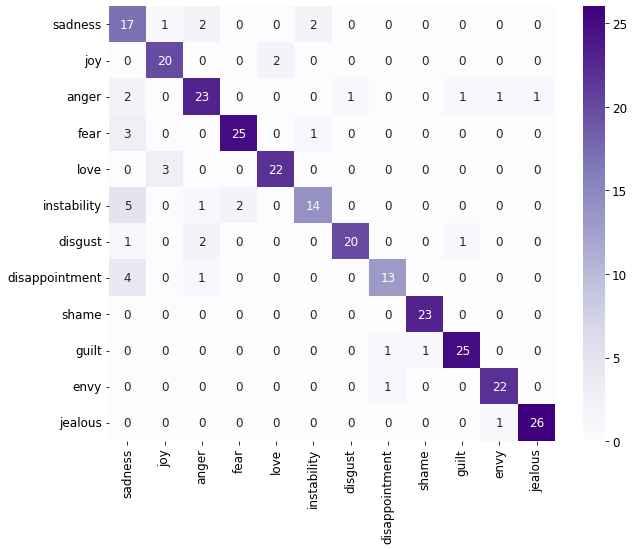

In [ ]:
#plot confusion matrix

cm = confusion_matrix(true_y, pred_y, labels=range(len(labels)))
df_cm = pd.DataFrame(cm, index = labels, columns = labels)

plt.rcParams.update({'font.size': 12}) 
plt.figure(figsize = (10,8));
sn.heatmap(df_cm, annot=True, cmap='Purples', fmt='g');

In [ ]:
model.save_model()

Hyperparamter Tuning

In [ ]:
tune_config = dict(
    train_path=train_path,
    val_path=val_path,
    test_path=test_path,
    warmup_steps=100,
    # parameters to tune
    batch_size=tune.grid_search([4,8,16,32]),
    lr=tune.grid_search([1.35E-4, 5E-4, 1.35E-5, 5E-5, 1.35E-6]),
    epochs=tune.grid_search([6, 10, 16, 20]),
    accumulate_grad_batches=tune.grid_search([1,2,4,8])
)

In [ ]:
def tune_model(config, num_gpus=1):
    model = TrainingModule(config)
    metrics = {"loss": "ptl/val_loss"}
    trainer = pl.Trainer(
        max_epochs=config['epochs'],
        gpus=num_gpus,
        accumulate_grad_batches=config['accumulate_grad_batches'],
        callbacks=[TuneReportCallback(metrics, on="validation_end")])
    trainer.fit(model)

In [ ]:
trainable = tune.with_parameters(
    tune_model,
    num_gpus = 1
)

In [ ]:
analysis = tune.run(
    trainable,
    resources_per_trial = {
        "cpu": 4,
        "gpu": 1
    },
    metric="loss",
    mode="min",
    num_samples=1,
    config=tune_config
)

print(analysis.best_config)

2022-06-27 19:51:18,345	WARNING function_runner.py:604 -- Function checkpointing is disabled. This may result in unexpected behavior when using checkpointing features or certain schedulers. To enable, set the train function arguments to be `func(config, checkpoint_dir=None)`.


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


(tune_model pid=1391) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=1391)   FutureWarning,
(tune_model pid=1391) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=1391)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=1391) GPU available: True (cuda), used: True
(tune_model pid=1391) TPU available: False, using: 0 TPU cores
(tune_model pid=1391) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


(tune_model pid=1391) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=1391) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=1391)   FutureWarning,
(tune_model pid=1391) 
(tune_model pid=1391)   | Name  | Type                       | Params
(tune_model pid=1391) -----------------------------------------------------
(tune_model pid=1391) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=1391) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=1391) -----------------------------------------------------
(tune_model pid=1391) 124 M     Trainable params
(tune_model pid=1391) 0         Non-trainable params
(tune_model pid=1391) 124 M     Total params
(tune_model pid=1391) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 40.57it/s]
                                                                           
Epoch 0:   0%|          | 0/654 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  12%|█▏        | 80/654 [00:05<00:42, 13.57it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  24%|██▍       | 160/654 [00:10<00:33, 14.75it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  37%|███▋      | 240/654 [00:15<00:27, 15.23it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  49%|████▉     | 320/654 [00:20<00:21, 15.50it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  61%|██████    | 400/654 [00:25<00:16, 15.67it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  73%|███████▎  | 480/654 [00:30<00:11, 15.76it/s, loss=2.53, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  86%|████████▌ | 560/654 [00:35<00:05, 15.84it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135
tune_model_82e42_00001,PENDING,,2,4,5,0.000135
tune_model_82e42_00002,PENDING,,4,4,5,0.000135
tune_model_82e42_00003,PENDING,,8,4,5,0.000135
tune_model_82e42_00004,PENDING,,1,8,5,0.000135
tune_model_82e42_00005,PENDING,,2,8,5,0.000135
tune_model_82e42_00006,PENDING,,4,8,5,0.000135
tune_model_82e42_00007,PENDING,,8,8,5,0.000135
tune_model_82e42_00008,PENDING,,1,16,5,0.000135
tune_model_82e42_00009,PENDING,,2,16,5,0.000135


Epoch 0:  89%|████████▊ | 580/654 [00:36<00:04, 15.85it/s, loss=2.5, v_num=0] 
(tune_model pid=1391) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=1391) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:00<00:00, 61.34it/s]
Result for tune_model_82e42_00000:
  date: 2022-06-27_19-52-15
  done: false
  experiment_id: 52764a5b32284b01ae35ffdc66f8ad06
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.494936943054199
  node_ip: 172.28.0.2
  pid: 1391
  time_since_restore: 47.159727334976196
  time_this_iter_s: 47.159727334976196
  time_total_s: 47.159727334976196
  timestamp: 1656359535
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00000
  warmup_time: 0.0038843154907226562
  
(tune_model pid=1391) 
Epoch 0: 100%|██████████| 654/654 [00:38<00:00, 17.15it/s, loss=2.5, v_num=0]


(tune_model pid=1391) tcmalloc: large alloc 1151361024 bytes == 0xae174000 @  0x7f0617e6d615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f0417f19e24 0x7f0417fb8484 0x7f0417f8b4a0 0x7f039dfc2ea5 0x7f039dfbe604 0x7f039dfc6185 0x7f0417f8b9f2 0x7f0417c673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=1391) tcmalloc: large alloc 1439203328 bytes == 0xf4fe6000 @  0x7f0617e6d615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f0417f19e24 0x7f0417fb8484 0x7f0417f8b4a0 0x7f039dfc2ea5 0x7f039dfbe604 0x7f039dfc6185 0x7f0417f8b9f2 0x7f0417c673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=1391) tcmalloc: large alloc 1799004160 bytes == 0x14ac6e000 @  0x7f0617e6d615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f0417f19e24 0x7f0417fb8484 0x7f0417f8b4a0 0x7

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:   0%|          | 0/654 [00:00<?, ?it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:   9%|▉         | 60/654 [00:04<00:41, 14.15it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:  21%|██▏       | 140/654 [00:09<00:33, 15.23it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:  34%|███▎      | 220/654 [00:14<00:27, 15.59it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:  49%|████▉     | 320/654 [00:20<00:21, 15.77it/s, loss=2.44, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:  61%|██████    | 400/654 [00:25<00:16, 15.87it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:  73%|███████▎  | 480/654 [00:30<00:10, 15.94it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:  86%|████████▌ | 560/654 [00:35<00:05, 15.97it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,1,47.1597,2.49494
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:36<00:04, 15.97it/s, loss=2.5, v_num=0] 
(tune_model pid=1391) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=1391) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 59.63it/s]
Result for tune_model_82e42_00000:
  date: 2022-06-27_19-53-02
  done: false
  experiment_id: 52764a5b32284b01ae35ffdc66f8ad06
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 2.4897518157958984
  node_ip: 172.28.0.2
  pid: 1391
  time_since_restore: 94.93732833862305
  time_this_iter_s: 47.77760100364685
  time_total_s: 94.93732833862305
  timestamp: 1656359582
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00000
  warmup_time: 0.0038843154907226562
  
(tune_model pid=1391) 
Epoch 1: 100%|██████████| 654/654 [00:38<00:00, 17.19it/s, loss=2.5, v_num=0]


(tune_model pid=1391) tcmalloc: large alloc 1799004160 bytes == 0x14ac6e000 @  0x7f0617e6d615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f0417f19e24 0x7f0417fb8484 0x7f0417f8b4a0 0x7f039dfc2ea5 0x7f039dfbe604 0x7f039dfc6185 0x7f0417f8b9f2 0x7f0417c673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:   6%|▌         | 40/654 [00:02<00:45, 13.38it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:  18%|█▊        | 120/654 [00:07<00:35, 15.14it/s, loss=2.53, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:  31%|███       | 200/654 [00:12<00:29, 15.53it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:  43%|████▎     | 280/654 [00:17<00:23, 15.73it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:  55%|█████▌    | 360/654 [00:22<00:18, 15.90it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:  67%|██████▋   | 440/654 [00:27<00:13, 15.96it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:  80%|███████▉  | 520/654 [00:32<00:08, 15.99it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,2,94.9373,2.48975
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:36<00:04, 16.01it/s, loss=2.51, v_num=0]
(tune_model pid=1391) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=1391) 
Epoch 2:  95%|█████████▍| 620/654 [00:37<00:02, 16.50it/s, loss=2.51, v_num=0]
(tune_model pid=1391) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 59.03it/s]
Result for tune_model_82e42_00000:
  date: 2022-06-27_19-53-52
  done: false
  experiment_id: 52764a5b32284b01ae35ffdc66f8ad06
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 2.4912800788879395
  node_ip: 172.28.0.2
  pid: 1391
  time_since_restore: 144.69642090797424
  time_this_iter_s: 49.759092569351196
  time_total_s: 144.69642090797424
  timestamp: 1656359632
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00000
  warmup_time: 0.0038843154907226562
  
(tune_model pid=1391) 
Epoch 2: 100%|██████████| 654/654 [00:38<00:00, 17.15it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


(tune_model pid=1391) tcmalloc: large alloc 1799004160 bytes == 0x14ac6e000 @  0x7f0617e6d615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f0417f19e24 0x7f0417fb8484 0x7f0417f8b4a0 0x7f039dfc2ea5 0x7f039dfbe604 0x7f039dfc6185 0x7f0417f8b9f2 0x7f0417c673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:03<00:46, 13.33it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:  18%|█▊        | 120/654 [00:07<00:35, 15.18it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:  31%|███       | 200/654 [00:12<00:29, 15.59it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:  43%|████▎     | 280/654 [00:17<00:23, 15.79it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:  55%|█████▌    | 360/654 [00:22<00:18, 15.90it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:  67%|██████▋   | 440/654 [00:27<00:13, 15.98it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:  83%|████████▎ | 540/654 [00:33<00:07, 16.06it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,3,144.696,2.49128
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:36<00:04, 16.08it/s, loss=2.46, v_num=0]
(tune_model pid=1391) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=1391) 
Epoch 3:  95%|█████████▍| 620/654 [00:37<00:02, 16.60it/s, loss=2.46, v_num=0]
(tune_model pid=1391) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 59.94it/s]
Result for tune_model_82e42_00000:
  date: 2022-06-27_19-54-42
  done: false
  experiment_id: 52764a5b32284b01ae35ffdc66f8ad06
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 2.526226282119751
  node_ip: 172.28.0.2
  pid: 1391
  time_since_restore: 194.22231340408325
  time_this_iter_s: 49.52589249610901
  time_total_s: 194.22231340408325
  timestamp: 1656359682
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00000
  warmup_time: 0.0038843154907226562
  
(tune_model pid=1391) 
Epoch 3: 100%|██████████| 654/654 [00:37<00:00, 17.25it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:03<00:46, 13.09it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:  18%|█▊        | 120/654 [00:07<00:35, 15.06it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:  31%|███       | 200/654 [00:12<00:29, 15.47it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:  43%|████▎     | 280/654 [00:17<00:24, 15.58it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:  55%|█████▌    | 360/654 [00:23<00:19, 15.42it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:  67%|██████▋   | 440/654 [00:28<00:13, 15.45it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:  80%|███████▉  | 520/654 [00:33<00:08, 15.55it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:37<00:04, 15.59it/s, loss=2.5, v_num=0] 
(tune_model pid=1391) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=1391) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 59.02it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,4,194.222,2.52623
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 58.59it/s]
Result for tune_model_82e42_00000:
  date: 2022-06-27_19-55-32
  done: false
  experiment_id: 52764a5b32284b01ae35ffdc66f8ad06
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 2.505855083465576
  node_ip: 172.28.0.2
  pid: 1391
  time_since_restore: 244.8867747783661
  time_this_iter_s: 50.66446137428284
  time_total_s: 244.8867747783661
  timestamp: 1656359732
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00000
  warmup_time: 0.0038843154907226562
  
(tune_model pid=1391) 
Epoch 4: 100%|██████████| 654/654 [00:39<00:00, 16.72it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,5,244.887,2.50586
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00000,RUNNING,172.28.0.2:1391,1,4,5,0.000135,5,244.887,2.50586
tune_model_82e42_00001,PENDING,,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,


Epoch 4: 100%|██████████| 654/654 [00:50<00:00, 12.90it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00000:
  date: 2022-06-27_19-55-32
  done: true
  experiment_id: 52764a5b32284b01ae35ffdc66f8ad06
  experiment_tag: 0_accumulate_grad_batches=1,batch_size=4,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 2.505855083465576
  node_ip: 172.28.0.2
  pid: 1391
  time_since_restore: 244.8867747783661
  time_this_iter_s: 50.66446137428284
  time_total_s: 244.8867747783661
  timestamp: 1656359732
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00000
  warmup_time: 0.0038843154907226562
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


(tune_model pid=2186) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=2186)   FutureWarning,
(tune_model pid=2186) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=2186)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=2186) GPU available: True (cuda), used: True
(tune_model pid=2186) TPU available: False, using: 0 TPU cores
(tune_model pid=2186) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


(tune_model pid=2186) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=2186) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=2186)   FutureWarning,
(tune_model pid=2186) 
(tune_model pid=2186)   | Name  | Type                       | Params
(tune_model pid=2186) -----------------------------------------------------
(tune_model pid=2186) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=2186) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=2186) -----------------------------------------------------
(tune_model pid=2186) 124 M     Trainable params
(tune_model pid=2186) 0         Non-trainable params
(tune_model pid=2186) 124 M     Total params
(tune_model pid=2186) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   3%|▎         | 20/654 [00:01<00:50, 12.49it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 0:  21%|██▏       | 140/654 [00:07<00:28, 17.77it/s, loss=2.11, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 0:  37%|███▋      | 240/654 [00:12<00:21, 19.01it/s, loss=1.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 0:  52%|█████▏    | 340/654 [00:17<00:16, 19.61it/s, loss=1.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 0:  70%|███████   | 460/654 [00:22<00:09, 20.01it/s, loss=1.41, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 0:  86%|████████▌ | 560/654 [00:27<00:04, 20.18it/s, loss=1.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,,,
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:28<00:03, 20.21it/s, loss=1.76, v_num=0]
(tune_model pid=2186) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=2186) 
Epoch 0:  95%|█████████▍| 620/654 [00:29<00:01, 20.84it/s, loss=1.76, v_num=0]
(tune_model pid=2186) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:00<00:00, 60.92it/s]
Result for tune_model_82e42_00001:
  date: 2022-06-27_19-56-33
  done: false
  experiment_id: 3945ea186ef04125be3c02a092be9ab4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.7535563707351685
  node_ip: 172.28.0.2
  pid: 2186
  time_since_restore: 37.17199158668518
  time_this_iter_s: 37.17199158668518
  time_total_s: 37.17199158668518
  timestamp: 1656359793
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00001
  warmup_time: 0.004045248031616211
  
(tune_model pid=2186) 
Epoch 0: 100%|██████████| 654/654 [00:30<00:00, 21.56it/s, loss=1.74, v_num=0]


(tune_model pid=2186) tcmalloc: large alloc 1151361024 bytes == 0xf7420000 @  0x7f03d17cd615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f01d1882e24 0x7f01d1921484 0x7f01d18f44a0 0x7f015792bea5 0x7f0157927604 0x7f015792f185 0x7f01d18f49f2 0x7f01d15d03f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=2186) tcmalloc: large alloc 1439203328 bytes == 0x13be26000 @  0x7f03d17cd615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f01d1882e24 0x7f01d1921484 0x7f01d18f44a0 0x7f015792bea5 0x7f0157927604 0x7f015792f185 0x7f01d18f49f2 0x7f01d15d03f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=2186) tcmalloc: large alloc 1799004160 bytes == 0x7eff42c56000 @  0x7f03d17cd615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f01d1882e24 0x7f01d1921484 0x7f01d18f44a0

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 1:  12%|█▏        | 80/654 [00:04<00:32, 17.87it/s, loss=1.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 1:  28%|██▊       | 180/654 [00:09<00:24, 19.42it/s, loss=1.2, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 1:  43%|████▎     | 280/654 [00:14<00:18, 19.94it/s, loss=1.15, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 1:  58%|█████▊    | 380/654 [00:18<00:13, 20.13it/s, loss=1.11, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 1:  76%|███████▋  | 500/654 [00:24<00:07, 20.33it/s, loss=1.15, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:28<00:03, 20.39it/s, loss=1.06, v_num=0]
(tune_model pid=2186) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=2186) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 60.96it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,1,37.172,1.75356
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 1:  98%|█████████▊| 640/654 [00:29<00:00, 21.35it/s, loss=1.06, v_num=0]
(tune_model pid=2186) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:00<00:00, 61.11it/s]
Result for tune_model_82e42_00001:
  date: 2022-06-27_19-57-13
  done: false
  experiment_id: 3945ea186ef04125be3c02a092be9ab4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 1.0338279008865356
  node_ip: 172.28.0.2
  pid: 2186
  time_since_restore: 77.67048358917236
  time_this_iter_s: 40.49849200248718
  time_total_s: 77.67048358917236
  timestamp: 1656359833
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00001
  warmup_time: 0.004045248031616211
  
(tune_model pid=2186) 
Epoch 1: 100%|██████████| 654/654 [00:30<00:00, 21.64it/s, loss=1.01, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


(tune_model pid=2186) tcmalloc: large alloc 1799004160 bytes == 0xf7420000 @  0x7f03d17cd615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f01d1882e24 0x7f01d1921484 0x7f01d18f44a0 0x7f015792bea5 0x7f0157927604 0x7f015792f185 0x7f01d18f49f2 0x7f01d15d03f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 2:   6%|▌         | 40/654 [00:02<00:40, 15.31it/s, loss=0.733, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 2:  21%|██▏       | 140/654 [00:07<00:27, 18.87it/s, loss=0.791, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 2:  37%|███▋      | 240/654 [00:12<00:21, 19.65it/s, loss=0.858, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 2:  55%|█████▌    | 360/654 [00:17<00:14, 20.00it/s, loss=0.749, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 2:  70%|███████   | 460/654 [00:22<00:09, 20.18it/s, loss=0.657, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 2:  86%|████████▌ | 560/654 [00:27<00:04, 20.28it/s, loss=0.675, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,2,77.6705,1.03383
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:28<00:03, 20.30it/s, loss=0.646, v_num=0]
(tune_model pid=2186) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=2186) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 59.52it/s]
Result for tune_model_82e42_00001:
  date: 2022-06-27_19-57-56
  done: false
  experiment_id: 3945ea186ef04125be3c02a092be9ab4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 1.0016878843307495
  node_ip: 172.28.0.2
  pid: 2186
  time_since_restore: 120.20786905288696
  time_this_iter_s: 42.5373854637146
  time_total_s: 120.20786905288696
  timestamp: 1656359876
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00001
  warmup_time: 0.004045248031616211
  
(tune_model pid=2186) 
Epoch 2: 100%|██████████| 654/654 [00:30<00:00, 21.40it/s, loss=0.596, v_num=0]


(tune_model pid=2186) E0627 19:57:58.674220022    2217 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


(tune_model pid=2186) tcmalloc: large alloc 1799004160 bytes == 0xf7420000 @  0x7f03d17cd615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f01d1882e24 0x7f01d1921484 0x7f01d18f44a0 0x7f015792bea5 0x7f0157927604 0x7f015792f185 0x7f01d18f49f2 0x7f01d15d03f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:02<00:39, 15.62it/s, loss=0.439, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 3:  21%|██▏       | 140/654 [00:07<00:27, 18.70it/s, loss=0.524, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 3:  37%|███▋      | 240/654 [00:12<00:21, 19.39it/s, loss=0.418, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 3:  52%|█████▏    | 340/654 [00:17<00:15, 19.74it/s, loss=0.757, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 3:  70%|███████   | 460/654 [00:22<00:09, 20.01it/s, loss=0.37, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 3:  86%|████████▌ | 560/654 [00:28<00:04, 19.96it/s, loss=0.371, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,3,120.208,1.00169
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:29<00:03, 19.99it/s, loss=0.27, v_num=0] 
(tune_model pid=2186) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=2186) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 59.96it/s]
Result for tune_model_82e42_00001:
  date: 2022-06-27_19-58-39
  done: false
  experiment_id: 3945ea186ef04125be3c02a092be9ab4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.6717062592506409
  node_ip: 172.28.0.2
  pid: 2186
  time_since_restore: 163.14337849617004
  time_this_iter_s: 42.93550944328308
  time_total_s: 163.14337849617004
  timestamp: 1656359919
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00001
  warmup_time: 0.004045248031616211
  
(tune_model pid=2186) 
Epoch 3: 100%|██████████| 654/654 [00:31<00:00, 21.08it/s, loss=0.347, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:02<00:40, 15.20it/s, loss=0.227, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4:  21%|██▏       | 140/654 [00:07<00:27, 18.56it/s, loss=0.264, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4:  37%|███▋      | 240/654 [00:12<00:21, 19.06it/s, loss=0.316, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4:  52%|█████▏    | 340/654 [00:17<00:16, 19.43it/s, loss=0.214, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4:  67%|██████▋   | 440/654 [00:22<00:10, 19.64it/s, loss=0.291, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4:  83%|████████▎ | 540/654 [00:27<00:05, 19.68it/s, loss=0.29, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,4,163.143,0.671706
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:29<00:03, 19.77it/s, loss=0.136, v_num=0]
(tune_model pid=2186) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=2186) 
Epoch 4:  95%|█████████▍| 620/654 [00:30<00:01, 20.18it/s, loss=0.136, v_num=0]
(tune_model pid=2186) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:00<00:00, 61.60it/s]
Result for tune_model_82e42_00001:
  date: 2022-06-27_19-59-22
  done: false
  experiment_id: 3945ea186ef04125be3c02a092be9ab4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.6986970901489258
  node_ip: 172.28.0.2
  pid: 2186
  time_since_restore: 206.43792414665222
  time_this_iter_s: 43.29454565048218
  time_total_s: 206.43792414665222
  timestamp: 1656359962
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00001
  warmup_time: 0.004045248031616211
  
(tune_model pid=2186) 
Epoch 4: 100%|██████████| 654/654 [00:31<00:00, 20.90it/s, loss=0.179, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,5,206.438,0.698697
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00001,RUNNING,172.28.0.2:2186,2,4,5,0.000135,5,206.438,0.698697
tune_model_82e42_00002,PENDING,,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,


Epoch 4: 100%|██████████| 654/654 [00:43<00:00, 15.19it/s, loss=0.179, v_num=0]
Result for tune_model_82e42_00001:
  date: 2022-06-27_19-59-22
  done: true
  experiment_id: 3945ea186ef04125be3c02a092be9ab4
  experiment_tag: 1_accumulate_grad_batches=2,batch_size=4,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.6986970901489258
  node_ip: 172.28.0.2
  pid: 2186
  time_since_restore: 206.43792414665222
  time_this_iter_s: 43.29454565048218
  time_total_s: 206.43792414665222
  timestamp: 1656359962
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00001
  warmup_time: 0.004045248031616211
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


(tune_model pid=3085) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=3085)   FutureWarning,
(tune_model pid=3085) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=3085)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=3085) GPU available: True (cuda), used: True
(tune_model pid=3085) TPU available: False, using: 0 TPU cores
(tune_model pid=3085) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


(tune_model pid=3085) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=3085) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=3085)   FutureWarning,
(tune_model pid=3085) 
(tune_model pid=3085)   | Name  | Type                       | Params
(tune_model pid=3085) -----------------------------------------------------
(tune_model pid=3085) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=3085) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=3085) -----------------------------------------------------
(tune_model pid=3085) 124 M     Trainable params
(tune_model pid=3085) 0         Non-trainable params
(tune_model pid=3085) 124 M     Total params
(tune_model pid=3085) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   6%|▌         | 40/654 [00:03<00:46, 13.08it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 0:  21%|██▏       | 140/654 [00:07<00:27, 18.60it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 0:  40%|███▉      | 260/654 [00:12<00:19, 20.13it/s, loss=1.67, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 0:  58%|█████▊    | 380/654 [00:18<00:13, 20.77it/s, loss=1.42, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 0:  73%|███████▎  | 480/654 [00:22<00:08, 21.04it/s, loss=1.59, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:27<00:03, 21.20it/s, loss=1.36, v_num=0]
(tune_model pid=3085) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3085) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 57.74it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,,,
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.58it/s]
Result for tune_model_82e42_00002:
  date: 2022-06-27_20-00-18
  done: false
  experiment_id: 989935f57e624bfb8be35b94267aa470
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.1495884656906128
  node_ip: 172.28.0.2
  pid: 3085
  time_since_restore: 35.744303941726685
  time_this_iter_s: 35.744303941726685
  time_total_s: 35.744303941726685
  timestamp: 1656360018
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00002
  warmup_time: 0.0039560794830322266
  
(tune_model pid=3085) 
Epoch 0: 100%|██████████| 654/654 [00:29<00:00, 22.48it/s, loss=1.41, v_num=0]


(tune_model pid=3085) tcmalloc: large alloc 1151361024 bytes == 0xaf16e000 @  0x7fa7d49ec615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa5d4aa3e24 0x7fa5d4b42484 0x7fa5d4b154a0 0x7fa55ab4cea5 0x7fa55ab48604 0x7fa55ab50185 0x7fa5d4b159f2 0x7fa5d47f13f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=3085) tcmalloc: large alloc 1439203328 bytes == 0xf5fe0000 @  0x7fa7d49ec615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa5d4aa3e24 0x7fa5d4b42484 0x7fa5d4b154a0 0x7fa55ab4cea5 0x7fa55ab48604 0x7fa55ab50185 0x7fa5d4b159f2 0x7fa5d47f13f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=3085) tcmalloc: large alloc 1799004160 bytes == 0x14bc68000 @  0x7fa7d49ec615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa5d4aa3e24 0x7fa5d4b42484 0x7fa5d4b154a0 0x7

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,1,35.7443,1.14959
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,1,35.7443,1.14959
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 1:  12%|█▏        | 80/654 [00:04<00:29, 19.34it/s, loss=1.09, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,1,35.7443,1.14959
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 1:  31%|███       | 200/654 [00:09<00:21, 20.97it/s, loss=0.815, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,1,35.7443,1.14959
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 1:  49%|████▉     | 320/654 [00:14<00:15, 21.40it/s, loss=0.897, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,1,35.7443,1.14959
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 1:  64%|██████▍   | 420/654 [00:19<00:10, 21.61it/s, loss=0.962, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,1,35.7443,1.14959
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 1:  83%|████████▎ | 540/654 [00:24<00:05, 21.70it/s, loss=1.12, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,1,35.7443,1.14959
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:26<00:03, 21.73it/s, loss=0.789, v_num=0]
(tune_model pid=3085) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3085) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.35it/s]
Result for tune_model_82e42_00002:
  date: 2022-06-27_20-00-57
  done: false
  experiment_id: 989935f57e624bfb8be35b94267aa470
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7271676659584045
  node_ip: 172.28.0.2
  pid: 3085
  time_since_restore: 74.3278157711029
  time_this_iter_s: 38.58351182937622
  time_total_s: 74.3278157711029
  timestamp: 1656360057
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00002
  warmup_time: 0.0039560794830322266
  
(tune_model pid=3085) 
Epoch 1: 100%|██████████| 654/654 [00:28<00:00, 22.91it/s, loss=0.82, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,2,74.3278,0.727168
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


(tune_model pid=3085) tcmalloc: large alloc 1799004160 bytes == 0x14bc68000 @  0x7fa7d49ec615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa5d4aa3e24 0x7fa5d4b42484 0x7fa5d4b154a0 0x7fa55ab4cea5 0x7fa55ab48604 0x7fa55ab50185 0x7fa5d4b159f2 0x7fa5d47f13f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,2,74.3278,0.727168
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 2:   9%|▉         | 60/654 [00:03<00:33, 17.96it/s, loss=0.635, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,2,74.3278,0.727168
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 2:  24%|██▍       | 160/654 [00:08<00:24, 19.86it/s, loss=0.727, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,2,74.3278,0.727168
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 2:  43%|████▎     | 280/654 [00:13<00:17, 20.93it/s, loss=0.659, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,2,74.3278,0.727168
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 2:  58%|█████▊    | 380/654 [00:17<00:12, 21.38it/s, loss=0.475, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,2,74.3278,0.727168
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 2:  76%|███████▋  | 500/654 [00:23<00:07, 21.67it/s, loss=0.505, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,2,74.3278,0.727168
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:26<00:03, 21.84it/s, loss=0.586, v_num=0]
(tune_model pid=3085) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3085) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 59.66it/s]
Result for tune_model_82e42_00002:
  date: 2022-06-27_20-01-37
  done: false
  experiment_id: 989935f57e624bfb8be35b94267aa470
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.5914826393127441
  node_ip: 172.28.0.2
  pid: 3085
  time_since_restore: 114.56749153137207
  time_this_iter_s: 40.239675760269165
  time_total_s: 114.56749153137207
  timestamp: 1656360097
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00002
  warmup_time: 0.0039560794830322266
  
(tune_model pid=3085) 
Epoch 2: 100%|██████████| 654/654 [00:28<00:00, 22.91it/s, loss=0.529, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


(tune_model pid=3085) tcmalloc: large alloc 1799004160 bytes == 0x14bc68000 @  0x7fa7d49ec615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa5d4aa3e24 0x7fa5d4b42484 0x7fa5d4b154a0 0x7fa55ab4cea5 0x7fa55ab48604 0x7fa55ab50185 0x7fa5d4b159f2 0x7fa5d47f13f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:02<00:37, 16.51it/s, loss=0.277, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 3:  24%|██▍       | 160/654 [00:07<00:24, 20.28it/s, loss=0.432, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 3:  40%|███▉      | 260/654 [00:12<00:18, 20.84it/s, loss=0.365, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 3:  58%|█████▊    | 380/654 [00:18<00:13, 20.92it/s, loss=0.31, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 3:  73%|███████▎  | 480/654 [00:22<00:08, 20.93it/s, loss=0.224, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:27<00:03, 21.08it/s, loss=0.391, v_num=0]
(tune_model pid=3085) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3085) 
Validation DataLoader 0:   0%|          | 0/73 [00:00<?, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,3,114.567,0.591483
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 3:  92%|█████████▏| 600/654 [00:28<00:02, 21.02it/s, loss=0.391, v_num=0]
(tune_model pid=3085) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.64it/s]
(tune_model pid=3085) 
Epoch 3: 100%|██████████| 654/654 [00:29<00:00, 22.20it/s, loss=0.391, v_num=0]
Result for tune_model_82e42_00002:
  date: 2022-06-27_20-02-18
  done: false
  experiment_id: 989935f57e624bfb8be35b94267aa470
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.4686674475669861
  node_ip: 172.28.0.2
  pid: 3085
  time_since_restore: 155.73414611816406
  time_this_iter_s: 41.16665458679199
  time_total_s: 155.73414611816406
  timestamp: 1656360138
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00002
  warmup_time: 0.0039560794830322266
  
Epoch 3: 100%|██████████| 654/654 [00:29<00:00, 22.18it/s, loss=0.371, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:02<00:38, 16.07it/s, loss=0.186, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4:  24%|██▍       | 160/654 [00:07<00:24, 20.22it/s, loss=0.151, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4:  40%|███▉      | 260/654 [00:12<00:18, 21.01it/s, loss=0.215, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4:  58%|█████▊    | 380/654 [00:17<00:12, 21.39it/s, loss=0.145, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4:  76%|███████▋  | 500/654 [00:23<00:07, 21.62it/s, loss=0.137, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:26<00:03, 21.68it/s, loss=0.307, v_num=0]
(tune_model pid=3085) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3085) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 58.00it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,4,155.734,0.468667
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4:  98%|█████████▊| 640/654 [00:28<00:00, 22.40it/s, loss=0.307, v_num=0]
(tune_model pid=3085) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.20it/s]
Result for tune_model_82e42_00002:
  date: 2022-06-27_20-02-59
  done: false
  experiment_id: 989935f57e624bfb8be35b94267aa470
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.45411476492881775
  node_ip: 172.28.0.2
  pid: 3085
  time_since_restore: 196.33561992645264
  time_this_iter_s: 40.601473808288574
  time_total_s: 196.33561992645264
  timestamp: 1656360179
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00002
  warmup_time: 0.0039560794830322266
  
(tune_model pid=3085) 
Epoch 4: 100%|██████████| 654/654 [00:28<00:00, 22.69it/s, loss=0.217, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,5,196.336,0.454115
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00002,RUNNING,172.28.0.2:3085,4,4,5,0.000135,5,196.336,0.454115
tune_model_82e42_00003,PENDING,,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,


Epoch 4: 100%|██████████| 654/654 [00:40<00:00, 16.13it/s, loss=0.217, v_num=0]
Result for tune_model_82e42_00002:
  date: 2022-06-27_20-02-59
  done: true
  experiment_id: 989935f57e624bfb8be35b94267aa470
  experiment_tag: 2_accumulate_grad_batches=4,batch_size=4,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.45411476492881775
  node_ip: 172.28.0.2
  pid: 3085
  time_since_restore: 196.33561992645264
  time_this_iter_s: 40.601473808288574
  time_total_s: 196.33561992645264
  timestamp: 1656360179
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00002
  warmup_time: 0.0039560794830322266
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


(tune_model pid=3895) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=3895)   FutureWarning,
(tune_model pid=3895) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=3895)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=3895) GPU available: True (cuda), used: True
(tune_model pid=3895) TPU available: False, using: 0 TPU cores
(tune_model pid=3895) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


(tune_model pid=3895) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=3895) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=3895)   FutureWarning,


Sanity Checking: 0it [00:00, ?it/s]


(tune_model pid=3895) 
(tune_model pid=3895)   | Name  | Type                       | Params
(tune_model pid=3895) -----------------------------------------------------
(tune_model pid=3895) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=3895) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=3895) -----------------------------------------------------
(tune_model pid=3895) 124 M     Trainable params
(tune_model pid=3895) 0         Non-trainable params
(tune_model pid=3895) 124 M     Total params
(tune_model pid=3895) 498.619   Total estimated model params size (MB)


                                                                           
Epoch 0:   6%|▌         | 40/654 [00:02<00:45, 13.58it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 0:  24%|██▍       | 160/654 [00:08<00:25, 19.75it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 0:  43%|████▎     | 280/654 [00:13<00:17, 21.27it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 0:  61%|██████    | 400/654 [00:18<00:11, 21.91it/s, loss=1.65, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 0:  76%|███████▋  | 500/654 [00:22<00:06, 22.18it/s, loss=1.17, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,,,
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:26<00:03, 22.25it/s, loss=1, v_num=0]   
(tune_model pid=3895) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3895) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 58.39it/s]
Result for tune_model_82e42_00003:
  date: 2022-06-27_20-03-55
  done: false
  experiment_id: 6c4f84fa773f4c0896fab80de56d5874
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 0.9561800360679626
  node_ip: 172.28.0.2
  pid: 3895
  time_since_restore: 34.579712867736816
  time_this_iter_s: 34.579712867736816
  time_total_s: 34.579712867736816
  timestamp: 1656360235
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00003
  warmup_time: 0.0037279129028320312
  
(tune_model pid=3895) 
Epoch 0: 100%|██████████| 654/654 [00:27<00:00, 23.54it/s, loss=0.993, v_num=0]


(tune_model pid=3895) tcmalloc: large alloc 1151361024 bytes == 0xaf284000 @  0x7fb574be0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fb374c8fe24 0x7fb374d2e484 0x7fb374d014a0 0x7fb2fad38ea5 0x7fb2fad34604 0x7fb2fad3c185 0x7fb374d019f2 0x7fb3749dd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=3895) tcmalloc: large alloc 1439203328 bytes == 0xf60f6000 @  0x7fb574be0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fb374c8fe24 0x7fb374d2e484 0x7fb374d014a0 0x7fb2fad38ea5 0x7fb2fad34604 0x7fb2fad3c185 0x7fb374d019f2 0x7fb3749dd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=3895) tcmalloc: large alloc 1799004160 bytes == 0x14bd7e000 @  0x7fb574be0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fb374c8fe24 0x7fb374d2e484 0x7fb374d014a0 0x7

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,1,34.5797,0.95618
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 1:   0%|          | 0/654 [00:00<?, ?it/s, loss=0.993, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,1,34.5797,0.95618
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 1:  15%|█▌        | 100/654 [00:05<00:28, 19.76it/s, loss=0.881, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,1,34.5797,0.95618
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 1:  31%|███       | 200/654 [00:09<00:21, 21.19it/s, loss=0.864, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,1,34.5797,0.95618
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 1:  49%|████▉     | 320/654 [00:14<00:15, 21.69it/s, loss=0.934, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,1,34.5797,0.95618
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 1:  67%|██████▋   | 440/654 [00:20<00:09, 21.93it/s, loss=1.06, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,1,34.5797,0.95618
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 1:  83%|████████▎ | 540/654 [00:24<00:05, 22.06it/s, loss=0.818, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,1,34.5797,0.95618
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:26<00:03, 22.10it/s, loss=0.878, v_num=0]
(tune_model pid=3895) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3895) 
Epoch 1:  95%|█████████▍| 620/654 [00:27<00:01, 22.50it/s, loss=0.878, v_num=0]
(tune_model pid=3895) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.37it/s]
Result for tune_model_82e42_00003:
  date: 2022-06-27_20-04-33
  done: false
  experiment_id: 6c4f84fa773f4c0896fab80de56d5874
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7042075395584106
  node_ip: 172.28.0.2
  pid: 3895
  time_since_restore: 72.66018056869507
  time_this_iter_s: 38.08046770095825
  time_total_s: 72.66018056869507
  timestamp: 1656360273
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00003
  warmup_time: 0.0037279129028320312
  
(tune_model pid=3895) 
Epoch 1: 100%|██████████| 654/654 [00:28<00:00, 23.22it/s, loss=0.882, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


(tune_model pid=3895) tcmalloc: large alloc 1799004160 bytes == 0x14bd7e000 @  0x7fb574be0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fb374c8fe24 0x7fb374d2e484 0x7fb374d014a0 0x7fb2fad38ea5 0x7fb2fad34604 0x7fb2fad3c185 0x7fb374d019f2 0x7fb3749dd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 2:   6%|▌         | 40/654 [00:02<00:37, 16.16it/s, loss=0.582, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 2:  24%|██▍       | 160/654 [00:07<00:24, 20.43it/s, loss=0.452, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 2:  40%|███▉      | 260/654 [00:12<00:18, 21.07it/s, loss=0.634, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 2:  58%|█████▊    | 380/654 [00:17<00:12, 21.29it/s, loss=0.453, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 2:  73%|███████▎  | 480/654 [00:22<00:08, 21.33it/s, loss=0.392, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:27<00:03, 21.46it/s, loss=0.557, v_num=0]
(tune_model pid=3895) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3895) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 55.81it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,2,72.6602,0.704208
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 53.96it/s]
Result for tune_model_82e42_00003:
  date: 2022-06-27_20-05-14
  done: false
  experiment_id: 6c4f84fa773f4c0896fab80de56d5874
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.6197750568389893
  node_ip: 172.28.0.2
  pid: 3895
  time_since_restore: 113.74683928489685
  time_this_iter_s: 41.08665871620178
  time_total_s: 113.74683928489685
  timestamp: 1656360314
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00003
  warmup_time: 0.0037279129028320312
  
(tune_model pid=3895) 
Epoch 2: 100%|██████████| 654/654 [00:29<00:00, 22.42it/s, loss=0.564, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


(tune_model pid=3895) tcmalloc: large alloc 1799004160 bytes == 0x14bd7e000 @  0x7fb574be0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fb374c8fe24 0x7fb374d2e484 0x7fb374d014a0 0x7fb2fad38ea5 0x7fb2fad34604 0x7fb2fad3c185 0x7fb374d019f2 0x7fb3749dd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


(tune_model pid=3895) E0627 20:05:24.379870212    3926 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Epoch 3:   6%|▌         | 40/654 [00:02<00:36, 16.68it/s, loss=0.321, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 3:  24%|██▍       | 160/654 [00:07<00:23, 20.66it/s, loss=0.323, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 3:  43%|████▎     | 280/654 [00:13<00:17, 21.29it/s, loss=0.484, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 3:  58%|█████▊    | 380/654 [00:17<00:12, 21.35it/s, loss=0.122, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 3:  73%|███████▎  | 480/654 [00:22<00:08, 21.37it/s, loss=0.244, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:27<00:03, 21.44it/s, loss=0.376, v_num=0]
(tune_model pid=3895) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3895) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 54.17it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,3,113.747,0.619775
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.13it/s]
Result for tune_model_82e42_00003:
  date: 2022-06-27_20-05-55
  done: false
  experiment_id: 6c4f84fa773f4c0896fab80de56d5874
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.46612200140953064
  node_ip: 172.28.0.2
  pid: 3895
  time_since_restore: 154.7144091129303
  time_this_iter_s: 40.96756982803345
  time_total_s: 154.7144091129303
  timestamp: 1656360355
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00003
  warmup_time: 0.0037279129028320312
  
(tune_model pid=3895) 
Epoch 3: 100%|██████████| 654/654 [00:29<00:00, 22.44it/s, loss=0.402, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,4,154.714,0.466122
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,4,154.714,0.466122
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:02<00:37, 16.27it/s, loss=0.138, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,4,154.714,0.466122
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 4:  24%|██▍       | 160/654 [00:07<00:23, 20.71it/s, loss=0.127, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,4,154.714,0.466122
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 4:  43%|████▎     | 280/654 [00:12<00:17, 21.63it/s, loss=0.17, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,4,154.714,0.466122
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 4:  58%|█████▊    | 380/654 [00:17<00:12, 21.85it/s, loss=0.181, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,4,154.714,0.466122
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 4:  76%|███████▋  | 500/654 [00:22<00:06, 22.09it/s, loss=0.109, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,4,154.714,0.466122
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:26<00:03, 22.16it/s, loss=0.131, v_num=0]
(tune_model pid=3895) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=3895) 
Epoch 4:  98%|█████████▊| 640/654 [00:27<00:00, 22.87it/s, loss=0.131, v_num=0]
(tune_model pid=3895) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.05it/s]
Result for tune_model_82e42_00003:
  date: 2022-06-27_20-06-35
  done: false
  experiment_id: 6c4f84fa773f4c0896fab80de56d5874
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4168217182159424
  node_ip: 172.28.0.2
  pid: 3895
  time_since_restore: 194.81354665756226
  time_this_iter_s: 40.09913754463196
  time_total_s: 194.81354665756226
  timestamp: 1656360395
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00003
  warmup_time: 0.0037279129028320312
  
(tune_model pid=3895) 
Epoch 4: 100%|██████████| 654/654 [00:28<00:00, 23.16it/s, loss=0.131, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,5,194.814,0.416822
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00003,RUNNING,172.28.0.2:3895,8,4,5,0.000135,5,194.814,0.416822
tune_model_82e42_00004,PENDING,,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,


Epoch 4: 100%|██████████| 654/654 [00:39<00:00, 16.36it/s, loss=0.131, v_num=0]
Result for tune_model_82e42_00003:
  date: 2022-06-27_20-06-35
  done: true
  experiment_id: 6c4f84fa773f4c0896fab80de56d5874
  experiment_tag: 3_accumulate_grad_batches=8,batch_size=4,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4168217182159424
  node_ip: 172.28.0.2
  pid: 3895
  time_since_restore: 194.81354665756226
  time_this_iter_s: 40.09913754463196
  time_total_s: 194.81354665756226
  timestamp: 1656360395
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00003
  warmup_time: 0.0037279129028320312
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


(tune_model pid=4800) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=4800)   FutureWarning,
(tune_model pid=4800) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=4800)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=4800) GPU available: True (cuda), used: True
(tune_model pid=4800) TPU available: False, using: 0 TPU cores
(tune_model pid=4800) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


(tune_model pid=4800) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=4800) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=4800)   FutureWarning,
(tune_model pid=4800) 
(tune_model pid=4800)   | Name  | Type                       | Params
(tune_model pid=4800) -----------------------------------------------------
(tune_model pid=4800) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=4800) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=4800) -----------------------------------------------------
(tune_model pid=4800) 124 M     Trainable params
(tune_model pid=4800) 0         Non-trainable params
(tune_model pid=4800) 124 M     Total params
(tune_model pid=4800) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   6%|▌         | 20/328 [00:02<00:35,  8.58it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 0:  30%|███       | 100/328 [00:07<00:16, 13.78it/s, loss=2.05, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 0:  55%|█████▍    | 180/328 [00:12<00:10, 14.09it/s, loss=1.9, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 0:  79%|███████▉  | 260/328 [00:17<00:04, 14.73it/s, loss=1.61, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,,,
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:18<00:03, 14.78it/s, loss=1.39, v_num=0]
(tune_model pid=4800) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=4800) 
Epoch 0:  91%|█████████▏| 300/328 [00:20<00:01, 14.87it/s, loss=1.39, v_num=0]
(tune_model pid=4800) 
Epoch 0:  98%|█████████▊| 320/328 [00:20<00:00, 15.59it/s, loss=1.39, v_num=0]
Result for tune_model_82e42_00004:
  date: 2022-06-27_20-07-23
  done: false
  experiment_id: dd661106425d4ca0809e463e098687ec
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.4127401113510132
  node_ip: 172.28.0.2
  pid: 4800
  time_since_restore: 27.675550937652588
  time_this_iter_s: 27.675550937652588
  time_total_s: 27.675550937652588
  timestamp: 1656360443
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00004
  warmup_time: 0.004045248031616211
  
(tune_model pid=4800) 
Epoch 0: 100%|██████████| 328/328 [00:20<00:00, 15.86it/s, loss=1.47, v_num=0]


(tune_model pid=4800) tcmalloc: large alloc 1151361024 bytes == 0xaf1e8000 @  0x7f7084ce2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6e84d8fe24 0x7f6e84e2e484 0x7f6e84e014a0 0x7f6e0ae38ea5 0x7f6e0ae34604 0x7f6e0ae3c185 0x7f6e84e019f2 0x7f6e84add3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=4800) tcmalloc: large alloc 1439203328 bytes == 0x106772000 @  0x7f7084ce2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6e84d8fe24 0x7f6e84e2e484 0x7f6e84e014a0 0x7f6e0ae38ea5 0x7f6e0ae34604 0x7f6e0ae3c185 0x7f6e84e019f2 0x7f6e84add3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=4800) tcmalloc: large alloc 1799004160 bytes == 0x15c3fa000 @  0x7f7084ce2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6e84d8fe24 0x7f6e84e2e484 0x7f6e84e014a0 0x

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,1,27.6756,1.41274
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 1:   0%|          | 0/328 [00:00<?, ?it/s, loss=1.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,1,27.6756,1.41274
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 1:  18%|█▊        | 60/328 [00:04<00:19, 13.67it/s, loss=1.31, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,1,27.6756,1.41274
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 1:  43%|████▎     | 140/328 [00:09<00:12, 14.87it/s, loss=1.31, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,1,27.6756,1.41274
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 1:  67%|██████▋   | 220/328 [00:14<00:07, 15.27it/s, loss=1.27, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,1,27.6756,1.41274
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:18<00:03, 15.40it/s, loss=1.07, v_num=0]
(tune_model pid=4800) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=4800) 
Epoch 1:  91%|█████████▏| 300/328 [00:19<00:01, 15.31it/s, loss=1.07, v_num=0]
(tune_model pid=4800) 
Epoch 1:  98%|█████████▊| 320/328 [00:19<00:00, 16.04it/s, loss=1.07, v_num=0]
Result for tune_model_82e42_00004:
  date: 2022-06-27_20-07-54
  done: false
  experiment_id: dd661106425d4ca0809e463e098687ec
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 1.2609022855758667
  node_ip: 172.28.0.2
  pid: 4800
  time_since_restore: 58.091283559799194
  time_this_iter_s: 30.415732622146606
  time_total_s: 58.091283559799194
  timestamp: 1656360474
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00004
  warmup_time: 0.004045248031616211
  
(tune_model pid=4800) 
Epoch 1: 100%|██████████| 328/328 [00:20<00:00, 16.31it/s, loss=1.27, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,2,58.0913,1.2609
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


(tune_model pid=4800) tcmalloc: large alloc 1799004160 bytes == 0x15c3fa000 @  0x7f7084ce2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6e84d8fe24 0x7f6e84e2e484 0x7f6e84e014a0 0x7f6e0ae38ea5 0x7f6e0ae34604 0x7f6e0ae3c185 0x7f6e84e019f2 0x7f6e84add3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,2,58.0913,1.2609
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 2:   6%|▌         | 20/328 [00:01<00:29, 10.41it/s, loss=1.3, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,2,58.0913,1.2609
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 2:  30%|███       | 100/328 [00:06<00:15, 14.42it/s, loss=1.02, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,2,58.0913,1.2609
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 2:  55%|█████▍    | 180/328 [00:11<00:09, 15.06it/s, loss=0.951, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,2,58.0913,1.2609
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 2:  79%|███████▉  | 260/328 [00:16<00:04, 15.31it/s, loss=0.897, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,2,58.0913,1.2609
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:18<00:03, 15.36it/s, loss=0.98, v_num=0] 
(tune_model pid=4800) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=4800) 
Epoch 2:  91%|█████████▏| 300/328 [00:19<00:01, 15.16it/s, loss=0.98, v_num=0]
(tune_model pid=4800) 
Epoch 2:  98%|█████████▊| 320/328 [00:20<00:00, 15.89it/s, loss=0.98, v_num=0]
Result for tune_model_82e42_00004:
  date: 2022-06-27_20-08-27
  done: false
  experiment_id: dd661106425d4ca0809e463e098687ec
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 1.0127809047698975
  node_ip: 172.28.0.2
  pid: 4800
  time_since_restore: 90.9380350112915
  time_this_iter_s: 32.84675145149231
  time_total_s: 90.9380350112915
  timestamp: 1656360507
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00004
  warmup_time: 0.004045248031616211
  
(tune_model pid=4800) 
Epoch 2: 100%|██████████| 328/328 [00:20<00:00, 16.16it/s, loss=1.09, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,3,90.938,1.01278
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


(tune_model pid=4800) tcmalloc: large alloc 1799004160 bytes == 0x15c3fa000 @  0x7f7084ce2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6e84d8fe24 0x7f6e84e2e484 0x7f6e84e014a0 0x7f6e0ae38ea5 0x7f6e0ae34604 0x7f6e0ae3c185 0x7f6e84e019f2 0x7f6e84add3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,3,90.938,1.01278
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 3:   6%|▌         | 20/328 [00:02<00:31,  9.89it/s, loss=0.776, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,3,90.938,1.01278
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 3:  30%|███       | 100/328 [00:07<00:16, 14.11it/s, loss=0.646, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,3,90.938,1.01278
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 3:  55%|█████▍    | 180/328 [00:12<00:09, 14.96it/s, loss=0.582, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,3,90.938,1.01278
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 3:  79%|███████▉  | 260/328 [00:17<00:04, 15.25it/s, loss=0.551, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,3,90.938,1.01278
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:18<00:03, 15.30it/s, loss=0.822, v_num=0]
(tune_model pid=4800) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=4800) 
Epoch 3:  91%|█████████▏| 300/328 [00:19<00:01, 15.12it/s, loss=0.822, v_num=0]
(tune_model pid=4800) 
Epoch 3:  98%|█████████▊| 320/328 [00:20<00:00, 15.84it/s, loss=0.822, v_num=0]
Result for tune_model_82e42_00004:
  date: 2022-06-27_20-08-59
  done: false
  experiment_id: dd661106425d4ca0809e463e098687ec
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.8026798963546753
  node_ip: 172.28.0.2
  pid: 4800
  time_since_restore: 123.35874795913696
  time_this_iter_s: 32.42071294784546
  time_total_s: 123.35874795913696
  timestamp: 1656360539
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00004
  warmup_time: 0.004045248031616211
  
(tune_model pid=4800) 
Epoch 3: 100%|██████████| 328/328 [00:20<00:00, 16.11it/s, loss=0.888, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,4,123.359,0.80268
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,4,123.359,0.80268
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 4:   6%|▌         | 20/328 [00:01<00:30, 10.21it/s, loss=0.556, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,4,123.359,0.80268
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 4:  30%|███       | 100/328 [00:06<00:15, 14.47it/s, loss=0.404, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,4,123.359,0.80268
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 4:  55%|█████▍    | 180/328 [00:11<00:09, 15.06it/s, loss=0.446, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,4,123.359,0.80268
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 4:  79%|███████▉  | 260/328 [00:16<00:04, 15.37it/s, loss=0.54, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,4,123.359,0.80268
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:18<00:03, 15.40it/s, loss=0.287, v_num=0]
(tune_model pid=4800) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=4800) 
Epoch 4:  91%|█████████▏| 300/328 [00:19<00:01, 15.15it/s, loss=0.287, v_num=0]
(tune_model pid=4800) 
Epoch 4:  98%|█████████▊| 320/328 [00:20<00:00, 15.87it/s, loss=0.287, v_num=0]
(tune_model pid=4800) 
Epoch 4: 100%|██████████| 328/328 [00:20<00:00, 16.17it/s, loss=0.287, v_num=0]
Result for tune_model_82e42_00004:
  date: 2022-06-27_20-09-31
  done: false
  experiment_id: dd661106425d4ca0809e463e098687ec
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.7176870107650757
  node_ip: 172.28.0.2
  pid: 4800
  time_since_restore: 155.8398699760437
  time_this_iter_s: 32.48112201690674
  time_total_s: 155.8398699760437
  timestamp: 1656360571
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00004
  warmup_time: 0.004045248031616211
  
Epoch 4: 100%|██████████| 328/328 [00:20<00:00, 16.15it/s, los

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,5,155.84,0.717687
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00004,RUNNING,172.28.0.2:4800,1,8,5,0.000135,5,155.84,0.717687
tune_model_82e42_00005,PENDING,,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,


Epoch 4: 100%|██████████| 328/328 [00:32<00:00, 10.05it/s, loss=0.268, v_num=0]
Result for tune_model_82e42_00004:
  date: 2022-06-27_20-09-31
  done: true
  experiment_id: dd661106425d4ca0809e463e098687ec
  experiment_tag: 4_accumulate_grad_batches=1,batch_size=8,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.7176870107650757
  node_ip: 172.28.0.2
  pid: 4800
  time_since_restore: 155.8398699760437
  time_this_iter_s: 32.48112201690674
  time_total_s: 155.8398699760437
  timestamp: 1656360571
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00004
  warmup_time: 0.004045248031616211
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


(tune_model pid=5509) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=5509)   FutureWarning,
(tune_model pid=5509) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=5509)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=5509) GPU available: True (cuda), used: True
(tune_model pid=5509) TPU available: False, using: 0 TPU cores
(tune_model pid=5509) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


(tune_model pid=5509) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=5509) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=5509)   FutureWarning,
(tune_model pid=5509) 
(tune_model pid=5509)   | Name  | Type                       | Params
(tune_model pid=5509) -----------------------------------------------------
(tune_model pid=5509) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=5509) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=5509) -----------------------------------------------------
(tune_model pid=5509) 124 M     Trainable params
(tune_model pid=5509) 0         Non-trainable params
(tune_model pid=5509) 124 M     Total params
(tune_model pid=5509) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   6%|▌         | 20/328 [00:02<00:33,  9.16it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 0:  37%|███▋      | 120/328 [00:07<00:12, 16.51it/s, loss=1.62, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 0:  67%|██████▋   | 220/328 [00:12<00:06, 17.84it/s, loss=1.27, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,,,
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:15<00:02, 18.15it/s, loss=1.18, v_num=0]
(tune_model pid=5509) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=5509) 
Epoch 0:  91%|█████████▏| 300/328 [00:16<00:01, 18.08it/s, loss=1.18, v_num=0]
(tune_model pid=5509) 
Epoch 0:  98%|█████████▊| 320/328 [00:16<00:00, 18.88it/s, loss=1.18, v_num=0]
Result for tune_model_82e42_00005:
  date: 2022-06-27_20-10-18
  done: false
  experiment_id: e9591adb1b1140fb91f505eafe07c20e
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.2023699283599854
  node_ip: 172.28.0.2
  pid: 5509
  time_since_restore: 24.158003330230713
  time_this_iter_s: 24.158003330230713
  time_total_s: 24.158003330230713
  timestamp: 1656360618
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00005
  warmup_time: 0.003948211669921875
  
(tune_model pid=5509) 
Epoch 0: 100%|██████████| 328/328 [00:17<00:00, 19.17it/s, loss=1.35, v_num=0]


(tune_model pid=5509) tcmalloc: large alloc 1151361024 bytes == 0xae650000 @  0x7f99bfeb0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f97bff66e24 0x7f97c0005484 0x7f97bffd84a0 0x7f974600fea5 0x7f974600b604 0x7f9746013185 0x7f97bffd89f2 0x7f97bfcb43f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=5509) tcmalloc: large alloc 1439203328 bytes == 0x105bda000 @  0x7f99bfeb0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f97bff66e24 0x7f97c0005484 0x7f97bffd84a0 0x7f974600fea5 0x7f974600b604 0x7f9746013185 0x7f97bffd89f2 0x7f97bfcb43f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=5509) tcmalloc: large alloc 1799004160 bytes == 0x15b862000 @  0x7f99bfeb0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f97bff66e24 0x7f97c0005484 0x7f97bffd84a0 0x

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,1,24.158,1.20237
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,1,24.158,1.20237
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 1:  18%|█▊        | 60/328 [00:03<00:16, 15.94it/s, loss=1.13, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,1,24.158,1.20237
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 1:  49%|████▉     | 160/328 [00:08<00:09, 17.99it/s, loss=0.866, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,1,24.158,1.20237
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 1:  79%|███████▉  | 260/328 [00:14<00:03, 18.43it/s, loss=0.973, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,1,24.158,1.20237
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:15<00:02, 18.47it/s, loss=0.888, v_num=0]
(tune_model pid=5509) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=5509) 
Epoch 1:  91%|█████████▏| 300/328 [00:16<00:01, 18.14it/s, loss=0.888, v_num=0]
(tune_model pid=5509) 
Epoch 1:  98%|█████████▊| 320/328 [00:16<00:00, 18.94it/s, loss=0.888, v_num=0]
Result for tune_model_82e42_00005:
  date: 2022-06-27_20-10-45
  done: false
  experiment_id: e9591adb1b1140fb91f505eafe07c20e
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.854232907295227
  node_ip: 172.28.0.2
  pid: 5509
  time_since_restore: 51.63420224189758
  time_this_iter_s: 27.47619891166687
  time_total_s: 51.63420224189758
  timestamp: 1656360645
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00005
  warmup_time: 0.003948211669921875
  
(tune_model pid=5509) 
Epoch 1: 100%|██████████| 328/328 [00:17<00:00, 19.24it/s, loss=0.663, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,2,51.6342,0.854233
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


(tune_model pid=5509) tcmalloc: large alloc 1799004160 bytes == 0x15b862000 @  0x7f99bfeb0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f97bff66e24 0x7f97c0005484 0x7f97bffd84a0 0x7f974600fea5 0x7f974600b604 0x7f9746013185 0x7f97bffd89f2 0x7f97bfcb43f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,2,51.6342,0.854233
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 2:  12%|█▏        | 40/328 [00:02<00:20, 14.15it/s, loss=0.607, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,2,51.6342,0.854233
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 2:  37%|███▋      | 120/328 [00:06<00:12, 17.29it/s, loss=0.649, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,2,51.6342,0.854233
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 2:  67%|██████▋   | 220/328 [00:12<00:05, 18.01it/s, loss=0.512, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,2,51.6342,0.854233
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:15<00:02, 17.93it/s, loss=0.418, v_num=0]
(tune_model pid=5509) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=5509) 
Epoch 2:  91%|█████████▏| 300/328 [00:17<00:01, 17.52it/s, loss=0.418, v_num=0]
(tune_model pid=5509) 
Epoch 2:  98%|█████████▊| 320/328 [00:17<00:00, 18.31it/s, loss=0.418, v_num=0]
Result for tune_model_82e42_00005:
  date: 2022-06-27_20-11-15
  done: false
  experiment_id: e9591adb1b1140fb91f505eafe07c20e
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.6641517281532288
  node_ip: 172.28.0.2
  pid: 5509
  time_since_restore: 81.51828002929688
  time_this_iter_s: 29.884077787399292
  time_total_s: 81.51828002929688
  timestamp: 1656360675
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00005
  warmup_time: 0.003948211669921875
  
(tune_model pid=5509) 
Epoch 2: 100%|██████████| 328/328 [00:17<00:00, 18.61it/s, loss=0.428, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,3,81.5183,0.664152
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


(tune_model pid=5509) tcmalloc: large alloc 1799004160 bytes == 0x15b862000 @  0x7f99bfeb0615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f97bff66e24 0x7f97c0005484 0x7f97bffd84a0 0x7f974600fea5 0x7f974600b604 0x7f9746013185 0x7f97bffd89f2 0x7f97bfcb43f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,3,81.5183,0.664152
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 3:   6%|▌         | 20/328 [00:01<00:27, 11.25it/s, loss=0.414, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,3,81.5183,0.664152
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 3:  37%|███▋      | 120/328 [00:06<00:11, 17.35it/s, loss=0.307, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,3,81.5183,0.664152
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 3:  67%|██████▋   | 220/328 [00:12<00:05, 18.26it/s, loss=0.265, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,3,81.5183,0.664152
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:15<00:02, 18.51it/s, loss=0.255, v_num=0]
(tune_model pid=5509) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=5509) 
Epoch 3:  91%|█████████▏| 300/328 [00:16<00:01, 18.09it/s, loss=0.255, v_num=0]
(tune_model pid=5509) 
Epoch 3:  98%|█████████▊| 320/328 [00:16<00:00, 18.89it/s, loss=0.255, v_num=0]
Result for tune_model_82e42_00005:
  date: 2022-06-27_20-11-44
  done: false
  experiment_id: e9591adb1b1140fb91f505eafe07c20e
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.5672338604927063
  node_ip: 172.28.0.2
  pid: 5509
  time_since_restore: 111.09146428108215
  time_this_iter_s: 29.57318425178528
  time_total_s: 111.09146428108215
  timestamp: 1656360704
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00005
  warmup_time: 0.003948211669921875
  
(tune_model pid=5509) 
Epoch 3: 100%|██████████| 328/328 [00:17<00:00, 19.19it/s, loss=0.248, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,4,111.091,0.567234
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,4,111.091,0.567234
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 4:   6%|▌         | 20/328 [00:01<00:27, 11.35it/s, loss=0.14, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,4,111.091,0.567234
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 4:  37%|███▋      | 120/328 [00:06<00:12, 17.23it/s, loss=0.142, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,4,111.091,0.567234
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 4:  67%|██████▋   | 220/328 [00:12<00:05, 18.07it/s, loss=0.103, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,4,111.091,0.567234
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:15<00:02, 18.35it/s, loss=0.222, v_num=0] 
(tune_model pid=5509) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=5509) 
Epoch 4:  91%|█████████▏| 300/328 [00:16<00:01, 17.89it/s, loss=0.222, v_num=0]
(tune_model pid=5509) 
Epoch 4:  98%|█████████▊| 320/328 [00:17<00:00, 18.69it/s, loss=0.222, v_num=0]
Result for tune_model_82e42_00005:
  date: 2022-06-27_20-12-14
  done: false
  experiment_id: e9591adb1b1140fb91f505eafe07c20e
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.5361716151237488
  node_ip: 172.28.0.2
  pid: 5509
  time_since_restore: 140.88485312461853
  time_this_iter_s: 29.793388843536377
  time_total_s: 140.88485312461853
  timestamp: 1656360734
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00005
  warmup_time: 0.003948211669921875
  
(tune_model pid=5509) 
Epoch 4: 100%|██████████| 328/328 [00:17<00:00, 18.97it/s, loss=0.282, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,5,140.885,0.536172
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00005,RUNNING,172.28.0.2:5509,2,8,5,0.000135,5,140.885,0.536172
tune_model_82e42_00006,PENDING,,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,


Epoch 4: 100%|██████████| 328/328 [00:29<00:00, 11.03it/s, loss=0.282, v_num=0]
Result for tune_model_82e42_00005:
  date: 2022-06-27_20-12-14
  done: true
  experiment_id: e9591adb1b1140fb91f505eafe07c20e
  experiment_tag: 5_accumulate_grad_batches=2,batch_size=8,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.5361716151237488
  node_ip: 172.28.0.2
  pid: 5509
  time_since_restore: 140.88485312461853
  time_this_iter_s: 29.793388843536377
  time_total_s: 140.88485312461853
  timestamp: 1656360734
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00005
  warmup_time: 0.003948211669921875
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


(tune_model pid=6216) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=6216)   FutureWarning,
(tune_model pid=6216) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=6216)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=6216) GPU available: True (cuda), used: True
(tune_model pid=6216) TPU available: False, using: 0 TPU cores
(tune_model pid=6216) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


(tune_model pid=6216) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=6216) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=6216)   FutureWarning,
(tune_model pid=6216) 
(tune_model pid=6216)   | Name  | Type                       | Params
(tune_model pid=6216) -----------------------------------------------------
(tune_model pid=6216) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=6216) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=6216) -----------------------------------------------------
(tune_model pid=6216) 124 M     Trainable params
(tune_model pid=6216) 0         Non-trainable params
(tune_model pid=6216) 124 M     Total params
(tune_model pid=6216) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 38.65it/s]
                                                                           
Epoch 0:   6%|▌         | 20/328 [00:02<00:32,  9.61it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 0:  43%|████▎     | 140/328 [00:07<00:10, 18.28it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 0:  73%|███████▎  | 240/328 [00:12<00:04, 19.42it/s, loss=1.37, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,,,
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:14<00:02, 19.67it/s, loss=1.07, v_num=0]
(tune_model pid=6216) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6216) 
Epoch 0:  91%|█████████▏| 300/328 [00:15<00:01, 19.57it/s, loss=1.07, v_num=0]
(tune_model pid=6216) 
Epoch 0:  98%|█████████▊| 320/328 [00:15<00:00, 20.37it/s, loss=1.07, v_num=0]
Result for tune_model_82e42_00006:
  date: 2022-06-27_20-12-58
  done: false
  experiment_id: 3697d1f86c824dc8ab20304c92a3a46f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 0.904910683631897
  node_ip: 172.28.0.2
  pid: 6216
  time_since_restore: 22.878323316574097
  time_this_iter_s: 22.878323316574097
  time_total_s: 22.878323316574097
  timestamp: 1656360778
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00006
  warmup_time: 0.003843545913696289
  
(tune_model pid=6216) 
Epoch 0: 100%|██████████| 328/328 [00:15<00:00, 20.67it/s, loss=1.07, v_num=0]


(tune_model pid=6216) tcmalloc: large alloc 1151361024 bytes == 0xf5f20000 @  0x7fe9c4075615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe7c4119e24 0x7fe7c41b8484 0x7fe7c418b4a0 0x7fe74a1c2ea5 0x7fe74a1be604 0x7fe74a1c6185 0x7fe7c418b9f2 0x7fe7c3e673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=6216) tcmalloc: large alloc 1439203328 bytes == 0x13a926000 @  0x7fe9c4075615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe7c4119e24 0x7fe7c41b8484 0x7fe7c418b4a0 0x7fe74a1c2ea5 0x7fe74a1be604 0x7fe74a1c6185 0x7fe7c418b9f2 0x7fe7c3e673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=6216) tcmalloc: large alloc 1799004160 bytes == 0x7fe524c56000 @  0x7fe9c4075615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe7c4119e24 0x7fe7c41b8484 0x7fe7c418b4a0

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,1,22.8783,0.904911
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,1,22.8783,0.904911
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 1:  24%|██▍       | 80/328 [00:04<00:13, 18.15it/s, loss=1.05, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,1,22.8783,0.904911
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 1:  55%|█████▍    | 180/328 [00:09<00:07, 19.80it/s, loss=0.849, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,1,22.8783,0.904911
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:13<00:02, 20.34it/s, loss=0.927, v_num=0]
(tune_model pid=6216) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,1,22.8783,0.904911
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


(tune_model pid=6216) 
Epoch 1:  91%|█████████▏| 300/328 [00:15<00:01, 19.87it/s, loss=0.927, v_num=0]
(tune_model pid=6216) 
Epoch 1:  98%|█████████▊| 320/328 [00:15<00:00, 20.70it/s, loss=0.927, v_num=0]
Result for tune_model_82e42_00006:
  date: 2022-06-27_20-13-25
  done: false
  experiment_id: 3697d1f86c824dc8ab20304c92a3a46f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7146908640861511
  node_ip: 172.28.0.2
  pid: 6216
  time_since_restore: 49.18502640724182
  time_this_iter_s: 26.306703090667725
  time_total_s: 49.18502640724182
  timestamp: 1656360805
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00006
  warmup_time: 0.003843545913696289
  
(tune_model pid=6216) 
Epoch 1: 100%|██████████| 328/328 [00:15<00:00, 21.00it/s, loss=0.88, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,2,49.185,0.714691
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


(tune_model pid=6216) tcmalloc: large alloc 1799004160 bytes == 0xf5f20000 @  0x7fe9c4075615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe7c4119e24 0x7fe7c41b8484 0x7fe7c418b4a0 0x7fe74a1c2ea5 0x7fe74a1be604 0x7fe74a1c6185 0x7fe7c418b9f2 0x7fe7c3e673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,2,49.185,0.714691
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 2:  12%|█▏        | 40/328 [00:02<00:18, 15.17it/s, loss=0.606, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,2,49.185,0.714691
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 2:  43%|████▎     | 140/328 [00:07<00:09, 19.13it/s, loss=0.54, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,2,49.185,0.714691
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 2:  73%|███████▎  | 240/328 [00:12<00:04, 19.96it/s, loss=0.459, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,2,49.185,0.714691
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:13<00:02, 20.16it/s, loss=0.381, v_num=0]
(tune_model pid=6216) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6216) 
Epoch 2:  91%|█████████▏| 300/328 [00:15<00:01, 19.49it/s, loss=0.381, v_num=0]
(tune_model pid=6216) 
Epoch 2:  98%|█████████▊| 320/328 [00:15<00:00, 20.33it/s, loss=0.381, v_num=0]
Result for tune_model_82e42_00006:
  date: 2022-06-27_20-13-53
  done: false
  experiment_id: 3697d1f86c824dc8ab20304c92a3a46f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.6200384497642517
  node_ip: 172.28.0.2
  pid: 6216
  time_since_restore: 77.2284746170044
  time_this_iter_s: 28.043448209762573
  time_total_s: 77.2284746170044
  timestamp: 1656360833
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00006
  warmup_time: 0.003843545913696289
  
(tune_model pid=6216) 
Epoch 2: 100%|██████████| 328/328 [00:15<00:00, 20.64it/s, loss=0.475, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,3,77.2285,0.620038
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


(tune_model pid=6216) tcmalloc: large alloc 1799004160 bytes == 0xf5f20000 @  0x7fe9c4075615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe7c4119e24 0x7fe7c41b8484 0x7fe7c418b4a0 0x7fe74a1c2ea5 0x7fe74a1be604 0x7fe74a1c6185 0x7fe7c418b9f2 0x7fe7c3e673f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,3,77.2285,0.620038
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 3:  12%|█▏        | 40/328 [00:02<00:18, 16.00it/s, loss=0.343, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,3,77.2285,0.620038
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 3:  43%|████▎     | 140/328 [00:07<00:09, 19.65it/s, loss=0.246, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,3,77.2285,0.620038
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 3:  79%|███████▉  | 260/328 [00:12<00:03, 20.51it/s, loss=0.203, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,3,77.2285,0.620038
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:13<00:02, 20.58it/s, loss=0.326, v_num=0]
(tune_model pid=6216) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6216) 
Epoch 3:  91%|█████████▏| 300/328 [00:15<00:01, 19.93it/s, loss=0.326, v_num=0]
(tune_model pid=6216) 
Epoch 3:  98%|█████████▊| 320/328 [00:15<00:00, 20.76it/s, loss=0.326, v_num=0]
Result for tune_model_82e42_00006:
  date: 2022-06-27_20-14-20
  done: false
  experiment_id: 3697d1f86c824dc8ab20304c92a3a46f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.4651041626930237
  node_ip: 172.28.0.2
  pid: 6216
  time_since_restore: 104.96756100654602
  time_this_iter_s: 27.739086389541626
  time_total_s: 104.96756100654602
  timestamp: 1656360860
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00006
  warmup_time: 0.003843545913696289
  
(tune_model pid=6216) 
Epoch 3: 100%|██████████| 328/328 [00:15<00:00, 21.08it/s, loss=0.256, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,4,104.968,0.465104
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,4,104.968,0.465104
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 4:  12%|█▏        | 40/328 [00:02<00:18, 15.70it/s, loss=0.176, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,4,104.968,0.465104
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 4:  43%|████▎     | 140/328 [00:07<00:09, 19.33it/s, loss=0.207, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,4,104.968,0.465104
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 4:  73%|███████▎  | 240/328 [00:11<00:04, 20.12it/s, loss=0.183, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,4,104.968,0.465104
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:13<00:02, 20.27it/s, loss=0.145, v_num=0]
(tune_model pid=6216) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6216) 
Epoch 4:  91%|█████████▏| 300/328 [00:15<00:01, 19.63it/s, loss=0.145, v_num=0]
(tune_model pid=6216) 
Epoch 4:  98%|█████████▊| 320/328 [00:15<00:00, 20.47it/s, loss=0.145, v_num=0]
Result for tune_model_82e42_00006:
  date: 2022-06-27_20-14-49
  done: false
  experiment_id: 3697d1f86c824dc8ab20304c92a3a46f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.45605751872062683
  node_ip: 172.28.0.2
  pid: 6216
  time_since_restore: 133.04034113883972
  time_this_iter_s: 28.0727801322937
  time_total_s: 133.04034113883972
  timestamp: 1656360889
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00006
  warmup_time: 0.003843545913696289
  
(tune_model pid=6216) 
Epoch 4: 100%|██████████| 328/328 [00:15<00:00, 20.76it/s, loss=0.183, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,5,133.04,0.456058
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00006,RUNNING,172.28.0.2:6216,4,8,5,0.000135,5,133.04,0.456058
tune_model_82e42_00007,PENDING,,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,


Epoch 4: 100%|██████████| 328/328 [00:27<00:00, 11.80it/s, loss=0.183, v_num=0]
Result for tune_model_82e42_00006:
  date: 2022-06-27_20-14-49
  done: true
  experiment_id: 3697d1f86c824dc8ab20304c92a3a46f
  experiment_tag: 6_accumulate_grad_batches=4,batch_size=8,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.45605751872062683
  node_ip: 172.28.0.2
  pid: 6216
  time_since_restore: 133.04034113883972
  time_this_iter_s: 28.0727801322937
  time_total_s: 133.04034113883972
  timestamp: 1656360889
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00006
  warmup_time: 0.003843545913696289
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


(tune_model pid=6932) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=6932)   FutureWarning,
(tune_model pid=6932) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=6932)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=6932) GPU available: True (cuda), used: True
(tune_model pid=6932) TPU available: False, using: 0 TPU cores
(tune_model pid=6932) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


(tune_model pid=6932) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=6932) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=6932)   FutureWarning,
(tune_model pid=6932) 
(tune_model pid=6932)   | Name  | Type                       | Params
(tune_model pid=6932) -----------------------------------------------------
(tune_model pid=6932) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=6932) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=6932) -----------------------------------------------------
(tune_model pid=6932) 124 M     Trainable params
(tune_model pid=6932) 0         Non-trainable params
(tune_model pid=6932) 124 M     Total params
(tune_model pid=6932) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   6%|▌         | 20/328 [00:02<00:31,  9.83it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 0:  43%|████▎     | 140/328 [00:07<00:09, 19.11it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 0:  79%|███████▉  | 260/328 [00:12<00:03, 20.60it/s, loss=2.43, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,,,
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:13<00:02, 20.70it/s, loss=2.37, v_num=0]
(tune_model pid=6932) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6932) 
Epoch 0:  91%|█████████▏| 300/328 [00:14<00:01, 20.56it/s, loss=2.37, v_num=0]
(tune_model pid=6932) 
Epoch 0:  98%|█████████▊| 320/328 [00:14<00:00, 21.39it/s, loss=2.37, v_num=0]
Result for tune_model_82e42_00007:
  date: 2022-06-27_20-15-31
  done: false
  experiment_id: 977013fb1af44d089f7f0a7901e7411d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.1135101318359375
  node_ip: 172.28.0.2
  pid: 6932
  time_since_restore: 22.314371347427368
  time_this_iter_s: 22.314371347427368
  time_total_s: 22.314371347427368
  timestamp: 1656360931
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00007
  warmup_time: 0.0037369728088378906
  
(tune_model pid=6932) 
Epoch 0: 100%|██████████| 328/328 [00:15<00:00, 21.69it/s, loss=2.28, v_num=0]


(tune_model pid=6932) tcmalloc: large alloc 1151361024 bytes == 0xad970000 @  0x7fdb9c3a2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fd99c442e24 0x7fd99c4e1484 0x7fd99c4b44a0 0x7fd9224ebea5 0x7fd9224e7604 0x7fd9224ef185 0x7fd99c4b49f2 0x7fd99c1903f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=6932) tcmalloc: large alloc 1439203328 bytes == 0xf47e2000 @  0x7fdb9c3a2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fd99c442e24 0x7fd99c4e1484 0x7fd99c4b44a0 0x7fd9224ebea5 0x7fd9224e7604 0x7fd9224ef185 0x7fd99c4b49f2 0x7fd99c1903f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=6932) tcmalloc: large alloc 1799004160 bytes == 0x14a46a000 @  0x7fdb9c3a2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fd99c442e24 0x7fd99c4e1484 0x7fd99c4b44a0 0x7

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,1,22.3144,2.11351
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 1:   0%|          | 0/328 [00:00<?, ?it/s, loss=2.28, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,1,22.3144,2.11351
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 1:  30%|███       | 100/328 [00:05<00:11, 19.75it/s, loss=1.4, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,1,22.3144,2.11351
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 1:  61%|██████    | 200/328 [00:09<00:06, 21.33it/s, loss=0.946, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,1,22.3144,2.11351
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:12<00:02, 21.71it/s, loss=0.887, v_num=0]
(tune_model pid=6932) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6932) 
Epoch 1:  91%|█████████▏| 300/328 [00:14<00:01, 21.17it/s, loss=0.887, v_num=0]
(tune_model pid=6932) 
Epoch 1:  98%|█████████▊| 320/328 [00:14<00:00, 22.04it/s, loss=0.887, v_num=0]
Result for tune_model_82e42_00007:
  date: 2022-06-27_20-15-56
  done: false
  experiment_id: 977013fb1af44d089f7f0a7901e7411d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7417460680007935
  node_ip: 172.28.0.2
  pid: 6932
  time_since_restore: 46.86509680747986
  time_this_iter_s: 24.55072546005249
  time_total_s: 46.86509680747986
  timestamp: 1656360956
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00007
  warmup_time: 0.0037369728088378906
  
(tune_model pid=6932) 
Epoch 1: 100%|██████████| 328/328 [00:14<00:00, 22.35it/s, loss=0.952, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,2,46.8651,0.741746
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


(tune_model pid=6932) tcmalloc: large alloc 1799004160 bytes == 0x14a46a000 @  0x7fdb9c3a2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fd99c442e24 0x7fd99c4e1484 0x7fd99c4b44a0 0x7fd9224ebea5 0x7fd9224e7604 0x7fd9224ef185 0x7fd99c4b49f2 0x7fd99c1903f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,2,46.8651,0.741746
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 2:  18%|█▊        | 60/328 [00:03<00:14, 18.37it/s, loss=0.726, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,2,46.8651,0.741746
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 2:  55%|█████▍    | 180/328 [00:08<00:06, 21.21it/s, loss=0.734, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,2,46.8651,0.741746
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:12<00:02, 21.77it/s, loss=0.716, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,2,46.8651,0.741746
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


(tune_model pid=6932) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6932) 
Epoch 2:  91%|█████████▏| 300/328 [00:14<00:01, 20.99it/s, loss=0.716, v_num=0]
(tune_model pid=6932) 
Epoch 2:  98%|█████████▊| 320/328 [00:14<00:00, 21.83it/s, loss=0.716, v_num=0]
Result for tune_model_82e42_00007:
  date: 2022-06-27_20-16-22
  done: false
  experiment_id: 977013fb1af44d089f7f0a7901e7411d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 1.166688084602356
  node_ip: 172.28.0.2
  pid: 6932
  time_since_restore: 73.48840761184692
  time_this_iter_s: 26.623310804367065
  time_total_s: 73.48840761184692
  timestamp: 1656360982
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00007
  warmup_time: 0.0037369728088378906
  
(tune_model pid=6932) 
Epoch 2: 100%|██████████| 328/328 [00:14<00:00, 22.16it/s, loss=0.568, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,3,73.4884,1.16669
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


(tune_model pid=6932) tcmalloc: large alloc 1799004160 bytes == 0x14a46a000 @  0x7fdb9c3a2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fd99c442e24 0x7fd99c4e1484 0x7fd99c4b44a0 0x7fd9224ebea5 0x7fd9224e7604 0x7fd9224ef185 0x7fd99c4b49f2 0x7fd99c1903f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,3,73.4884,1.16669
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 3:  12%|█▏        | 40/328 [00:02<00:17, 16.23it/s, loss=0.576, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,3,73.4884,1.16669
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 3:  49%|████▉     | 160/328 [00:07<00:08, 20.89it/s, loss=0.377, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,3,73.4884,1.16669
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:12<00:02, 21.74it/s, loss=0.44, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,3,73.4884,1.16669
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


(tune_model pid=6932) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=6932) 
Epoch 3:  91%|█████████▏| 300/328 [00:14<00:01, 21.09it/s, loss=0.44, v_num=0]
(tune_model pid=6932) 
Epoch 3:  98%|█████████▊| 320/328 [00:14<00:00, 21.92it/s, loss=0.44, v_num=0]
Result for tune_model_82e42_00007:
  date: 2022-06-27_20-16-49
  done: false
  experiment_id: 977013fb1af44d089f7f0a7901e7411d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.456621378660202
  node_ip: 172.28.0.2
  pid: 6932
  time_since_restore: 100.08920693397522
  time_this_iter_s: 26.600799322128296
  time_total_s: 100.08920693397522
  timestamp: 1656361009
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00007
  warmup_time: 0.0037369728088378906
  
(tune_model pid=6932) 
Epoch 3: 100%|██████████| 328/328 [00:14<00:00, 22.23it/s, loss=0.417, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,4,100.089,0.456621
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,4,100.089,0.456621
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 4:  18%|█▊        | 60/328 [00:03<00:14, 18.28it/s, loss=0.219, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,4,100.089,0.456621
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 4:  55%|█████▍    | 180/328 [00:08<00:07, 21.12it/s, loss=0.196, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,4,100.089,0.456621
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:12<00:02, 21.63it/s, loss=0.216, v_num=0]
(tune_model pid=6932) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,4,100.089,0.456621
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


(tune_model pid=6932) 
Epoch 4:  91%|█████████▏| 300/328 [00:14<00:01, 20.87it/s, loss=0.216, v_num=0]
(tune_model pid=6932) 
Epoch 4:  98%|█████████▊| 320/328 [00:14<00:00, 21.72it/s, loss=0.216, v_num=0]
Result for tune_model_82e42_00007:
  date: 2022-06-27_20-17-16
  done: false
  experiment_id: 977013fb1af44d089f7f0a7901e7411d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4293024241924286
  node_ip: 172.28.0.2
  pid: 6932
  time_since_restore: 126.89252781867981
  time_this_iter_s: 26.80332088470459
  time_total_s: 126.89252781867981
  timestamp: 1656361036
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00007
  warmup_time: 0.0037369728088378906
  
(tune_model pid=6932) 
Epoch 4: 100%|██████████| 328/328 [00:14<00:00, 22.03it/s, loss=0.135, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,5,126.893,0.429302
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00007,RUNNING,172.28.0.2:6932,8,8,5,0.000135,5,126.893,0.429302
tune_model_82e42_00008,PENDING,,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,


Epoch 4: 100%|██████████| 328/328 [00:26<00:00, 12.16it/s, loss=0.135, v_num=0]
Result for tune_model_82e42_00007:
  date: 2022-06-27_20-17-16
  done: true
  experiment_id: 977013fb1af44d089f7f0a7901e7411d
  experiment_tag: 7_accumulate_grad_batches=8,batch_size=8,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4293024241924286
  node_ip: 172.28.0.2
  pid: 6932
  time_since_restore: 126.89252781867981
  time_this_iter_s: 26.80332088470459
  time_total_s: 126.89252781867981
  timestamp: 1656361036
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00007
  warmup_time: 0.0037369728088378906
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


(tune_model pid=7639) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=7639)   FutureWarning,
(tune_model pid=7639) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=7639)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=7639) GPU available: True (cuda), used: True
(tune_model pid=7639) TPU available: False, using: 0 TPU cores
(tune_model pid=7639) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


(tune_model pid=7639) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=7639) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=7639)   FutureWarning,
(tune_model pid=7639) 
(tune_model pid=7639)   | Name  | Type                       | Params
(tune_model pid=7639) -----------------------------------------------------
(tune_model pid=7639) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=7639) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=7639) -----------------------------------------------------
(tune_model pid=7639) 124 M     Trainable params
(tune_model pid=7639) 0         Non-trainable params
(tune_model pid=7639) 124 M     Total params
(tune_model pid=7639) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:  12%|█▏        | 20/165 [00:02<00:15,  9.29it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 0:  48%|████▊     | 80/165 [00:06<00:07, 11.99it/s, loss=1.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,,,
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:11<00:01, 12.69it/s, loss=1.3, v_num=0] 
(tune_model pid=7639) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=7639) 
Epoch 0:  97%|█████████▋| 160/165 [00:12<00:00, 13.17it/s, loss=1.3, v_num=0]
Result for tune_model_82e42_00008:
  date: 2022-06-27_20-17-55
  done: false
  experiment_id: 77e8a954889d476bb1e850fa6563cb5a
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 0.915271520614624
  node_ip: 172.28.0.2
  pid: 7639
  time_since_restore: 19.254752159118652
  time_this_iter_s: 19.254752159118652
  time_total_s: 19.254752159118652
  timestamp: 1656361075
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00008
  warmup_time: 0.003687620162963867
  
(tune_model pid=7639) 
Epoch 0: 100%|██████████| 165/165 [00:12<00:00, 13.46it/s, loss=1.2, v_num=0]


(tune_model pid=7639) tcmalloc: large alloc 1151361024 bytes == 0xf6160000 @  0x7fa64758f615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa447636e24 0x7fa4476d5484 0x7fa4476a84a0 0x7fa3cd6dfea5 0x7fa3cd6db604 0x7fa3cd6e3185 0x7fa4476a89f2 0x7fa4473843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=7639) tcmalloc: large alloc 1439203328 bytes == 0x13ab66000 @  0x7fa64758f615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa447636e24 0x7fa4476d5484 0x7fa4476a84a0 0x7fa3cd6dfea5 0x7fa3cd6db604 0x7fa3cd6e3185 0x7fa4476a89f2 0x7fa4473843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=7639) tcmalloc: large alloc 1799004160 bytes == 0x7fa17ec56000 @  0x7fa64758f615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa447636e24 0x7fa4476d5484 0x7fa4476a84a0

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,1,19.2548,0.915272
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,1,19.2548,0.915272
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 1:  24%|██▍       | 40/165 [00:03<00:11, 11.02it/s, loss=0.929, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,1,19.2548,0.915272
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 1:  61%|██████    | 100/165 [00:07<00:05, 12.57it/s, loss=0.787, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,1,19.2548,0.915272
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:10<00:01, 12.79it/s, loss=1.06, v_num=0] 
(tune_model pid=7639) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=7639) 
Epoch 1:  97%|█████████▋| 160/165 [00:12<00:00, 13.01it/s, loss=1.06, v_num=0]
Result for tune_model_82e42_00008:
  date: 2022-06-27_20-18-18
  done: false
  experiment_id: 77e8a954889d476bb1e850fa6563cb5a
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.8150206208229065
  node_ip: 172.28.0.2
  pid: 7639
  time_since_restore: 42.4120135307312
  time_this_iter_s: 23.15726137161255
  time_total_s: 42.4120135307312
  timestamp: 1656361098
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00008
  warmup_time: 0.003687620162963867
  
(tune_model pid=7639) 
Epoch 1: 100%|██████████| 165/165 [00:12<00:00, 13.30it/s, loss=1.12, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,2,42.412,0.815021
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


(tune_model pid=7639) tcmalloc: large alloc 1799004160 bytes == 0xf6160000 @  0x7fa64758f615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa447636e24 0x7fa4476d5484 0x7fa4476a84a0 0x7fa3cd6dfea5 0x7fa3cd6db604 0x7fa3cd6e3185 0x7fa4476a89f2 0x7fa4473843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,2,42.412,0.815021
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 2:  12%|█▏        | 20/165 [00:02<00:16,  9.00it/s, loss=0.699, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,2,42.412,0.815021
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 2:  48%|████▊     | 80/165 [00:06<00:07, 12.05it/s, loss=0.566, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,2,42.412,0.815021
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:11<00:01, 12.56it/s, loss=0.485, v_num=0]
(tune_model pid=7639) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=7639) 
Epoch 2:  97%|█████████▋| 160/165 [00:12<00:00, 12.74it/s, loss=0.485, v_num=0]
Result for tune_model_82e42_00008:
  date: 2022-06-27_20-18-43
  done: false
  experiment_id: 77e8a954889d476bb1e850fa6563cb5a
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.5511583685874939
  node_ip: 172.28.0.2
  pid: 7639
  time_since_restore: 67.2625982761383
  time_this_iter_s: 24.850584745407104
  time_total_s: 67.2625982761383
  timestamp: 1656361123
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00008
  warmup_time: 0.003687620162963867
  
(tune_model pid=7639) 
Epoch 2: 100%|██████████| 165/165 [00:12<00:00, 13.03it/s, loss=0.555, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,3,67.2626,0.551158
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


(tune_model pid=7639) tcmalloc: large alloc 1799004160 bytes == 0xf6160000 @  0x7fa64758f615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa447636e24 0x7fa4476d5484 0x7fa4476a84a0 0x7fa3cd6dfea5 0x7fa3cd6db604 0x7fa3cd6e3185 0x7fa4476a89f2 0x7fa4473843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,3,67.2626,0.551158
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 3:  12%|█▏        | 20/165 [00:02<00:16,  8.77it/s, loss=0.334, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,3,67.2626,0.551158
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 3:  48%|████▊     | 80/165 [00:06<00:07, 12.09it/s, loss=0.259, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,3,67.2626,0.551158
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:11<00:01, 12.64it/s, loss=0.278, v_num=0]
(tune_model pid=7639) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=7639) 
Validation DataLoader 0:   0%|          | 0/19 [00:00<?, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,3,67.2626,0.551158
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 3:  97%|█████████▋| 160/165 [00:12<00:00, 12.77it/s, loss=0.278, v_num=0]
Result for tune_model_82e42_00008:
  date: 2022-06-27_20-19-08
  done: false
  experiment_id: 77e8a954889d476bb1e850fa6563cb5a
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.47710472345352173
  node_ip: 172.28.0.2
  pid: 7639
  time_since_restore: 92.40335845947266
  time_this_iter_s: 25.14076018333435
  time_total_s: 92.40335845947266
  timestamp: 1656361148
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00008
  warmup_time: 0.003687620162963867
  
(tune_model pid=7639) 
Epoch 3: 100%|██████████| 165/165 [00:12<00:00, 13.06it/s, loss=0.276, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,4,92.4034,0.477105
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,4,92.4034,0.477105
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 4:  12%|█▏        | 20/165 [00:02<00:15,  9.09it/s, loss=0.194, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,4,92.4034,0.477105
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 4:  48%|████▊     | 80/165 [00:06<00:07, 11.98it/s, loss=0.173, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,4,92.4034,0.477105
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:11<00:01, 12.54it/s, loss=0.183, v_num=0]
(tune_model pid=7639) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=7639) 
Epoch 4:  97%|█████████▋| 160/165 [00:12<00:00, 12.69it/s, loss=0.183, v_num=0]
Result for tune_model_82e42_00008:
  date: 2022-06-27_20-19-33
  done: false
  experiment_id: 77e8a954889d476bb1e850fa6563cb5a
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4241234064102173
  node_ip: 172.28.0.2
  pid: 7639
  time_since_restore: 117.42845273017883
  time_this_iter_s: 25.025094270706177
  time_total_s: 117.42845273017883
  timestamp: 1656361173
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00008
  warmup_time: 0.003687620162963867
  
(tune_model pid=7639) 
Epoch 4: 100%|██████████| 165/165 [00:12<00:00, 12.98it/s, loss=0.171, v_num=0]
                                                                        
Epoch 4: 100%|██████████| 165/165 [00:12<00:00, 12.98it/s, loss=0.171, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,5,117.428,0.424123
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


(tune_model pid=7639) E0627 20:19:41.459836667    7670 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00008,RUNNING,172.28.0.2:7639,1,16,5,0.000135,5,117.428,0.424123
tune_model_82e42_00009,PENDING,,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,


Epoch 4: 100%|██████████| 165/165 [00:25<00:00,  6.57it/s, loss=0.171, v_num=0]
Result for tune_model_82e42_00008:
  date: 2022-06-27_20-19-33
  done: true
  experiment_id: 77e8a954889d476bb1e850fa6563cb5a
  experiment_tag: 8_accumulate_grad_batches=1,batch_size=16,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4241234064102173
  node_ip: 172.28.0.2
  pid: 7639
  time_since_restore: 117.42845273017883
  time_this_iter_s: 25.025094270706177
  time_total_s: 117.42845273017883
  timestamp: 1656361173
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00008
  warmup_time: 0.003687620162963867
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


(tune_model pid=8286) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=8286)   FutureWarning,
(tune_model pid=8286) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=8286)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=8286) GPU available: True (cuda), used: True
(tune_model pid=8286) TPU available: False, using: 0 TPU cores
(tune_model pid=8286) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


(tune_model pid=8286) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=8286) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=8286)   FutureWarning,
(tune_model pid=8286) 
(tune_model pid=8286)   | Name  | Type                       | Params
(tune_model pid=8286) -----------------------------------------------------
(tune_model pid=8286) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=8286) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=8286) -----------------------------------------------------
(tune_model pid=8286) 124 M     Trainable params
(tune_model pid=8286) 0         Non-trainable params
(tune_model pid=8286) 124 M     Total params
(tune_model pid=8286) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:  12%|█▏        | 20/165 [00:02<00:15,  9.07it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 0:  61%|██████    | 100/165 [00:07<00:04, 13.75it/s, loss=1.82, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,,,
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:09<00:01, 14.31it/s, loss=1.27, v_num=0]
(tune_model pid=8286) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8286) 
Epoch 0:  97%|█████████▋| 160/165 [00:10<00:00, 14.81it/s, loss=1.27, v_num=0]
Result for tune_model_82e42_00009:
  date: 2022-06-27_20-20-12
  done: false
  experiment_id: e3ff37e041604bc2aae4cbd9e5eed93d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.0577929019927979
  node_ip: 172.28.0.2
  pid: 8286
  time_since_restore: 17.998229026794434
  time_this_iter_s: 17.998229026794434
  time_total_s: 17.998229026794434
  timestamp: 1656361212
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00009
  warmup_time: 0.0038924217224121094
  
(tune_model pid=8286) 
Epoch 0: 100%|██████████| 165/165 [00:10<00:00, 15.12it/s, loss=1.22, v_num=0]


(tune_model pid=8286) tcmalloc: large alloc 1151361024 bytes == 0xf5f6e000 @  0x7f8230b18615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8030bc0e24 0x7f8030c5f484 0x7f8030c324a0 0x7f7fb6c69ea5 0x7f7fb6c65604 0x7f7fb6c6d185 0x7f8030c329f2 0x7f803090e3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=8286) tcmalloc: large alloc 1439203328 bytes == 0x13a974000 @  0x7f8230b18615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8030bc0e24 0x7f8030c5f484 0x7f8030c324a0 0x7f7fb6c69ea5 0x7f7fb6c65604 0x7f7fb6c6d185 0x7f8030c329f2 0x7f803090e3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=8286) tcmalloc: large alloc 1799004160 bytes == 0x7f7d66c56000 @  0x7f8230b18615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8030bc0e24 0x7f8030c5f484 0x7f8030c324a0

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,1,17.9982,1.05779
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,1,17.9982,1.05779
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 1:  36%|███▋      | 60/165 [00:04<00:07, 13.23it/s, loss=0.937, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,1,17.9982,1.05779
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 1:  73%|███████▎  | 120/165 [00:08<00:03, 14.40it/s, loss=0.856, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,1,17.9982,1.05779
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:09<00:01, 14.54it/s, loss=0.807, v_num=0]
(tune_model pid=8286) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8286) 
Epoch 1:  97%|█████████▋| 160/165 [00:10<00:00, 14.62it/s, loss=0.807, v_num=0]
Result for tune_model_82e42_00009:
  date: 2022-06-27_20-20-34
  done: false
  experiment_id: e3ff37e041604bc2aae4cbd9e5eed93d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7526741027832031
  node_ip: 172.28.0.2
  pid: 8286
  time_since_restore: 39.68631410598755
  time_this_iter_s: 21.688085079193115
  time_total_s: 39.68631410598755
  timestamp: 1656361234
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00009
  warmup_time: 0.0038924217224121094
  
(tune_model pid=8286) 
Epoch 1: 100%|██████████| 165/165 [00:11<00:00, 14.93it/s, loss=0.838, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,2,39.6863,0.752674
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


(tune_model pid=8286) tcmalloc: large alloc 1799004160 bytes == 0xf5f6e000 @  0x7f8230b18615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8030bc0e24 0x7f8030c5f484 0x7f8030c324a0 0x7f7fb6c69ea5 0x7f7fb6c65604 0x7f7fb6c6d185 0x7f8030c329f2 0x7f803090e3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,2,39.6863,0.752674
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 2:  12%|█▏        | 20/165 [00:02<00:15,  9.65it/s, loss=0.532, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,2,39.6863,0.752674
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 2:  61%|██████    | 100/165 [00:07<00:04, 13.87it/s, loss=0.5, v_num=0]  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,2,39.6863,0.752674
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:09<00:01, 14.31it/s, loss=0.396, v_num=0]
(tune_model pid=8286) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8286) 
Epoch 2:  97%|█████████▋| 160/165 [00:11<00:00, 14.26it/s, loss=0.396, v_num=0]
Result for tune_model_82e42_00009:
  date: 2022-06-27_20-20-58
  done: false
  experiment_id: e3ff37e041604bc2aae4cbd9e5eed93d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.5396774411201477
  node_ip: 172.28.0.2
  pid: 8286
  time_since_restore: 63.169968128204346
  time_this_iter_s: 23.483654022216797
  time_total_s: 63.169968128204346
  timestamp: 1656361258
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00009
  warmup_time: 0.0038924217224121094
  
(tune_model pid=8286) 
Epoch 2: 100%|██████████| 165/165 [00:11<00:00, 14.56it/s, loss=0.397, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,3,63.17,0.539677
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


(tune_model pid=8286) tcmalloc: large alloc 1799004160 bytes == 0xf5f6e000 @  0x7f8230b18615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8030bc0e24 0x7f8030c5f484 0x7f8030c324a0 0x7f7fb6c69ea5 0x7f7fb6c65604 0x7f7fb6c6d185 0x7f8030c329f2 0x7f803090e3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,3,63.17,0.539677
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 3:  12%|█▏        | 20/165 [00:01<00:14, 10.20it/s, loss=0.35, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,3,63.17,0.539677
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 3:  61%|██████    | 100/165 [00:07<00:04, 13.88it/s, loss=0.268, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,3,63.17,0.539677
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:09<00:01, 14.25it/s, loss=0.282, v_num=0]
(tune_model pid=8286) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8286) 
Epoch 3:  97%|█████████▋| 160/165 [00:11<00:00, 14.34it/s, loss=0.282, v_num=0]
Result for tune_model_82e42_00009:
  date: 2022-06-27_20-21-21
  done: false
  experiment_id: e3ff37e041604bc2aae4cbd9e5eed93d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.46238404512405396
  node_ip: 172.28.0.2
  pid: 8286
  time_since_restore: 86.72513818740845
  time_this_iter_s: 23.5551700592041
  time_total_s: 86.72513818740845
  timestamp: 1656361281
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00009
  warmup_time: 0.0038924217224121094
  
(tune_model pid=8286) 
Epoch 3: 100%|██████████| 165/165 [00:11<00:00, 14.65it/s, loss=0.235, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,4,86.7251,0.462384
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,4,86.7251,0.462384
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 4:  12%|█▏        | 20/165 [00:01<00:14, 10.13it/s, loss=0.114, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,4,86.7251,0.462384
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 4:  61%|██████    | 100/165 [00:07<00:04, 14.13it/s, loss=0.126, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,4,86.7251,0.462384
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:09<00:01, 14.55it/s, loss=0.127, v_num=0]
(tune_model pid=8286) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8286) 
Epoch 4:  97%|█████████▋| 160/165 [00:10<00:00, 14.56it/s, loss=0.127, v_num=0]
Result for tune_model_82e42_00009:
  date: 2022-06-27_20-21-44
  done: false
  experiment_id: e3ff37e041604bc2aae4cbd9e5eed93d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4053478538990021
  node_ip: 172.28.0.2
  pid: 8286
  time_since_restore: 110.11996865272522
  time_this_iter_s: 23.394830465316772
  time_total_s: 110.11996865272522
  timestamp: 1656361304
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00009
  warmup_time: 0.0038924217224121094
  
(tune_model pid=8286) 
Epoch 4: 100%|██████████| 165/165 [00:11<00:00, 14.86it/s, loss=0.192, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,5,110.12,0.405348
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00009,RUNNING,172.28.0.2:8286,2,16,5,0.000135,5,110.12,0.405348
tune_model_82e42_00010,PENDING,,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,


Epoch 4: 100%|██████████| 165/165 [00:23<00:00,  7.06it/s, loss=0.192, v_num=0]
Result for tune_model_82e42_00009:
  date: 2022-06-27_20-21-44
  done: true
  experiment_id: e3ff37e041604bc2aae4cbd9e5eed93d
  experiment_tag: 9_accumulate_grad_batches=2,batch_size=16,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4053478538990021
  node_ip: 172.28.0.2
  pid: 8286
  time_since_restore: 110.11996865272522
  time_this_iter_s: 23.394830465316772
  time_total_s: 110.11996865272522
  timestamp: 1656361304
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00009
  warmup_time: 0.0038924217224121094
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


(tune_model pid=8937) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=8937)   FutureWarning,
(tune_model pid=8937) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=8937)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=8937) GPU available: True (cuda), used: True
(tune_model pid=8937) TPU available: False, using: 0 TPU cores
(tune_model pid=8937) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


(tune_model pid=8937) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=8937) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=8937)   FutureWarning,
(tune_model pid=8937) 
(tune_model pid=8937)   | Name  | Type                       | Params
(tune_model pid=8937) -----------------------------------------------------
(tune_model pid=8937) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=8937) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=8937) -----------------------------------------------------
(tune_model pid=8937) 124 M     Trainable params
(tune_model pid=8937) 0         Non-trainable params
(tune_model pid=8937) 124 M     Total params
(tune_model pid=8937) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:  12%|█▏        | 20/165 [00:01<00:13, 10.54it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 0:  73%|███████▎  | 120/165 [00:07<00:02, 15.61it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,,,
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:08<00:01, 15.76it/s, loss=2.34, v_num=0]
(tune_model pid=8937) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8937) 
Epoch 0:  97%|█████████▋| 160/165 [00:09<00:00, 16.19it/s, loss=2.34, v_num=0]
Result for tune_model_82e42_00010:
  date: 2022-06-27_20-22-23
  done: false
  experiment_id: 5dca2bc9143a4c2bbf46dba61746d6fd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.9681912660598755
  node_ip: 172.28.0.2
  pid: 8937
  time_since_restore: 16.94032120704651
  time_this_iter_s: 16.94032120704651
  time_total_s: 16.94032120704651
  timestamp: 1656361343
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00010
  warmup_time: 0.003919124603271484
  
(tune_model pid=8937) 
Epoch 0: 100%|██████████| 165/165 [00:10<00:00, 16.50it/s, loss=2.28, v_num=0]


(tune_model pid=8937) tcmalloc: large alloc 1151361024 bytes == 0xaee72000 @  0x7f4abe220615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f48be2d9e24 0x7f48be378484 0x7f48be34b4a0 0x7f4844382ea5 0x7f484437e604 0x7f4844386185 0x7f48be34b9f2 0x7f48be0273f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=8937) tcmalloc: large alloc 1439203328 bytes == 0xf5ce4000 @  0x7f4abe220615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f48be2d9e24 0x7f48be378484 0x7f48be34b4a0 0x7f4844382ea5 0x7f484437e604 0x7f4844386185 0x7f48be34b9f2 0x7f48be0273f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=8937) tcmalloc: large alloc 1799004160 bytes == 0x14b96c000 @  0x7f4abe220615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f48be2d9e24 0x7f48be378484 0x7f48be34b4a0 0x7

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,1,16.9403,1.96819
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 1:   0%|          | 0/165 [00:00<?, ?it/s, loss=2.28, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,1,16.9403,1.96819
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 1:  36%|███▋      | 60/165 [00:04<00:07, 14.84it/s, loss=1.27, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,1,16.9403,1.96819
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:08<00:01, 15.97it/s, loss=0.791, v_num=0]
(tune_model pid=8937) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8937) 
Epoch 1:  97%|█████████▋| 160/165 [00:10<00:00, 15.89it/s, loss=0.791, v_num=0]
Result for tune_model_82e42_00010:
  date: 2022-06-27_20-22-43
  done: false
  experiment_id: 5dca2bc9143a4c2bbf46dba61746d6fd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.8648074269294739
  node_ip: 172.28.0.2
  pid: 8937
  time_since_restore: 36.991448163986206
  time_this_iter_s: 20.051126956939697
  time_total_s: 36.991448163986206
  timestamp: 1656361363
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00010
  warmup_time: 0.003919124603271484
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,2,36.9914,0.864807
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


(tune_model pid=8937) 
Epoch 1: 100%|██████████| 165/165 [00:10<00:00, 16.19it/s, loss=0.875, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,2,36.9914,0.864807
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


(tune_model pid=8937) tcmalloc: large alloc 1799004160 bytes == 0x14b96c000 @  0x7f4abe220615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f48be2d9e24 0x7f48be378484 0x7f48be34b4a0 0x7f4844382ea5 0x7f484437e604 0x7f4844386185 0x7f48be34b9f2 0x7f48be0273f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,2,36.9914,0.864807
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 2:  24%|██▍       | 40/165 [00:02<00:09, 13.36it/s, loss=0.614, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,2,36.9914,0.864807
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 2:  73%|███████▎  | 120/165 [00:07<00:02, 15.94it/s, loss=0.609, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,2,36.9914,0.864807
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:08<00:01, 15.90it/s, loss=0.713, v_num=0]
(tune_model pid=8937) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8937) 
Epoch 2:  97%|█████████▋| 160/165 [00:10<00:00, 15.74it/s, loss=0.713, v_num=0]
Result for tune_model_82e42_00010:
  date: 2022-06-27_20-23-06
  done: false
  experiment_id: 5dca2bc9143a4c2bbf46dba61746d6fd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.7075715065002441
  node_ip: 172.28.0.2
  pid: 8937
  time_since_restore: 59.380897998809814
  time_this_iter_s: 22.38944983482361
  time_total_s: 59.380897998809814
  timestamp: 1656361386
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00010
  warmup_time: 0.003919124603271484
  
(tune_model pid=8937) 
Epoch 2: 100%|██████████| 165/165 [00:10<00:00, 16.07it/s, loss=0.693, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,3,59.3809,0.707572
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


(tune_model pid=8937) tcmalloc: large alloc 1799004160 bytes == 0x14b96c000 @  0x7f4abe220615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f48be2d9e24 0x7f48be378484 0x7f48be34b4a0 0x7f4844382ea5 0x7f484437e604 0x7f4844386185 0x7f48be34b9f2 0x7f48be0273f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,3,59.3809,0.707572
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 3:  24%|██▍       | 40/165 [00:02<00:09, 13.54it/s, loss=0.54, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,3,59.3809,0.707572
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:08<00:01, 16.12it/s, loss=0.417, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,3,59.3809,0.707572
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


(tune_model pid=8937) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8937) 
Epoch 3:  97%|█████████▋| 160/165 [00:10<00:00, 15.90it/s, loss=0.417, v_num=0]
Result for tune_model_82e42_00010:
  date: 2022-06-27_20-23-28
  done: false
  experiment_id: 5dca2bc9143a4c2bbf46dba61746d6fd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.5122116208076477
  node_ip: 172.28.0.2
  pid: 8937
  time_since_restore: 81.33279776573181
  time_this_iter_s: 21.951899766921997
  time_total_s: 81.33279776573181
  timestamp: 1656361408
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00010
  warmup_time: 0.003919124603271484
  
(tune_model pid=8937) 
Epoch 3: 100%|██████████| 165/165 [00:10<00:00, 16.21it/s, loss=0.377, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,4,81.3328,0.512212
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,4,81.3328,0.512212
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 4:  12%|█▏        | 20/165 [00:01<00:13, 10.71it/s, loss=0.183, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,4,81.3328,0.512212
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 4:  73%|███████▎  | 120/165 [00:07<00:02, 15.52it/s, loss=0.186, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,4,81.3328,0.512212
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:08<00:01, 15.81it/s, loss=0.16, v_num=0] 
(tune_model pid=8937) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=8937) 
Epoch 4:  97%|█████████▋| 160/165 [00:10<00:00, 15.72it/s, loss=0.16, v_num=0]
Result for tune_model_82e42_00010:
  date: 2022-06-27_20-23-50
  done: false
  experiment_id: 5dca2bc9143a4c2bbf46dba61746d6fd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.43461570143699646
  node_ip: 172.28.0.2
  pid: 8937
  time_since_restore: 103.69007277488708
  time_this_iter_s: 22.357275009155273
  time_total_s: 103.69007277488708
  timestamp: 1656361430
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00010
  warmup_time: 0.003919124603271484
  
(tune_model pid=8937) 
Epoch 4: 100%|██████████| 165/165 [00:10<00:00, 16.04it/s, loss=0.184, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,5,103.69,0.434616
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00010,RUNNING,172.28.0.2:8937,4,16,5,0.000135,5,103.69,0.434616
tune_model_82e42_00011,PENDING,,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,


Epoch 4: 100%|██████████| 165/165 [00:22<00:00,  7.42it/s, loss=0.184, v_num=0]
Result for tune_model_82e42_00010:
  date: 2022-06-27_20-23-50
  done: true
  experiment_id: 5dca2bc9143a4c2bbf46dba61746d6fd
  experiment_tag: 10_accumulate_grad_batches=4,batch_size=16,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.43461570143699646
  node_ip: 172.28.0.2
  pid: 8937
  time_since_restore: 103.69007277488708
  time_this_iter_s: 22.357275009155273
  time_total_s: 103.69007277488708
  timestamp: 1656361430
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00010
  warmup_time: 0.003919124603271484
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


(tune_model pid=9577) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=9577)   FutureWarning,
(tune_model pid=9577) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=9577)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=9577) GPU available: True (cuda), used: True
(tune_model pid=9577) TPU available: False, using: 0 TPU cores
(tune_model pid=9577) IPU available: False, using: 0 IPUs
(tune

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


(tune_model pid=9577) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=9577) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=9577)   FutureWarning,
(tune_model pid=9577) 
(tune_model pid=9577)   | Name  | Type                       | Params
(tune_model pid=9577) -----------------------------------------------------
(tune_model pid=9577) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=9577) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=9577) -----------------------------------------------------
(tune_model pid=9577) 124 M     Trainable params
(tune_model pid=9577) 0         Non-trainable params
(tune_model pid=9577) 124 M     Total params
(tune_model pid=9577) 498.619   Total estimated mode

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:  24%|██▍       | 40/165 [00:02<00:09, 13.42it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 0:  73%|███████▎  | 120/165 [00:07<00:02, 16.16it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,,,
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:08<00:01, 16.62it/s, loss=2.48, v_num=0]
(tune_model pid=9577) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=9577) 
Epoch 0:  97%|█████████▋| 160/165 [00:09<00:00, 16.90it/s, loss=2.48, v_num=0]
Result for tune_model_82e42_00011:
  date: 2022-06-27_20-24-26
  done: false
  experiment_id: d245876184084701899e02be22262b7c
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.4808006286621094
  node_ip: 172.28.0.2
  pid: 9577
  time_since_restore: 16.549206495285034
  time_this_iter_s: 16.549206495285034
  time_total_s: 16.549206495285034
  timestamp: 1656361466
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00011
  warmup_time: 0.003892183303833008
  
(tune_model pid=9577) 
Epoch 0: 100%|██████████| 165/165 [00:09<00:00, 17.22it/s, loss=2.48, v_num=0]


(tune_model pid=9577) tcmalloc: large alloc 1151361024 bytes == 0xaf5c4000 @  0x7f621cba4615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f601cc59e24 0x7f601ccf8484 0x7f601cccb4a0 0x7f5fa2d02ea5 0x7f5fa2cfe604 0x7f5fa2d06185 0x7f601cccb9f2 0x7f601c9a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=9577) tcmalloc: large alloc 1439203328 bytes == 0xf6436000 @  0x7f621cba4615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f601cc59e24 0x7f601ccf8484 0x7f601cccb4a0 0x7f5fa2d02ea5 0x7f5fa2cfe604 0x7f5fa2d06185 0x7f601cccb9f2 0x7f601c9a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=9577) tcmalloc: large alloc 1799004160 bytes == 0x14c0be000 @  0x7f621cba4615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f601cc59e24 0x7f601ccf8484 0x7f601cccb4a0 0x7

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,1,16.5492,2.4808
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 1:   0%|          | 0/165 [00:00<?, ?it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,1,16.5492,2.4808
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 1:  36%|███▋      | 60/165 [00:04<00:07, 14.74it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,1,16.5492,2.4808
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:08<00:01, 16.53it/s, loss=2.03, v_num=0]
(tune_model pid=9577) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=9577) 
Epoch 1:  97%|█████████▋| 160/165 [00:09<00:00, 16.53it/s, loss=2.03, v_num=0]
Result for tune_model_82e42_00011:
  date: 2022-06-27_20-24-46
  done: false
  experiment_id: d245876184084701899e02be22262b7c
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 1.7035014629364014
  node_ip: 172.28.0.2
  pid: 9577
  time_since_restore: 36.33388948440552
  time_this_iter_s: 19.784682989120483
  time_total_s: 36.33388948440552
  timestamp: 1656361486
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00011
  warmup_time: 0.003892183303833008
  
(tune_model pid=9577) 
Epoch 1: 100%|██████████| 165/165 [00:09<00:00, 16.86it/s, loss=2, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,2,36.3339,1.7035
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


(tune_model pid=9577) tcmalloc: large alloc 1799004160 bytes == 0x14c0be000 @  0x7f621cba4615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f601cc59e24 0x7f601ccf8484 0x7f601cccb4a0 0x7f5fa2d02ea5 0x7f5fa2cfe604 0x7f5fa2d06185 0x7f601cccb9f2 0x7f601c9a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,2,36.3339,1.7035
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 2:  24%|██▍       | 40/165 [00:03<00:09, 13.17it/s, loss=1.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,2,36.3339,1.7035
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 2:  73%|███████▎  | 120/165 [00:07<00:02, 16.05it/s, loss=0.935, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,2,36.3339,1.7035
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:08<00:01, 16.44it/s, loss=0.833, v_num=0]
(tune_model pid=9577) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=9577) 
Validation DataLoader 0:   0%|          | 0/19 [00:00<?, ?it/s]
Result for tune_model_82e42_00011:
  date: 2022-06-27_20-25-08
  done: false
  experiment_id: d245876184084701899e02be22262b7c
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.7533342838287354
  node_ip: 172.28.0.2
  pid: 9577
  time_since_restore: 58.237919092178345
  time_this_iter_s: 21.904029607772827
  time_total_s: 58.237919092178345
  timestamp: 1656361508
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00011
  warmup_time: 0.003892183303833008
  
Epoch 2: 100%|██████████| 165/165 [00:10<00:00, 16.45it/s, loss=0.839, v_num=0]
                                                                        
Epoch 2: 100%|██████████| 165/165 [00:10<00:00, 16.44it/s, loss=0.839, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,3,58.2379,0.753334
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


(tune_model pid=9577) tcmalloc: large alloc 1799004160 bytes == 0x14c0be000 @  0x7f621cba4615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f601cc59e24 0x7f601ccf8484 0x7f601cccb4a0 0x7f5fa2d02ea5 0x7f5fa2cfe604 0x7f5fa2d06185 0x7f601cccb9f2 0x7f601c9a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,3,58.2379,0.753334
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 3:  24%|██▍       | 40/165 [00:02<00:09, 13.80it/s, loss=0.622, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,3,58.2379,0.753334
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:08<00:01, 16.78it/s, loss=0.628, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,3,58.2379,0.753334
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


(tune_model pid=9577) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=9577) 
Epoch 3:  97%|█████████▋| 160/165 [00:09<00:00, 16.51it/s, loss=0.628, v_num=0]
Result for tune_model_82e42_00011:
  date: 2022-06-27_20-25-29
  done: false
  experiment_id: d245876184084701899e02be22262b7c
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.5647391676902771
  node_ip: 172.28.0.2
  pid: 9577
  time_since_restore: 79.7279121875763
  time_this_iter_s: 21.48999309539795
  time_total_s: 79.7279121875763
  timestamp: 1656361529
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00011
  warmup_time: 0.003892183303833008
  
(tune_model pid=9577) 
Epoch 3: 100%|██████████| 165/165 [00:09<00:00, 16.84it/s, loss=0.582, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,4,79.7279,0.564739
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,4,79.7279,0.564739
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 4:  24%|██▍       | 40/165 [00:02<00:09, 13.66it/s, loss=0.324, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,4,79.7279,0.564739
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 4:  73%|███████▎  | 120/165 [00:07<00:02, 16.42it/s, loss=0.368, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,4,79.7279,0.564739
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:08<00:01, 16.70it/s, loss=0.475, v_num=0]
(tune_model pid=9577) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=9577) 
Epoch 4:  97%|█████████▋| 160/165 [00:09<00:00, 16.36it/s, loss=0.475, v_num=0]
Result for tune_model_82e42_00011:
  date: 2022-06-27_20-25-51
  done: false
  experiment_id: d245876184084701899e02be22262b7c
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.6283149123191833
  node_ip: 172.28.0.2
  pid: 9577
  time_since_restore: 101.61949563026428
  time_this_iter_s: 21.89158344268799
  time_total_s: 101.61949563026428
  timestamp: 1656361551
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00011
  warmup_time: 0.003892183303833008
  
(tune_model pid=9577) 
Epoch 4: 100%|██████████| 165/165 [00:09<00:00, 16.69it/s, loss=0.416, v_num=0]
                                                                        
Epoch 4: 100%|██████████| 165/165 [00:09<00:00, 16.68it/s, loss=0.416, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,5,101.619,0.628315
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00011,RUNNING,172.28.0.2:9577,8,16,5,0.000135,5,101.619,0.628315
tune_model_82e42_00012,PENDING,,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,


Epoch 4: 100%|██████████| 165/165 [00:21<00:00,  7.55it/s, loss=0.416, v_num=0]
Result for tune_model_82e42_00011:
  date: 2022-06-27_20-25-51
  done: true
  experiment_id: d245876184084701899e02be22262b7c
  experiment_tag: 11_accumulate_grad_batches=8,batch_size=16,epochs=5,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.6283149123191833
  node_ip: 172.28.0.2
  pid: 9577
  time_since_restore: 101.61949563026428
  time_this_iter_s: 21.89158344268799
  time_total_s: 101.61949563026428
  timestamp: 1656361551
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00011
  warmup_time: 0.003892183303833008
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


(tune_model pid=10243) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=10243)   FutureWarning,
(tune_model pid=10243) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=10243)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=10243) GPU available: True (cuda), used: True
(tune_model pid=10243) TPU available: False, using: 0 TPU cores
(tune_model pid=10243) IPU available: False, using: 0 IPU

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


(tune_model pid=10243) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=10243) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=10243)   FutureWarning,
(tune_model pid=10243) 
(tune_model pid=10243)   | Name  | Type                       | Params
(tune_model pid=10243) -----------------------------------------------------
(tune_model pid=10243) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=10243) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=10243) -----------------------------------------------------
(tune_model pid=10243) 124 M     Trainable params
(tune_model pid=10243) 0         Non-trainable params
(tune_model pid=10243) 124 M     Total params
(tune_model pid=10243) 498.619   Total e

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   3%|▎         | 20/654 [00:01<01:00, 10.54it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 0:  15%|█▌        | 100/654 [00:07<00:39, 13.86it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 0:  28%|██▊       | 180/654 [00:12<00:31, 14.99it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 0:  43%|████▎     | 280/654 [00:18<00:24, 15.51it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 0:  55%|█████▌    | 360/654 [00:22<00:18, 15.73it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 0:  67%|██████▋   | 440/654 [00:27<00:13, 15.87it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 0:  80%|███████▉  | 520/654 [00:32<00:08, 15.96it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,,,
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:36<00:04, 16.04it/s, loss=2.48, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 58.10it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-26-56
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.494713306427002
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 44.91100478172302
  time_this_iter_s: 44.91100478172302
  time_total_s: 44.91100478172302
  timestamp: 1656361616
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 0: 100%|██████████| 654/654 [00:37<00:00, 17.24it/s, loss=2.49, v_num=0]


(tune_model pid=10243) tcmalloc: large alloc 1151361024 bytes == 0xf6c9e000 @  0x7f7133b42615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6f33be7e24 0x7f6f33c86484 0x7f6f33c594a0 0x7f6eb9c90ea5 0x7f6eb9c8c604 0x7f6eb9c94185 0x7f6f33c599f2 0x7f6f339353f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=10243) tcmalloc: large alloc 1439203328 bytes == 0x13b6a4000 @  0x7f7133b42615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6f33be7e24 0x7f6f33c86484 0x7f6f33c594a0 0x7f6eb9c90ea5 0x7f6eb9c8c604 0x7f6eb9c94185 0x7f6f33c599f2 0x7f6f339353f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=10243) tcmalloc: large alloc 1799004160 bytes == 0x7f6ca4c56000 @  0x7f7133b42615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6f33be7e24 0x7f6f33c86484 0x7f6f33c59

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:   6%|▌         | 40/654 [00:03<00:48, 12.72it/s, loss=2.53, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:  18%|█▊        | 120/654 [00:07<00:35, 15.00it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:  34%|███▎      | 220/654 [00:14<00:27, 15.53it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:  46%|████▌     | 300/654 [00:19<00:22, 15.72it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:  58%|█████▊    | 380/654 [00:23<00:17, 15.86it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:  70%|███████   | 460/654 [00:28<00:12, 15.91it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:  83%|████████▎ | 540/654 [00:33<00:07, 15.96it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,1,44.911,2.49471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:36<00:04, 15.97it/s, loss=2.5, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.79it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-27-45
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 2.4938297271728516
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 94.07920742034912
  time_this_iter_s: 49.1682026386261
  time_total_s: 94.07920742034912
  timestamp: 1656361665
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 1: 100%|██████████| 654/654 [00:38<00:00, 17.05it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


(tune_model pid=10243) tcmalloc: large alloc 1799004160 bytes == 0xf6c9e000 @  0x7f7133b42615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6f33be7e24 0x7f6f33c86484 0x7f6f33c594a0 0x7f6eb9c90ea5 0x7f6eb9c8c604 0x7f6eb9c94185 0x7f6f33c599f2 0x7f6f339353f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:   3%|▎         | 20/654 [00:01<01:02, 10.11it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:  15%|█▌        | 100/654 [00:06<00:38, 14.49it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:  28%|██▊       | 180/654 [00:11<00:31, 15.22it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:  40%|███▉      | 260/654 [00:16<00:25, 15.50it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:  43%|████▎     | 280/654 [00:18<00:24, 15.51it/s, loss=2.49, v_num=0]


(tune_model pid=10243) E0627 20:28:17.038293786   10275 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Epoch 2:  52%|█████▏    | 340/654 [00:21<00:20, 15.66it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:  67%|██████▋   | 440/654 [00:27<00:13, 15.84it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:  80%|███████▉  | 520/654 [00:32<00:08, 15.91it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:36<00:04, 15.95it/s, loss=2.51, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 56.74it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,2,94.0792,2.49383
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.34it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-28-36
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 2.492110252380371
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 145.07262182235718
  time_this_iter_s: 50.99341440200806
  time_total_s: 145.07262182235718
  timestamp: 1656361716
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 2: 100%|██████████| 654/654 [00:38<00:00, 16.96it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


(tune_model pid=10243) tcmalloc: large alloc 1799004160 bytes == 0xf6c9e000 @  0x7f7133b42615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f6f33be7e24 0x7f6f33c86484 0x7f6f33c594a0 0x7f6eb9c90ea5 0x7f6eb9c8c604 0x7f6eb9c94185 0x7f6f33c599f2 0x7f6f339353f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:   3%|▎         | 20/654 [00:01<01:01, 10.27it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:  15%|█▌        | 100/654 [00:06<00:37, 14.65it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:  31%|███       | 200/654 [00:12<00:29, 15.46it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:  43%|████▎     | 280/654 [00:17<00:23, 15.75it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:  55%|█████▌    | 360/654 [00:22<00:18, 15.91it/s, loss=2.54, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:  67%|██████▋   | 440/654 [00:27<00:13, 15.98it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:  80%|███████▉  | 520/654 [00:32<00:08, 16.05it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,3,145.073,2.49211
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:36<00:04, 16.09it/s, loss=2.5, v_num=0] 
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 58.20it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-29-27
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 2.5223476886749268
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 195.3898389339447
  time_this_iter_s: 50.317217111587524
  time_total_s: 195.3898389339447
  timestamp: 1656361767
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 3: 100%|██████████| 654/654 [00:38<00:00, 17.14it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:   3%|▎         | 20/654 [00:01<01:00, 10.51it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:  15%|█▌        | 100/654 [00:06<00:37, 14.78it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:  31%|███       | 200/654 [00:12<00:29, 15.61it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:  43%|████▎     | 280/654 [00:17<00:23, 15.85it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:  55%|█████▌    | 360/654 [00:22<00:18, 15.97it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:  67%|██████▋   | 440/654 [00:27<00:13, 16.05it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:  80%|███████▉  | 520/654 [00:32<00:08, 16.11it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:35<00:04, 16.13it/s, loss=2.48, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.80it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,4,195.39,2.52235
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Result for tune_model_82e42_00012:
  date: 2022-06-27_20-30-17
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 2.4858124256134033
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 245.63882207870483
  time_this_iter_s: 50.24898314476013
  time_total_s: 245.63882207870483
  timestamp: 1656361817
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 4: 100%|██████████| 654/654 [00:38<00:00, 17.17it/s, loss=2.49, v_num=0]
                                                                        
Epoch 4: 100%|██████████| 654/654 [00:38<00:00, 17.17it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:   3%|▎         | 20/654 [00:01<01:01, 10.32it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  15%|█▌        | 100/654 [00:06<00:37, 14.76it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  28%|██▊       | 180/654 [00:11<00:30, 15.45it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  43%|████▎     | 280/654 [00:17<00:23, 15.83it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  55%|█████▌    | 360/654 [00:22<00:18, 15.91it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  67%|██████▋   | 440/654 [00:27<00:13, 15.98it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  80%|███████▉  | 520/654 [00:32<00:08, 15.83it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  89%|████████▊ | 580/654 [00:36<00:04, 15.88it/s, loss=2.48, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 56.58it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,5,245.639,2.48581
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 5:  98%|█████████▊| 640/654 [00:38<00:00, 16.69it/s, loss=2.48, v_num=0]
(tune_model pid=10243) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.50it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-31-08
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 2.619166612625122
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 296.4454171657562
  time_this_iter_s: 50.80659508705139
  time_total_s: 296.4454171657562
  timestamp: 1656361868
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 5: 100%|██████████| 654/654 [00:38<00:00, 16.94it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:   3%|▎         | 20/654 [00:01<01:02, 10.16it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:  18%|█▊        | 120/654 [00:08<00:36, 14.83it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:  31%|███       | 200/654 [00:13<00:29, 15.38it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:  43%|████▎     | 280/654 [00:17<00:23, 15.64it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:  55%|█████▌    | 360/654 [00:22<00:18, 15.83it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:  67%|██████▋   | 440/654 [00:27<00:13, 15.94it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:  80%|███████▉  | 520/654 [00:32<00:08, 16.01it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,6,296.445,2.61917
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 6:  89%|████████▊ | 580/654 [00:36<00:04, 16.04it/s, loss=2.47, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.70it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-31-58
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 2.5758252143859863
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 346.91757011413574
  time_this_iter_s: 50.47215294837952
  time_total_s: 346.91757011413574
  timestamp: 1656361918
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 6: 100%|██████████| 654/654 [00:38<00:00, 17.09it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:   3%|▎         | 20/654 [00:01<01:00, 10.50it/s, loss=2.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:  18%|█▊        | 120/654 [00:08<00:35, 14.94it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:  31%|███       | 200/654 [00:12<00:29, 15.52it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:  43%|████▎     | 280/654 [00:17<00:23, 15.78it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:  55%|█████▌    | 360/654 [00:22<00:18, 15.95it/s, loss=2.44, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:  67%|██████▋   | 440/654 [00:27<00:13, 16.03it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:  80%|███████▉  | 520/654 [00:32<00:08, 16.09it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,7,346.918,2.57583
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 7:  89%|████████▊ | 580/654 [00:35<00:04, 16.11it/s, loss=2.43, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Epoch 7:  98%|█████████▊| 640/654 [00:37<00:00, 16.91it/s, loss=2.43, v_num=0]
(tune_model pid=10243) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.15it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-32-48
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 2.5750982761383057
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 397.20025968551636
  time_this_iter_s: 50.282689571380615
  time_total_s: 397.20025968551636
  timestamp: 1656361968
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 7: 100%|██████████| 654/654 [00:38<00:00, 17.16it/s, loss=2.44, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:   3%|▎         | 20/654 [00:02<01:11,  8.91it/s, loss=2.42, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:  15%|█▌        | 100/654 [00:07<00:39, 14.11it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:  28%|██▊       | 180/654 [00:11<00:31, 15.06it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:  40%|███▉      | 260/654 [00:16<00:25, 15.47it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:  52%|█████▏    | 340/654 [00:21<00:20, 15.70it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:  64%|██████▍   | 420/654 [00:26<00:14, 15.81it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:  76%|███████▋  | 500/654 [00:31<00:09, 15.90it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 8:  89%|████████▊ | 580/654 [00:36<00:04, 15.95it/s, loss=2.47, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 59.29it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,8,397.2,2.5751
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.38it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-33-39
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 2.594705581665039
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 448.0638515949249
  time_this_iter_s: 50.86359190940857
  time_total_s: 448.0638515949249
  timestamp: 1656362019
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 8: 100%|██████████| 654/654 [00:38<00:00, 17.00it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:   3%|▎         | 20/654 [00:01<01:03, 10.06it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:  15%|█▌        | 100/654 [00:06<00:38, 14.57it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:  28%|██▊       | 180/654 [00:11<00:30, 15.34it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:  43%|████▎     | 280/654 [00:17<00:23, 15.72it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:  55%|█████▌    | 360/654 [00:22<00:18, 15.87it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:  67%|██████▋   | 440/654 [00:27<00:13, 15.93it/s, loss=2.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:  80%|███████▉  | 520/654 [00:32<00:08, 16.00it/s, loss=2.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9:  89%|████████▊ | 580/654 [00:36<00:04, 16.03it/s, loss=2.45, v_num=0]
(tune_model pid=10243) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=10243) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 57.49it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,9,448.064,2.59471
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 58.44it/s]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-34-30
  done: false
  experiment_id: 324cb028f7744496b5fc29154998bc61
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 2.6138110160827637
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 498.48696660995483
  time_this_iter_s: 50.42311501502991
  time_total_s: 498.48696660995483
  timestamp: 1656362070
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  
(tune_model pid=10243) 
Epoch 9: 100%|██████████| 654/654 [00:38<00:00, 17.08it/s, loss=2.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,10,498.487,2.61381
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00012,RUNNING,172.28.0.2:10243,1,4,10,0.000135,10,498.487,2.61381
tune_model_82e42_00013,PENDING,,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,


Epoch 9: 100%|██████████| 654/654 [00:50<00:00, 12.98it/s, loss=2.45, v_num=0]
Result for tune_model_82e42_00012:
  date: 2022-06-27_20-34-30
  done: true
  experiment_id: 324cb028f7744496b5fc29154998bc61
  experiment_tag: 12_accumulate_grad_batches=1,batch_size=4,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 2.6138110160827637
  node_ip: 172.28.0.2
  pid: 10243
  time_since_restore: 498.48696660995483
  time_this_iter_s: 50.42311501502991
  time_total_s: 498.48696660995483
  timestamp: 1656362070
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00012
  warmup_time: 0.003777742385864258
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


(tune_model pid=12164) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=12164)   FutureWarning,
(tune_model pid=12164) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=12164)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=12164) GPU available: True (cuda), used: True
(tune_model pid=12164) TPU available: False, using: 0 TPU cores
(tune_model pid=12164) IPU available: False, using: 0 IPU

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


(tune_model pid=12164) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(tune_model pid=12164) /usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
(tune_model pid=12164)   FutureWarning,
(tune_model pid=12164) 
(tune_model pid=12164)   | Name  | Type                       | Params
(tune_model pid=12164) -----------------------------------------------------
(tune_model pid=12164) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=12164) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=12164) -----------------------------------------------------
(tune_model pid=12164) 124 M     Trainable params
(tune_model pid=12164) 0         Non-trainable params
(tune_model pid=12164) 124 M     Total params
(tune_model pid=12164) 498.619   Total e

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   3%|▎         | 20/654 [00:01<00:56, 11.27it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 0:  18%|█▊        | 120/654 [00:07<00:33, 15.91it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 0:  34%|███▎      | 220/654 [00:12<00:25, 17.26it/s, loss=2.42, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 0:  49%|████▉     | 320/654 [00:17<00:18, 17.84it/s, loss=2.54, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 0:  61%|██████    | 400/654 [00:22<00:13, 18.16it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 0:  76%|███████▋  | 500/654 [00:27<00:08, 18.35it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:31<00:04, 18.49it/s, loss=2.5, v_num=0] 
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.00it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,,,
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


(tune_model pid=12164) 
Epoch 0: 100%|██████████| 654/654 [00:33<00:00, 19.73it/s, loss=2.5, v_num=0]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-35-34
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.5002379417419434
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 40.140785932540894
  time_this_iter_s: 40.140785932540894
  time_total_s: 40.140785932540894
  timestamp: 1656362134
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
Epoch 0: 100%|██████████| 654/654 [00:33<00:00, 19.71it/s, loss=2.5, v_num=0]


(tune_model pid=12164) tcmalloc: large alloc 1151361024 bytes == 0xad648000 @  0x7f16f4cc8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14f4d80e24 0x7f14f4e1f484 0x7f14f4df24a0 0x7f147ae29ea5 0x7f147ae25604 0x7f147ae2d185 0x7f14f4df29f2 0x7f14f4ace3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=12164) tcmalloc: large alloc 1439203328 bytes == 0xf44ba000 @  0x7f16f4cc8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14f4d80e24 0x7f14f4e1f484 0x7f14f4df24a0 0x7f147ae29ea5 0x7f147ae25604 0x7f147ae2d185 0x7f14f4df29f2 0x7f14f4ace3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=12164) tcmalloc: large alloc 1799004160 bytes == 0x14a142000 @  0x7f16f4cc8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14f4d80e24 0x7f14f4e1f484 0x7f14f4df24a0 

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:   0%|          | 0/654 [00:00<?, ?it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:  12%|█▏        | 80/654 [00:04<00:34, 16.71it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:  28%|██▊       | 180/654 [00:09<00:26, 18.04it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:  43%|████▎     | 280/654 [00:15<00:20, 18.48it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:  55%|█████▌    | 360/654 [00:19<00:15, 18.70it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:  70%|███████   | 460/654 [00:24<00:10, 18.81it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:  86%|████████▌ | 560/654 [00:29<00:04, 18.97it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,1,40.1408,2.50024
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:30<00:03, 18.96it/s, loss=2.5, v_num=0] 
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Epoch 1:  92%|█████████▏| 600/654 [00:31<00:02, 18.99it/s, loss=2.5, v_num=0]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.16it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-36-16
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 2.491912841796875
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 82.56512260437012
  time_this_iter_s: 42.424336671829224
  time_total_s: 82.56512260437012
  timestamp: 1656362176
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 1: 100%|██████████| 654/654 [00:32<00:00, 20.09it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


(tune_model pid=12164) tcmalloc: large alloc 1799004160 bytes == 0x14a142000 @  0x7f16f4cc8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14f4d80e24 0x7f14f4e1f484 0x7f14f4df24a0 0x7f147ae29ea5 0x7f147ae25604 0x7f147ae2d185 0x7f14f4df29f2 0x7f14f4ace3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 2:   6%|▌         | 40/654 [00:02<00:42, 14.49it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 2:  21%|██▏       | 140/654 [00:07<00:28, 17.74it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 2:  34%|███▎      | 220/654 [00:12<00:23, 18.31it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 2:  49%|████▉     | 320/654 [00:17<00:17, 18.63it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 2:  64%|██████▍   | 420/654 [00:22<00:12, 18.77it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 2:  80%|███████▉  | 520/654 [00:27<00:07, 18.90it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,2,82.5651,2.49191
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:30<00:03, 18.98it/s, loss=2.5, v_num=0]
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Epoch 2:  98%|█████████▊| 640/654 [00:32<00:00, 19.73it/s, loss=2.5, v_num=0]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.79it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-37-01
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 2.4897525310516357
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 127.29170942306519
  time_this_iter_s: 44.72658681869507
  time_total_s: 127.29170942306519
  timestamp: 1656362221
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 2: 100%|██████████| 654/654 [00:32<00:00, 20.01it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


(tune_model pid=12164) tcmalloc: large alloc 1799004160 bytes == 0x14a142000 @  0x7f16f4cc8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14f4d80e24 0x7f14f4e1f484 0x7f14f4df24a0 0x7f147ae29ea5 0x7f147ae25604 0x7f147ae2d185 0x7f14f4df29f2 0x7f14f4ace3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:02<00:41, 14.80it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 3:  21%|██▏       | 140/654 [00:07<00:28, 17.73it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 3:  37%|███▋      | 240/654 [00:13<00:22, 18.29it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 3:  49%|████▉     | 320/654 [00:17<00:17, 18.59it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 3:  64%|██████▍   | 420/654 [00:22<00:12, 18.76it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 3:  80%|███████▉  | 520/654 [00:27<00:07, 18.92it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,3,127.292,2.48975
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:30<00:03, 18.95it/s, loss=2.48, v_num=0]
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Epoch 3:  95%|█████████▍| 620/654 [00:32<00:01, 19.32it/s, loss=2.48, v_num=0]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.40it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-37-46
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 2.4849493503570557
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 171.83546447753906
  time_this_iter_s: 44.54375505447388
  time_total_s: 171.83546447753906
  timestamp: 1656362266
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 3: 100%|██████████| 654/654 [00:32<00:00, 20.00it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:02<00:44, 13.93it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 4:  18%|█▊        | 120/654 [00:07<00:31, 16.92it/s, loss=2.54, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 4:  34%|███▎      | 220/654 [00:12<00:24, 17.88it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 4:  49%|████▉     | 320/654 [00:17<00:18, 18.34it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 4:  64%|██████▍   | 420/654 [00:22<00:12, 18.52it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 4:  80%|███████▉  | 520/654 [00:27<00:07, 18.67it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,4,171.835,2.48495
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:30<00:03, 18.72it/s, loss=2.49, v_num=0]
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 58.03it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-38-31
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 2.4868154525756836
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 216.89769768714905
  time_this_iter_s: 45.062233209609985
  time_total_s: 216.89769768714905
  timestamp: 1656362311
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 4: 100%|██████████| 654/654 [00:33<00:00, 19.76it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 5:   6%|▌         | 40/654 [00:02<00:45, 13.63it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 5:  18%|█▊        | 120/654 [00:07<00:31, 16.84it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 5:  34%|███▎      | 220/654 [00:12<00:24, 17.82it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 5:  49%|████▉     | 320/654 [00:17<00:18, 18.23it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 5:  64%|██████▍   | 420/654 [00:22<00:12, 18.45it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 5:  80%|███████▉  | 520/654 [00:27<00:07, 18.60it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,5,216.898,2.48682
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 5:  89%|████████▊ | 580/654 [00:31<00:03, 18.67it/s, loss=2.51, v_num=0]
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.35it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-39-16
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 2.488190174102783
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 261.9646089076996
  time_this_iter_s: 45.06691122055054
  time_total_s: 261.9646089076996
  timestamp: 1656362356
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 5: 100%|██████████| 654/654 [00:33<00:00, 19.73it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6:   6%|▌         | 40/654 [00:02<00:42, 14.51it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6:  21%|██▏       | 140/654 [00:07<00:29, 17.59it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6:  34%|███▎      | 220/654 [00:12<00:24, 18.08it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6:  49%|████▉     | 320/654 [00:17<00:18, 18.43it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6:  64%|██████▍   | 420/654 [00:22<00:12, 18.63it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6:  80%|███████▉  | 520/654 [00:27<00:07, 18.74it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,6,261.965,2.48819
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6:  89%|████████▊ | 580/654 [00:30<00:03, 18.81it/s, loss=2.5, v_num=0] 
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.26it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-40-01
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 2.490945816040039
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 306.8104727268219
  time_this_iter_s: 44.845863819122314
  time_total_s: 306.8104727268219
  timestamp: 1656362401
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 6: 100%|██████████| 654/654 [00:32<00:00, 19.87it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 6: 100%|██████████| 654/654 [00:42<00:00, 15.31it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 7:   6%|▌         | 40/654 [00:02<00:42, 14.55it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 7:  18%|█▊        | 120/654 [00:06<00:30, 17.30it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 7:  34%|███▎      | 220/654 [00:12<00:23, 18.12it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 7:  49%|████▉     | 320/654 [00:17<00:18, 18.53it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 7:  64%|██████▍   | 420/654 [00:22<00:12, 18.68it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 7:  80%|███████▉  | 520/654 [00:27<00:07, 18.80it/s, loss=2.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,7,306.81,2.49095
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 7:  89%|████████▊ | 580/654 [00:30<00:03, 18.86it/s, loss=2.46, v_num=0]
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Validation:   0%|          | 0/73 [00:00<?, ?it/s]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.10it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-40-45
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 2.530137062072754
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 351.70351934432983
  time_this_iter_s: 44.893046617507935
  time_total_s: 351.70351934432983
  timestamp: 1656362445
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 7: 100%|██████████| 654/654 [00:32<00:00, 19.92it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8:   6%|▌         | 40/654 [00:02<00:42, 14.42it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8:  21%|██▏       | 140/654 [00:07<00:29, 17.63it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8:  34%|███▎      | 220/654 [00:12<00:23, 18.13it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8:  49%|████▉     | 320/654 [00:17<00:18, 18.52it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8:  64%|██████▍   | 420/654 [00:22<00:12, 18.44it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8:  80%|███████▉  | 520/654 [00:27<00:07, 18.63it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,8,351.704,2.53014
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8:  89%|████████▊ | 580/654 [00:31<00:03, 18.68it/s, loss=2.46, v_num=0]
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Epoch 8:  95%|█████████▍| 620/654 [00:32<00:01, 19.04it/s, loss=2.46, v_num=0]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.56it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-41-31
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 2.4979212284088135
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 396.8345904350281
  time_this_iter_s: 45.13107109069824
  time_total_s: 396.8345904350281
  timestamp: 1656362491
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


(tune_model pid=12164) 
Epoch 8: 100%|██████████| 654/654 [00:33<00:00, 19.73it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 8: 100%|██████████| 654/654 [00:42<00:00, 15.23it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9:   6%|▌         | 40/654 [00:02<00:42, 14.39it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9:  21%|██▏       | 140/654 [00:07<00:29, 17.52it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9:  37%|███▋      | 240/654 [00:13<00:22, 18.22it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9:  49%|████▉     | 320/654 [00:17<00:18, 18.45it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9:  64%|██████▍   | 420/654 [00:22<00:12, 18.65it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9:  80%|███████▉  | 520/654 [00:27<00:07, 18.78it/s, loss=2.45, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,9,396.835,2.49792
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9:  89%|████████▊ | 580/654 [00:30<00:03, 18.86it/s, loss=2.49, v_num=0]
(tune_model pid=12164) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=12164) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.21it/s]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-42-15
  done: false
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 2.5385959148406982
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 441.45925188064575
  time_this_iter_s: 44.624661445617676
  time_total_s: 441.45925188064575
  timestamp: 1656362535
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  
(tune_model pid=12164) 
Epoch 9: 100%|██████████| 654/654 [00:32<00:00, 19.90it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,10,441.459,2.5386
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00013,RUNNING,172.28.0.2:12164,2,4,10,0.000135,10,441.459,2.5386
tune_model_82e42_00014,PENDING,,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,


Epoch 9: 100%|██████████| 654/654 [00:44<00:00, 14.60it/s, loss=2.48, v_num=0]
Result for tune_model_82e42_00013:
  date: 2022-06-27_20-42-15
  done: true
  experiment_id: 6e47ac46ab4e4f80a196fe0cfbeee2ba
  experiment_tag: 13_accumulate_grad_batches=2,batch_size=4,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 2.5385959148406982
  node_ip: 172.28.0.2
  pid: 12164
  time_since_restore: 441.45925188064575
  time_this_iter_s: 44.624661445617676
  time_total_s: 441.45925188064575
  timestamp: 1656362535
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00013
  warmup_time: 0.0039594173431396484
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


(tune_model pid=13672) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=13672)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


(tune_model pid=13672) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=13672)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=13672) GPU available: True (cuda), used: True
(tune_model pid=13672) TPU available: False, using: 0 TPU cores
(tune_model pid=13672) IPU available: False, using: 0 IPUs
(tune_model pid=13672) HPU available: False, using: 0 HPUs
(tune_model pid=13672) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=13672)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/654 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 0:  12%|█▏        | 80/654 [00:04<00:35, 16.16it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 0:  31%|███       | 200/654 [00:10<00:23, 19.34it/s, loss=2.02, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 0:  46%|████▌     | 300/654 [00:14<00:17, 20.20it/s, loss=1.55, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 0:  64%|██████▍   | 420/654 [00:20<00:11, 20.72it/s, loss=1.62, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 0:  80%|███████▉  | 520/654 [00:24<00:06, 20.91it/s, loss=1.44, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,,,
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:27<00:03, 21.00it/s, loss=1.17, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.45it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-43-17
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 0.9753944277763367
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 38.97598147392273
  time_this_iter_s: 38.97598147392273
  time_total_s: 38.97598147392273
  timestamp: 1656362597
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 0: 100%|██████████| 654/654 [00:29<00:00, 22.25it/s, loss=1.15, v_num=0]
                                                                        
Epoch 0: 100%|██████████| 654/654 [00:29<00:00, 22.25it/s, loss=1.15, v_num=0]


(tune_model pid=13672) tcmalloc: large alloc 1151361024 bytes == 0xadd5e000 @  0x7f693a603615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f673a6b6e24 0x7f673a755484 0x7f673a7284a0 0x7f66c075fea5 0x7f66c075b604 0x7f66c0763185 0x7f673a7289f2 0x7f673a4043f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=13672) tcmalloc: large alloc 1439203328 bytes == 0xf4bd0000 @  0x7f693a603615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f673a6b6e24 0x7f673a755484 0x7f673a7284a0 0x7f66c075fea5 0x7f66c075b604 0x7f66c0763185 0x7f673a7289f2 0x7f673a4043f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=13672) tcmalloc: large alloc 1799004160 bytes == 0x14a858000 @  0x7f693a603615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f673a6b6e24 0x7f673a755484 0x7f673a7284a0 

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,1,38.976,0.975394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 1:   0%|          | 0/654 [00:00<?, ?it/s, loss=1.15, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,1,38.976,0.975394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 1:  15%|█▌        | 100/654 [00:05<00:29, 19.05it/s, loss=0.835, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,1,38.976,0.975394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 1:  34%|███▎      | 220/654 [00:10<00:21, 20.64it/s, loss=0.766, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,1,38.976,0.975394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 1:  49%|████▉     | 320/654 [00:15<00:15, 21.09it/s, loss=0.755, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,1,38.976,0.975394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 1:  67%|██████▋   | 440/654 [00:20<00:10, 21.37it/s, loss=1.21, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,1,38.976,0.975394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 1:  83%|████████▎ | 540/654 [00:25<00:05, 21.49it/s, loss=0.991, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,1,38.976,0.975394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:26<00:03, 21.53it/s, loss=0.848, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 59.10it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-43-56
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 1.0393980741500854
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 77.74803519248962
  time_this_iter_s: 38.772053718566895
  time_total_s: 77.74803519248962
  timestamp: 1656362636
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 1: 100%|██████████| 654/654 [00:28<00:00, 22.66it/s, loss=0.918, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


(tune_model pid=13672) tcmalloc: large alloc 1799004160 bytes == 0x14a858000 @  0x7f693a603615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f673a6b6e24 0x7f673a755484 0x7f673a7284a0 0x7f66c075fea5 0x7f66c075b604 0x7f66c0763185 0x7f673a7289f2 0x7f673a4043f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 2:   6%|▌         | 40/654 [00:02<00:38, 16.15it/s, loss=0.757, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 2:  24%|██▍       | 160/654 [00:07<00:24, 20.32it/s, loss=0.723, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 2:  40%|███▉      | 260/654 [00:12<00:18, 21.07it/s, loss=0.531, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 2:  58%|█████▊    | 380/654 [00:17<00:12, 21.40it/s, loss=0.544, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 2:  76%|███████▋  | 500/654 [00:23<00:07, 21.63it/s, loss=0.436, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:26<00:03, 21.69it/s, loss=0.431, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 59.98it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,2,77.748,1.0394
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 2:  95%|█████████▍| 620/654 [00:28<00:01, 21.95it/s, loss=0.431, v_num=0]
(tune_model pid=13672) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.25it/s]
(tune_model pid=13672) 
Epoch 2: 100%|██████████| 654/654 [00:28<00:00, 22.65it/s, loss=0.431, v_num=0]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-44-36
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.6690932512283325
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 118.67553973197937
  time_this_iter_s: 40.927504539489746
  time_total_s: 118.67553973197937
  timestamp: 1656362676
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
Epoch 2: 100%|██████████| 654/654 [00:28<00:00, 22.63it/s, loss=0.438, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


(tune_model pid=13672) tcmalloc: large alloc 1799004160 bytes == 0x14a858000 @  0x7f693a603615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f673a6b6e24 0x7f673a755484 0x7f673a7284a0 0x7f66c075fea5 0x7f66c075b604 0x7f66c0763185 0x7f673a7289f2 0x7f673a4043f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:02<00:38, 16.07it/s, loss=0.54, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 3:  24%|██▍       | 160/654 [00:07<00:24, 20.03it/s, loss=0.558, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 3:  40%|███▉      | 260/654 [00:12<00:19, 20.73it/s, loss=0.641, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 3:  58%|█████▊    | 380/654 [00:17<00:12, 21.17it/s, loss=0.411, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 3:  76%|███████▋  | 500/654 [00:23<00:07, 21.40it/s, loss=0.564, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:26<00:03, 21.51it/s, loss=0.525, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 53.48it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,3,118.676,0.669093
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.56it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-45-17
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.5409391522407532
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 159.53244614601135
  time_this_iter_s: 40.85690641403198
  time_total_s: 159.53244614601135
  timestamp: 1656362717
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 3: 100%|██████████| 654/654 [00:29<00:00, 22.49it/s, loss=0.532, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 3: 100%|██████████| 654/654 [00:39<00:00, 16.75it/s, loss=0.532, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:02<00:38, 15.90it/s, loss=0.3, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 4:  24%|██▍       | 160/654 [00:07<00:24, 20.06it/s, loss=0.108, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 4:  40%|███▉      | 260/654 [00:12<00:18, 20.81it/s, loss=0.165, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 4:  58%|█████▊    | 380/654 [00:17<00:12, 21.12it/s, loss=0.289, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 4:  73%|███████▎  | 480/654 [00:22<00:08, 21.25it/s, loss=0.294, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:27<00:03, 21.38it/s, loss=0.271, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:   0%|          | 0/73 [00:00<?, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,4,159.532,0.540939
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.34it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-45-59
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.621956467628479
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 200.87139344215393
  time_this_iter_s: 41.33894729614258
  time_total_s: 200.87139344215393
  timestamp: 1656362759
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 4: 100%|██████████| 654/654 [00:29<00:00, 22.30it/s, loss=0.27, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 5:   6%|▌         | 40/654 [00:02<00:42, 14.37it/s, loss=0.148, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 5:  21%|██▏       | 140/654 [00:07<00:27, 18.80it/s, loss=0.316, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 5:  40%|███▉      | 260/654 [00:12<00:19, 20.24it/s, loss=0.104, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 5:  55%|█████▌    | 360/654 [00:17<00:14, 20.77it/s, loss=0.274, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 5:  73%|███████▎  | 480/654 [00:22<00:08, 21.05it/s, loss=0.259, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 5:  89%|████████▊ | 580/654 [00:27<00:03, 21.18it/s, loss=0.191, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:   0%|          | 0/73 [00:00<?, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,5,200.871,0.621956
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 5:  95%|█████████▍| 620/654 [00:28<00:01, 21.49it/s, loss=0.191, v_num=0]
(tune_model pid=13672) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.25it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-46-40
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.46976009011268616
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 242.3071961402893
  time_this_iter_s: 41.435802698135376
  time_total_s: 242.3071961402893
  timestamp: 1656362800
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 5: 100%|██████████| 654/654 [00:29<00:00, 22.21it/s, loss=0.145, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 6:   9%|▉         | 60/654 [00:03<00:33, 17.76it/s, loss=0.255, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 6:  24%|██▍       | 160/654 [00:07<00:24, 20.19it/s, loss=0.167, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 6:  43%|████▎     | 280/654 [00:13<00:17, 20.98it/s, loss=0.135, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 6:  58%|█████▊    | 380/654 [00:17<00:12, 21.27it/s, loss=0.133, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 6:  76%|███████▋  | 500/654 [00:23<00:07, 21.41it/s, loss=0.0303, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 6:  89%|████████▊ | 580/654 [00:26<00:03, 21.49it/s, loss=0.0639, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 55.75it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,6,242.307,0.46976
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.86it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-47-21
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.3200767934322357
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 283.01788091659546
  time_this_iter_s: 40.71068477630615
  time_total_s: 283.01788091659546
  timestamp: 1656362841
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 6: 100%|██████████| 654/654 [00:29<00:00, 22.48it/s, loss=0.0647, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 7:   6%|▌         | 40/654 [00:02<00:38, 15.92it/s, loss=0.109, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 7:  24%|██▍       | 160/654 [00:07<00:24, 20.04it/s, loss=0.0711, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 7:  40%|███▉      | 260/654 [00:12<00:18, 20.78it/s, loss=0.0813, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 7:  58%|█████▊    | 380/654 [00:18<00:12, 21.09it/s, loss=0.045, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 7:  73%|███████▎  | 480/654 [00:22<00:08, 21.32it/s, loss=0.033, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 7:  89%|████████▊ | 580/654 [00:27<00:03, 21.47it/s, loss=0.0927, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
(tune_model pid=13672) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 57.43it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,7,283.018,0.320077
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.19it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-48-02
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.4206654131412506
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 323.9252574443817
  time_this_iter_s: 40.907376527786255
  time_total_s: 323.9252574443817
  timestamp: 1656362882
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 7: 100%|██████████| 654/654 [00:29<00:00, 22.48it/s, loss=0.0927, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 8:   9%|▉         | 60/654 [00:03<00:33, 17.55it/s, loss=0.0383, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 8:  24%|██▍       | 160/654 [00:08<00:24, 19.99it/s, loss=0.0736, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 8:  43%|████▎     | 280/654 [00:13<00:17, 20.79it/s, loss=0.108, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 8:  58%|█████▊    | 380/654 [00:18<00:12, 21.09it/s, loss=0.0637, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 8:  76%|███████▋  | 500/654 [00:23<00:07, 21.33it/s, loss=0.0617, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 8:  89%|████████▊ | 580/654 [00:27<00:03, 21.42it/s, loss=0.025, v_num=0] 
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 57.41it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,8,323.925,0.420665
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.75it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-48-43
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.3759855628013611
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 364.8910176753998
  time_this_iter_s: 40.965760231018066
  time_total_s: 364.8910176753998
  timestamp: 1656362923
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 8: 100%|██████████| 654/654 [00:29<00:00, 22.45it/s, loss=0.0886, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,9,364.891,0.375986
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,9,364.891,0.375986
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 9:   9%|▉         | 60/654 [00:03<00:33, 17.66it/s, loss=0.0176, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,9,364.891,0.375986
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 9:  28%|██▊       | 180/654 [00:08<00:23, 20.34it/s, loss=0.0576, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,9,364.891,0.375986
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 9:  43%|████▎     | 280/654 [00:13<00:17, 20.79it/s, loss=0.0995, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,9,364.891,0.375986
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 9:  61%|██████    | 400/654 [00:18<00:12, 21.16it/s, loss=0.0494, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,9,364.891,0.375986
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 9:  76%|███████▋  | 500/654 [00:23<00:07, 21.33it/s, loss=0.0629, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,9,364.891,0.375986
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 9:  89%|████████▊ | 580/654 [00:27<00:03, 21.45it/s, loss=0.0112, v_num=0]
(tune_model pid=13672) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=13672) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.48it/s]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-49-24
  done: false
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.38253098726272583
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 405.69607186317444
  time_this_iter_s: 40.80505418777466
  time_total_s: 405.69607186317444
  timestamp: 1656362964
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  
(tune_model pid=13672) 
Epoch 9: 100%|██████████| 654/654 [00:29<00:00, 22.48it/s, loss=0.0111, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,10,405.696,0.382531
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00014,RUNNING,172.28.0.2:13672,4,4,10,0.000135,10,405.696,0.382531
tune_model_82e42_00015,PENDING,,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,


Epoch 9: 100%|██████████| 654/654 [00:41<00:00, 15.95it/s, loss=0.0111, v_num=0]
Result for tune_model_82e42_00014:
  date: 2022-06-27_20-49-24
  done: true
  experiment_id: a62856f8ee4b4e06a44c973e692bb9f4
  experiment_tag: 14_accumulate_grad_batches=4,batch_size=4,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.38253098726272583
  node_ip: 172.28.0.2
  pid: 13672
  time_since_restore: 405.69607186317444
  time_this_iter_s: 40.80505418777466
  time_total_s: 405.69607186317444
  timestamp: 1656362964
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00014
  warmup_time: 0.0037817955017089844
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


(tune_model pid=15184) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=15184)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


(tune_model pid=15184) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=15184)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=15184) GPU available: True (cuda), used: True
(tune_model pid=15184) TPU available: False, using: 0 TPU cores
(tune_model pid=15184) IPU available: False, using: 0 IPUs
(tune_model pid=15184) HPU available: False, using: 0 HPUs
(tune_model pid=15184) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=15184)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/654 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 0:  12%|█▏        | 80/654 [00:04<00:33, 16.99it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 0:  31%|███       | 200/654 [00:09<00:22, 20.01it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 0:  49%|████▉     | 320/654 [00:15<00:15, 21.05it/s, loss=2.39, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 0:  67%|██████▋   | 440/654 [00:20<00:09, 21.68it/s, loss=1.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 0:  86%|████████▌ | 560/654 [00:25<00:04, 22.05it/s, loss=1.17, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,,,
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:26<00:03, 22.12it/s, loss=1.16, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Epoch 0:  92%|█████████▏| 600/654 [00:27<00:02, 22.19it/s, loss=1.16, v_num=0]
(tune_model pid=15184) 
Epoch 0:  98%|█████████▊| 640/654 [00:27<00:00, 23.06it/s, loss=1.16, v_num=0]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.25it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-50-22
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.139050006866455
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 37.564456939697266
  time_this_iter_s: 37.564456939697266
  time_total_s: 37.564456939697266
  timestamp: 1656363022
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 0: 100%|██████████| 654/654 [00:28

(tune_model pid=15184) tcmalloc: large alloc 1151361024 bytes == 0xf5be6000 @  0x7f95a441b615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f93a44cde24 0x7f93a456c484 0x7f93a453f4a0 0x7f932a576ea5 0x7f932a572604 0x7f932a57a185 0x7f93a453f9f2 0x7f93a421b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=15184) tcmalloc: large alloc 1439203328 bytes == 0x13a5ec000 @  0x7f95a441b615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f93a44cde24 0x7f93a456c484 0x7f93a453f4a0 0x7f932a576ea5 0x7f932a572604 0x7f932a57a185 0x7f93a453f9f2 0x7f93a421b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=15184) tcmalloc: large alloc 1799004160 bytes == 0x7f9116454000 @  0x7f95a441b615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f93a44cde24 0x7f93a456c484 0x7f93a453f

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,1,37.5645,1.13905
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,1,37.5645,1.13905
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 1:   9%|▉         | 60/654 [00:03<00:31, 18.63it/s, loss=0.827, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,1,37.5645,1.13905
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 1:  28%|██▊       | 180/654 [00:08<00:21, 21.63it/s, loss=0.871, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,1,37.5645,1.13905
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 1:  46%|████▌     | 300/654 [00:13<00:15, 22.48it/s, loss=1.03, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,1,37.5645,1.13905
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 1:  64%|██████▍   | 420/654 [00:18<00:10, 22.78it/s, loss=1.1, v_num=0]  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,1,37.5645,1.13905
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 1:  83%|████████▎ | 540/654 [00:23<00:04, 22.99it/s, loss=1.21, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,1,37.5645,1.13905
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:25<00:03, 23.05it/s, loss=0.903, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.55it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-51-00
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7947974801063538
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 75.68395948410034
  time_this_iter_s: 38.119502544403076
  time_total_s: 75.68395948410034
  timestamp: 1656363060
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 1: 100%|██████████| 654/654 [00:27<00:00, 24.06it/s, loss=0.866, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,2,75.684,0.794797
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


(tune_model pid=15184) tcmalloc: large alloc 1799004160 bytes == 0xf5be6000 @  0x7f95a441b615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f93a44cde24 0x7f93a456c484 0x7f93a453f4a0 0x7f932a576ea5 0x7f932a572604 0x7f932a57a185 0x7f93a453f9f2 0x7f93a421b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,2,75.684,0.794797
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 2:   6%|▌         | 40/654 [00:02<00:38, 16.08it/s, loss=0.615, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,2,75.684,0.794797
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 2:  24%|██▍       | 160/654 [00:07<00:24, 20.18it/s, loss=0.632, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,2,75.684,0.794797
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 2:  40%|███▉      | 260/654 [00:12<00:18, 21.34it/s, loss=0.574, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,2,75.684,0.794797
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 2:  58%|█████▊    | 380/654 [00:17<00:12, 21.99it/s, loss=0.699, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,2,75.684,0.794797
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 2:  76%|███████▋  | 500/654 [00:22<00:06, 22.33it/s, loss=0.664, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,2,75.684,0.794797
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:25<00:03, 22.44it/s, loss=0.36, v_num=0] 
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Epoch 2:  92%|█████████▏| 600/654 [00:27<00:02, 22.21it/s, loss=0.36, v_num=0]
(tune_model pid=15184) 
Epoch 2:  98%|█████████▊| 640/654 [00:27<00:00, 23.08it/s, loss=0.36, v_num=0]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.09it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-51-40
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.6103564500808716
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 115.75645709037781
  time_this_iter_s: 40.072497606277466
  time_total_s: 115.75645709037781
  timestamp: 1656363100
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 2: 100%|██████████| 654/654 [00:

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,3,115.756,0.610356
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


(tune_model pid=15184) tcmalloc: large alloc 1799004160 bytes == 0xf5be6000 @  0x7f95a441b615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f93a44cde24 0x7f93a456c484 0x7f93a453f4a0 0x7f932a576ea5 0x7f932a572604 0x7f932a57a185 0x7f93a453f9f2 0x7f93a421b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,3,115.756,0.610356
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:02<00:36, 16.69it/s, loss=0.374, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,3,115.756,0.610356
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 3:  24%|██▍       | 160/654 [00:07<00:23, 21.22it/s, loss=0.588, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,3,115.756,0.610356
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 3:  43%|████▎     | 280/654 [00:12<00:16, 22.21it/s, loss=0.24, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,3,115.756,0.610356
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 3:  61%|██████    | 400/654 [00:17<00:11, 22.60it/s, loss=0.375, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,3,115.756,0.610356
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 3:  80%|███████▉  | 520/654 [00:22<00:05, 22.83it/s, loss=0.566, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,3,115.756,0.610356
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:25<00:03, 22.90it/s, loss=0.327, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.79it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-52-20
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.4910881221294403
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 155.47835230827332
  time_this_iter_s: 39.72189521789551
  time_total_s: 155.47835230827332
  timestamp: 1656363140
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 3: 100%|██████████| 654/654 [00:27<00:00, 23.78it/s, loss=0.327, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,4,155.478,0.491088
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,4,155.478,0.491088
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:02<00:37, 16.36it/s, loss=0.248, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,4,155.478,0.491088
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 4:  24%|██▍       | 160/654 [00:07<00:23, 21.17it/s, loss=0.271, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,4,155.478,0.491088
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 4:  40%|███▉      | 260/654 [00:11<00:17, 22.02it/s, loss=0.281, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,4,155.478,0.491088
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 4:  58%|█████▊    | 380/654 [00:16<00:12, 22.42it/s, loss=0.38, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,4,155.478,0.491088
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 4:  76%|███████▋  | 500/654 [00:22<00:06, 22.62it/s, loss=0.36, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,4,155.478,0.491088
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:25<00:03, 22.75it/s, loss=0.185, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Epoch 4:  95%|█████████▍| 620/654 [00:26<00:01, 22.97it/s, loss=0.185, v_num=0]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.64it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-53-00
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.49876803159713745
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 195.46310663223267
  time_this_iter_s: 39.98475432395935
  time_total_s: 195.46310663223267
  timestamp: 1656363180
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 4: 100%|██████████| 654/654 [00:27<00:00, 23.69it/s, loss=0.186, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,5,195.463,0.498768
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,5,195.463,0.498768
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 5:   6%|▌         | 40/654 [00:02<00:36, 16.98it/s, loss=0.126, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,5,195.463,0.498768
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 5:  24%|██▍       | 160/654 [00:07<00:23, 21.37it/s, loss=0.143, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,5,195.463,0.498768
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 5:  43%|████▎     | 280/654 [00:12<00:16, 22.27it/s, loss=0.148, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,5,195.463,0.498768
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 5:  61%|██████    | 400/654 [00:17<00:11, 22.58it/s, loss=0.212, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,5,195.463,0.498768
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 5:  80%|███████▉  | 520/654 [00:22<00:05, 22.75it/s, loss=0.0781, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,5,195.463,0.498768
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 5:  89%|████████▊ | 580/654 [00:25<00:03, 22.77it/s, loss=0.175, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 58.12it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-53-40
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.5469925999641418
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 235.22768831253052
  time_this_iter_s: 39.76458168029785
  time_total_s: 235.22768831253052
  timestamp: 1656363220
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 5: 100%|██████████| 654/654 [00:27<00:00, 23.73it/s, loss=0.163, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 6:   6%|▌         | 40/654 [00:02<00:36, 16.84it/s, loss=0.13, v_num=0]  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 6:  24%|██▍       | 160/654 [00:07<00:23, 21.36it/s, loss=0.0334, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 6:  43%|████▎     | 280/654 [00:12<00:16, 22.15it/s, loss=0.217, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 6:  61%|██████    | 400/654 [00:17<00:11, 22.60it/s, loss=0.164, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 6:  80%|███████▉  | 520/654 [00:22<00:05, 22.82it/s, loss=0.0889, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 6:  89%|████████▊ | 580/654 [00:25<00:03, 22.51it/s, loss=0.0681, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.83it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,6,235.228,0.546993
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Result for tune_model_82e42_00015:
  date: 2022-06-27_20-54-20
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.43973109126091003
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 275.513952255249
  time_this_iter_s: 40.286263942718506
  time_total_s: 275.513952255249
  timestamp: 1656363260
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 6: 100%|██████████| 654/654 [00:28<00:00, 23.32it/s, loss=0.0684, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,7,275.514,0.439731
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,7,275.514,0.439731
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 7:   6%|▌         | 40/654 [00:02<00:37, 16.24it/s, loss=0.0598, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,7,275.514,0.439731
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 7:  24%|██▍       | 160/654 [00:07<00:23, 21.18it/s, loss=0.0182, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,7,275.514,0.439731
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 7:  43%|████▎     | 280/654 [00:12<00:16, 22.19it/s, loss=0.087, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,7,275.514,0.439731
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 7:  61%|██████    | 400/654 [00:17<00:11, 22.53it/s, loss=0.0225, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,7,275.514,0.439731
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 7:  80%|███████▉  | 520/654 [00:22<00:05, 22.81it/s, loss=0.0575, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,7,275.514,0.439731
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 7:  89%|████████▊ | 580/654 [00:25<00:03, 22.85it/s, loss=0.0502, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 57.88it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-55-00
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.4555249512195587
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 315.2338442802429
  time_this_iter_s: 39.7198920249939
  time_total_s: 315.2338442802429
  timestamp: 1656363300
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 7: 100%|██████████| 654/654 [00:27<00:00, 23.77it/s, loss=0.02, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,8,315.234,0.455525
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,8,315.234,0.455525
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 8:   6%|▌         | 40/654 [00:02<00:37, 16.31it/s, loss=0.0975, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,8,315.234,0.455525
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 8:  24%|██▍       | 160/654 [00:07<00:23, 21.10it/s, loss=0.0487, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,8,315.234,0.455525
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 8:  43%|████▎     | 280/654 [00:12<00:16, 22.02it/s, loss=0.0267, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,8,315.234,0.455525
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 8:  61%|██████    | 400/654 [00:17<00:11, 22.46it/s, loss=0.0295, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,8,315.234,0.455525
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 8:  80%|███████▉  | 520/654 [00:22<00:05, 22.76it/s, loss=0.0372, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,8,315.234,0.455525
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 8:  89%|████████▊ | 580/654 [00:25<00:03, 22.87it/s, loss=0.0198, v_num=0] 
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Epoch 8:  98%|█████████▊| 640/654 [00:27<00:00, 23.49it/s, loss=0.0198, v_num=0]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.67it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-55-39
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.43760648369789124
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 354.9316017627716
  time_this_iter_s: 39.69775748252869
  time_total_s: 354.9316017627716
  timestamp: 1656363339
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 8: 100%|██████████| 654/654 [00:27<00:00, 23.77it/s, loss=0.0214, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,9,354.932,0.437606
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,9,354.932,0.437606
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 9:   6%|▌         | 40/654 [00:02<00:37, 16.20it/s, loss=0.0458, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,9,354.932,0.437606
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 9:  24%|██▍       | 160/654 [00:07<00:23, 21.18it/s, loss=0.0611, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,9,354.932,0.437606
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 9:  43%|████▎     | 280/654 [00:12<00:16, 22.04it/s, loss=0.0667, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,9,354.932,0.437606
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 9:  61%|██████    | 400/654 [00:17<00:11, 22.43it/s, loss=0.0308, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,9,354.932,0.437606
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 9:  80%|███████▉  | 520/654 [00:22<00:05, 22.72it/s, loss=0.095, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,9,354.932,0.437606
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 9:  89%|████████▊ | 580/654 [00:25<00:03, 22.79it/s, loss=0.0158, v_num=0]
(tune_model pid=15184) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=15184) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.85it/s]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-56-19
  done: false
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.4419400990009308
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 394.6936511993408
  time_this_iter_s: 39.762049436569214
  time_total_s: 394.6936511993408
  timestamp: 1656363379
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  
(tune_model pid=15184) 
Epoch 9: 100%|██████████| 654/654 [00:27<00:00, 23.70it/s, loss=0.0172, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,10,394.694,0.44194
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00015,RUNNING,172.28.0.2:15184,8,4,10,0.000135,10,394.694,0.44194
tune_model_82e42_00016,PENDING,,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,


Epoch 9: 100%|██████████| 654/654 [00:39<00:00, 16.43it/s, loss=0.0172, v_num=0]
Result for tune_model_82e42_00015:
  date: 2022-06-27_20-56-19
  done: true
  experiment_id: 55ffb5a66a8944979fefaa5d47df1e88
  experiment_tag: 15_accumulate_grad_batches=8,batch_size=4,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.4419400990009308
  node_ip: 172.28.0.2
  pid: 15184
  time_since_restore: 394.6936511993408
  time_this_iter_s: 39.762049436569214
  time_total_s: 394.6936511993408
  timestamp: 1656363379
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00015
  warmup_time: 0.0039865970611572266
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


(tune_model pid=16690) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=16690)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


(tune_model pid=16690) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=16690)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=16690) GPU available: True (cuda), used: True
(tune_model pid=16690) TPU available: False, using: 0 TPU cores
(tune_model pid=16690) IPU available: False, using: 0 IPUs
(tune_model pid=16690) HPU available: False, using: 0 HPUs
(tune_model pid=16690) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=16690)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]


(tune_model pid=16690) 
(tune_model pid=16690)   | Name  | Type                       | Params
(tune_model pid=16690) -----------------------------------------------------
(tune_model pid=16690) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=16690) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=16690) -----------------------------------------------------
(tune_model pid=16690) 124 M     Trainable params
(tune_model pid=16690) 0         Non-trainable params
(tune_model pid=16690) 124 M     Total params
(tune_model pid=16690) 498.619   Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/328 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 0:  18%|█▊        | 60/328 [00:04<00:21, 12.57it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 0:  43%|████▎     | 140/328 [00:09<00:13, 14.25it/s, loss=2.14, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 0:  67%|██████▋   | 220/328 [00:14<00:07, 14.79it/s, loss=1.82, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,,,
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:18<00:03, 15.04it/s, loss=1.49, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 0:  91%|█████████▏| 300/328 [00:19<00:01, 15.07it/s, loss=1.49, v_num=0]
(tune_model pid=16690) 
Epoch 0:  98%|█████████▊| 320/328 [00:20<00:00, 15.78it/s, loss=1.49, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_20-57-11
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.6257004737854004
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 30.006486415863037
  time_this_iter_s: 30.006486415863037
  time_total_s: 30.006486415863037
  timestamp: 1656363431
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 0: 100%|██████████| 328/328 [00:20<00:00, 16.05it/s, loss=1.61, v_num=0]


(tune_model pid=16690) tcmalloc: large alloc 1151361024 bytes == 0xae410000 @  0x7faae8ba9615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa8e8c5de24 0x7fa8e8cfc484 0x7fa8e8ccf4a0 0x7fa86ed06ea5 0x7fa86ed02604 0x7fa86ed0a185 0x7fa8e8ccf9f2 0x7fa8e89ab3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=16690) tcmalloc: large alloc 1439203328 bytes == 0xf5282000 @  0x7faae8ba9615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa8e8c5de24 0x7fa8e8cfc484 0x7fa8e8ccf4a0 0x7fa86ed06ea5 0x7fa86ed02604 0x7fa86ed0a185 0x7fa8e8ccf9f2 0x7fa8e89ab3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=16690) tcmalloc: large alloc 1799004160 bytes == 0x14af0a000 @  0x7faae8ba9615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa8e8c5de24 0x7fa8e8cfc484 0x7fa8e8ccf4a0 

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,1,30.0065,1.6257
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 1:   0%|          | 0/328 [00:00<?, ?it/s, loss=1.61, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,1,30.0065,1.6257
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 1:  18%|█▊        | 60/328 [00:04<00:20, 13.30it/s, loss=1.69, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,1,30.0065,1.6257
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 1:  43%|████▎     | 140/328 [00:09<00:12, 14.68it/s, loss=1.28, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,1,30.0065,1.6257
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 1:  67%|██████▋   | 220/328 [00:14<00:07, 15.09it/s, loss=1.33, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,1,30.0065,1.6257
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:18<00:03, 15.26it/s, loss=1.46, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 1:  91%|█████████▏| 300/328 [00:19<00:01, 15.16it/s, loss=1.46, v_num=0]
(tune_model pid=16690) 
Validation DataLoader 0:  54%|█████▍    | 20/37 [00:00<00:00, 56.19it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,1,30.0065,1.6257
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 1:  98%|█████████▊| 320/328 [00:20<00:00, 15.86it/s, loss=1.46, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_20-57-41
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 1.221690058708191
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 60.320828676223755
  time_this_iter_s: 30.314342260360718
  time_total_s: 60.320828676223755
  timestamp: 1656363461
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 1: 100%|██████████| 328/328 [00:20<00:00, 16.13it/s, loss=1.43, v_num=0]
                                                                        
Epoch 1: 100%|██████████| 328/328 [00:20<00:00, 16.12it/s, loss=1.43, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,2,60.3208,1.22169
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


(tune_model pid=16690) tcmalloc: large alloc 1799004160 bytes == 0x14af0a000 @  0x7faae8ba9615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa8e8c5de24 0x7fa8e8cfc484 0x7fa8e8ccf4a0 0x7fa86ed06ea5 0x7fa86ed02604 0x7fa86ed0a185 0x7fa8e8ccf9f2 0x7fa8e89ab3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,2,60.3208,1.22169
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 2:   6%|▌         | 20/328 [00:02<00:31,  9.74it/s, loss=1.31, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,2,60.3208,1.22169
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 2:  30%|███       | 100/328 [00:07<00:16, 14.02it/s, loss=1.44, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,2,60.3208,1.22169
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 2:  55%|█████▍    | 180/328 [00:12<00:10, 14.27it/s, loss=1.08, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,2,60.3208,1.22169
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 2:  79%|███████▉  | 260/328 [00:17<00:04, 14.70it/s, loss=1.16, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,2,60.3208,1.22169
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:18<00:03, 14.78it/s, loss=0.982, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 2:  91%|█████████▏| 300/328 [00:20<00:01, 14.56it/s, loss=0.982, v_num=0]
(tune_model pid=16690) 
Epoch 2:  98%|█████████▊| 320/328 [00:20<00:00, 15.26it/s, loss=0.982, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_20-58-14
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 1.2526978254318237
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 93.34896230697632
  time_this_iter_s: 33.02813363075256
  time_total_s: 93.34896230697632
  timestamp: 1656363494
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 2: 100%|██████████| 328/328 [00:21<00:00, 15.52it/s, loss=1.07, v_num=0] 
                                                         

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,3,93.349,1.2527
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


(tune_model pid=16690) tcmalloc: large alloc 1799004160 bytes == 0x14af0a000 @  0x7faae8ba9615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fa8e8c5de24 0x7fa8e8cfc484 0x7fa8e8ccf4a0 0x7fa86ed06ea5 0x7fa86ed02604 0x7fa86ed0a185 0x7fa8e8ccf9f2 0x7fa8e89ab3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,3,93.349,1.2527
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 3:   6%|▌         | 20/328 [00:01<00:29, 10.37it/s, loss=1.14, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,3,93.349,1.2527
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 3:  30%|███       | 100/328 [00:06<00:15, 14.42it/s, loss=1.04, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,3,93.349,1.2527
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 3:  55%|█████▍    | 180/328 [00:11<00:09, 15.05it/s, loss=1.23, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,3,93.349,1.2527
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 3:  79%|███████▉  | 260/328 [00:17<00:04, 15.23it/s, loss=0.972, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,3,93.349,1.2527
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:18<00:03, 15.29it/s, loss=1.05, v_num=0] 
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 3:  91%|█████████▏| 300/328 [00:19<00:01, 15.10it/s, loss=1.05, v_num=0]
(tune_model pid=16690) 
Epoch 3:  98%|█████████▊| 320/328 [00:20<00:00, 15.82it/s, loss=1.05, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_20-58-46
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 1.188711166381836
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 125.62701153755188
  time_this_iter_s: 32.27804923057556
  time_total_s: 125.62701153755188
  timestamp: 1656363526
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 3: 100%|██████████| 328/328 [00:20<00:00, 16.10it/s, loss=1.19, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,4,125.627,1.18871
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,4,125.627,1.18871
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 4:   6%|▌         | 20/328 [00:01<00:30, 10.17it/s, loss=0.956, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,4,125.627,1.18871
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 4:  30%|███       | 100/328 [00:07<00:15, 14.27it/s, loss=0.963, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,4,125.627,1.18871
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 4:  55%|█████▍    | 180/328 [00:12<00:09, 14.96it/s, loss=0.787, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,4,125.627,1.18871
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 4:  79%|███████▉  | 260/328 [00:17<00:04, 15.25it/s, loss=0.744, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,4,125.627,1.18871
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:18<00:03, 15.30it/s, loss=0.741, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 4:  91%|█████████▏| 300/328 [00:19<00:01, 15.02it/s, loss=0.741, v_num=0]
(tune_model pid=16690) 
Epoch 4:  98%|█████████▊| 320/328 [00:20<00:00, 15.73it/s, loss=0.741, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_20-59-19
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.9939800500869751
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 158.04109477996826
  time_this_iter_s: 32.41408324241638
  time_total_s: 158.04109477996826
  timestamp: 1656363559
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 4: 100%|██████████| 328/328 [00:20<00:00, 16.01it/s, loss=0.746, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,5,158.041,0.99398
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,5,158.041,0.99398
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 5:   6%|▌         | 20/328 [00:01<00:29, 10.33it/s, loss=0.61, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,5,158.041,0.99398
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 5:  30%|███       | 100/328 [00:06<00:15, 14.30it/s, loss=0.682, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,5,158.041,0.99398
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 5:  55%|█████▍    | 180/328 [00:12<00:09, 14.98it/s, loss=0.596, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,5,158.041,0.99398
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 5:  79%|███████▉  | 260/328 [00:17<00:04, 15.27it/s, loss=0.687, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,5,158.041,0.99398
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 5:  85%|████████▌ | 280/328 [00:18<00:03, 15.28it/s, loss=0.726, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 5:  91%|█████████▏| 300/328 [00:19<00:01, 15.05it/s, loss=0.726, v_num=0]
(tune_model pid=16690) 
Epoch 5:  98%|█████████▊| 320/328 [00:20<00:00, 15.76it/s, loss=0.726, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_20-59-51
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.8613657355308533
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 190.5452265739441
  time_this_iter_s: 32.50413179397583
  time_total_s: 190.5452265739441
  timestamp: 1656363591
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 5: 100%|██████████| 328/328 [00:20<00:00, 16.03it/s, loss=0.63, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,6,190.545,0.861366
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,6,190.545,0.861366
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 6:   6%|▌         | 20/328 [00:02<00:30,  9.99it/s, loss=0.53, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,6,190.545,0.861366
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 6:  30%|███       | 100/328 [00:07<00:16, 14.14it/s, loss=0.428, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,6,190.545,0.861366
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 6:  55%|█████▍    | 180/328 [00:12<00:09, 14.88it/s, loss=0.451, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,6,190.545,0.861366
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 6:  79%|███████▉  | 260/328 [00:17<00:04, 15.20it/s, loss=0.497, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,6,190.545,0.861366
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 6:  85%|████████▌ | 280/328 [00:18<00:03, 15.21it/s, loss=0.553, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 6:  91%|█████████▏| 300/328 [00:20<00:01, 14.99it/s, loss=0.553, v_num=0]
(tune_model pid=16690) 
Epoch 6:  98%|█████████▊| 320/328 [00:20<00:00, 15.71it/s, loss=0.553, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_21-00-24
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.9537230134010315
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 223.01094341278076
  time_this_iter_s: 32.46571683883667
  time_total_s: 223.01094341278076
  timestamp: 1656363624
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 6: 100%|██████████| 328/328 [00:20<00:00, 15.98it/s, loss=0.39, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,7,223.011,0.953723
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,7,223.011,0.953723
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 7:   6%|▌         | 20/328 [00:01<00:29, 10.45it/s, loss=0.386, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,7,223.011,0.953723
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 7:  30%|███       | 100/328 [00:07<00:16, 14.24it/s, loss=0.346, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,7,223.011,0.953723
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 7:  55%|█████▍    | 180/328 [00:12<00:09, 14.92it/s, loss=0.306, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,7,223.011,0.953723
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 7:  79%|███████▉  | 260/328 [00:17<00:04, 15.16it/s, loss=0.191, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,7,223.011,0.953723
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 7:  85%|████████▌ | 280/328 [00:18<00:03, 15.19it/s, loss=0.307, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 7:  91%|█████████▏| 300/328 [00:20<00:01, 14.96it/s, loss=0.307, v_num=0]
(tune_model pid=16690) 
Epoch 7:  98%|█████████▊| 320/328 [00:20<00:00, 15.68it/s, loss=0.307, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_21-00-56
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.8633406758308411
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 255.44081592559814
  time_this_iter_s: 32.42987251281738
  time_total_s: 255.44081592559814
  timestamp: 1656363656
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 7: 100%|██████████| 328/328 [00:20<00:00, 15.96it/s, loss=0.324, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,8,255.441,0.863341
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,8,255.441,0.863341
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 8:   6%|▌         | 20/328 [00:01<00:29, 10.36it/s, loss=0.243, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,8,255.441,0.863341
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 8:  30%|███       | 100/328 [00:06<00:15, 14.38it/s, loss=0.176, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,8,255.441,0.863341
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 8:  55%|█████▍    | 180/328 [00:12<00:10, 14.60it/s, loss=0.294, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,8,255.441,0.863341
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 8:  79%|███████▉  | 260/328 [00:17<00:04, 14.98it/s, loss=0.203, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,8,255.441,0.863341
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 8:  85%|████████▌ | 280/328 [00:18<00:03, 15.02it/s, loss=0.248, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 8:  91%|█████████▏| 300/328 [00:20<00:01, 14.78it/s, loss=0.248, v_num=0]
(tune_model pid=16690) 
Epoch 8:  98%|█████████▊| 320/328 [00:20<00:00, 15.49it/s, loss=0.248, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_21-01-29
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.7969362735748291
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 288.1632647514343
  time_this_iter_s: 32.72244882583618
  time_total_s: 288.1632647514343
  timestamp: 1656363689
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 8: 100%|██████████| 328/328 [00:20<00:00, 15.75it/s, loss=0.155, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,9,288.163,0.796936
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,9,288.163,0.796936
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 9:   6%|▌         | 20/328 [00:01<00:29, 10.44it/s, loss=0.181, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,9,288.163,0.796936
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 9:  30%|███       | 100/328 [00:06<00:15, 14.47it/s, loss=0.164, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,9,288.163,0.796936
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 9:  55%|█████▍    | 180/328 [00:11<00:09, 15.14it/s, loss=0.216, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,9,288.163,0.796936
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 9:  79%|███████▉  | 260/328 [00:16<00:04, 15.31it/s, loss=0.182, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,9,288.163,0.796936
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 9:  85%|████████▌ | 280/328 [00:18<00:03, 15.39it/s, loss=0.159, v_num=0]
(tune_model pid=16690) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=16690) 
Epoch 9:  91%|█████████▏| 300/328 [00:19<00:01, 15.17it/s, loss=0.159, v_num=0]
(tune_model pid=16690) 
Epoch 9:  98%|█████████▊| 320/328 [00:20<00:00, 15.89it/s, loss=0.159, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_21-02-01
  done: false
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.7806705832481384
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 320.5609333515167
  time_this_iter_s: 32.3976686000824
  time_total_s: 320.5609333515167
  timestamp: 1656363721
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  
(tune_model pid=16690) 
Epoch 9: 100%|██████████| 328/328 [00:20<00:00, 16.17it/s, loss=0.147, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,10,320.561,0.780671
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00016,RUNNING,172.28.0.2:16690,1,8,10,0.000135,10,320.561,0.780671
tune_model_82e42_00017,PENDING,,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,


Epoch 9: 100%|██████████| 328/328 [00:32<00:00, 10.15it/s, loss=0.147, v_num=0]
Result for tune_model_82e42_00016:
  date: 2022-06-27_21-02-01
  done: true
  experiment_id: 1f3b66d80b7344f3b37028c4b4a3d411
  experiment_tag: 16_accumulate_grad_batches=1,batch_size=8,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.7806705832481384
  node_ip: 172.28.0.2
  pid: 16690
  time_since_restore: 320.5609333515167
  time_this_iter_s: 32.3976686000824
  time_total_s: 320.5609333515167
  timestamp: 1656363721
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00016
  warmup_time: 0.006287813186645508
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


(tune_model pid=18011) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=18011)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


(tune_model pid=18011) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=18011)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=18011) GPU available: True (cuda), used: True
(tune_model pid=18011) TPU available: False, using: 0 TPU cores
(tune_model pid=18011) IPU available: False, using: 0 IPUs
(tune_model pid=18011) HPU available: False, using: 0 HPUs
(tune_model pid=18011) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=18011)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/328 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 0:  24%|██▍       | 80/328 [00:05<00:16, 15.09it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 0:  49%|████▉     | 160/328 [00:09<00:09, 16.85it/s, loss=1.34, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 0:  79%|███████▉  | 260/328 [00:14<00:03, 17.61it/s, loss=1.09, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,,,
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:15<00:02, 17.64it/s, loss=1.5, v_num=0] 
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 0:  91%|█████████▏| 300/328 [00:17<00:01, 17.57it/s, loss=1.5, v_num=0]
(tune_model pid=18011) 
Epoch 0:  98%|█████████▊| 320/328 [00:17<00:00, 18.33it/s, loss=1.5, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-02-50
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 1.1660430431365967
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 27.136667490005493
  time_this_iter_s: 27.136667490005493
  time_total_s: 27.136667490005493
  timestamp: 1656363770
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 0: 100%|██████████| 328/328 [00:17<00:00, 18.62it/s, loss=1.2, v_num=0]


(tune_model pid=18011) tcmalloc: large alloc 1151361024 bytes == 0xaee54000 @  0x7fe32721c615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe1272cde24 0x7fe12736c484 0x7fe12733f4a0 0x7fe0ad376ea5 0x7fe0ad372604 0x7fe0ad37a185 0x7fe12733f9f2 0x7fe12701b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=18011) tcmalloc: large alloc 1439203328 bytes == 0xf5cc6000 @  0x7fe32721c615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe1272cde24 0x7fe12736c484 0x7fe12733f4a0 0x7fe0ad376ea5 0x7fe0ad372604 0x7fe0ad37a185 0x7fe12733f9f2 0x7fe12701b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=18011) tcmalloc: large alloc 1799004160 bytes == 0x14b94e000 @  0x7fe32721c615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe1272cde24 0x7fe12736c484 0x7fe12733f4a0 

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,1,27.1367,1.16604
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 1:   0%|          | 0/328 [00:00<?, ?it/s, loss=1.2, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,1,27.1367,1.16604
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 1:  24%|██▍       | 80/328 [00:04<00:15, 16.13it/s, loss=0.881, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,1,27.1367,1.16604
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 1:  49%|████▉     | 160/328 [00:09<00:09, 17.43it/s, loss=0.994, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,1,27.1367,1.16604
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 1:  79%|███████▉  | 260/328 [00:14<00:03, 17.97it/s, loss=0.902, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,1,27.1367,1.16604
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:15<00:02, 18.02it/s, loss=1.14, v_num=0] 
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 1:  91%|█████████▏| 300/328 [00:16<00:01, 17.73it/s, loss=1.14, v_num=0]
(tune_model pid=18011) 
Epoch 1:  98%|█████████▊| 320/328 [00:17<00:00, 18.50it/s, loss=1.14, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-03-17
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.930846631526947
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 54.57883358001709
  time_this_iter_s: 27.442166090011597
  time_total_s: 54.57883358001709
  timestamp: 1656363797
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 1: 100%|██████████| 328/328 [00:17<00:00, 18.77it/s, loss=1.27, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,2,54.5788,0.930847
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


(tune_model pid=18011) tcmalloc: large alloc 1799004160 bytes == 0x14b94e000 @  0x7fe32721c615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe1272cde24 0x7fe12736c484 0x7fe12733f4a0 0x7fe0ad376ea5 0x7fe0ad372604 0x7fe0ad37a185 0x7fe12733f9f2 0x7fe12701b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,2,54.5788,0.930847
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 2:  12%|█▏        | 40/328 [00:02<00:20, 14.15it/s, loss=0.714, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,2,54.5788,0.930847
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 2:  43%|████▎     | 140/328 [00:08<00:10, 17.22it/s, loss=0.838, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,2,54.5788,0.930847
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 2:  73%|███████▎  | 240/328 [00:13<00:04, 17.86it/s, loss=0.772, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,2,54.5788,0.930847
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:15<00:02, 17.96it/s, loss=0.631, v_num=0]
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 2:  91%|█████████▏| 300/328 [00:17<00:01, 17.50it/s, loss=0.631, v_num=0]
(tune_model pid=18011) 
Epoch 2:  98%|█████████▊| 320/328 [00:17<00:00, 18.27it/s, loss=0.631, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-03-47
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.8328970074653625
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 84.24014639854431
  time_this_iter_s: 29.66131281852722
  time_total_s: 84.24014639854431
  timestamp: 1656363827
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 2: 100%|██████████| 328/328 [00:17<00:00, 18.56it/s, loss=0.69, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,3,84.2401,0.832897
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


(tune_model pid=18011) tcmalloc: large alloc 1799004160 bytes == 0x14b94e000 @  0x7fe32721c615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fe1272cde24 0x7fe12736c484 0x7fe12733f4a0 0x7fe0ad376ea5 0x7fe0ad372604 0x7fe0ad37a185 0x7fe12733f9f2 0x7fe12701b3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,3,84.2401,0.832897
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 3:  12%|█▏        | 40/328 [00:02<00:20, 14.17it/s, loss=0.65, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,3,84.2401,0.832897
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 3:  37%|███▋      | 120/328 [00:07<00:12, 17.00it/s, loss=0.536, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,3,84.2401,0.832897
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 3:  67%|██████▋   | 220/328 [00:12<00:06, 17.73it/s, loss=0.458, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,3,84.2401,0.832897
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:15<00:02, 17.93it/s, loss=0.435, v_num=0]
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 3:  91%|█████████▏| 300/328 [00:17<00:01, 17.54it/s, loss=0.435, v_num=0]
(tune_model pid=18011) 
Epoch 3:  98%|█████████▊| 320/328 [00:17<00:00, 18.31it/s, loss=0.435, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-04-16
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.5838022828102112
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 113.7995777130127
  time_this_iter_s: 29.559431314468384
  time_total_s: 113.7995777130127
  timestamp: 1656363856
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 3: 100%|██████████| 328/328 [00:17<00:00, 18.59it/s, loss=0.453, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,4,113.8,0.583802
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


(tune_model pid=18011) E0627 21:04:27.168652265   18042 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,4,113.8,0.583802
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 4:  12%|█▏        | 40/328 [00:02<00:20, 14.19it/s, loss=0.289, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,4,113.8,0.583802
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 4:  43%|████▎     | 140/328 [00:08<00:10, 17.37it/s, loss=0.254, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,4,113.8,0.583802
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 4:  73%|███████▎  | 240/328 [00:13<00:04, 17.91it/s, loss=0.456, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,4,113.8,0.583802
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:15<00:02, 17.96it/s, loss=0.261, v_num=0]
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 4:  91%|█████████▏| 300/328 [00:17<00:01, 17.49it/s, loss=0.261, v_num=0]
(tune_model pid=18011) 
Epoch 4:  98%|█████████▊| 320/328 [00:17<00:00, 18.27it/s, loss=0.261, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-04-46
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.5784584879875183
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 143.28655171394348
  time_this_iter_s: 29.486974000930786
  time_total_s: 143.28655171394348
  timestamp: 1656363886
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 4: 100%|██████████| 328/328 [00:17<00:00, 18.56it/s, loss=0.306, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,5,143.287,0.578458
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,5,143.287,0.578458
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 5:  12%|█▏        | 40/328 [00:02<00:19, 14.56it/s, loss=0.314, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,5,143.287,0.578458
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 5:  37%|███▋      | 120/328 [00:06<00:12, 17.17it/s, loss=0.246, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,5,143.287,0.578458
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 5:  67%|██████▋   | 220/328 [00:12<00:06, 17.82it/s, loss=0.28, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,5,143.287,0.578458
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 5:  85%|████████▌ | 280/328 [00:15<00:02, 17.98it/s, loss=0.171, v_num=0]
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 5:  91%|█████████▏| 300/328 [00:17<00:01, 17.52it/s, loss=0.171, v_num=0]
(tune_model pid=18011) 
Epoch 5:  98%|█████████▊| 320/328 [00:17<00:00, 18.29it/s, loss=0.171, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-05-16
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.5946581363677979
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 173.0541055202484
  time_this_iter_s: 29.76755380630493
  time_total_s: 173.0541055202484
  timestamp: 1656363916
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 5: 100%|██████████| 328/328 [00:17<00:00, 18.56it/s, loss=0.272, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,6,173.054,0.594658
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,6,173.054,0.594658
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 6:  12%|█▏        | 40/328 [00:02<00:20, 14.10it/s, loss=0.256, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,6,173.054,0.594658
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 6:  43%|████▎     | 140/328 [00:08<00:10, 17.21it/s, loss=0.139, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,6,173.054,0.594658
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 6:  67%|██████▋   | 220/328 [00:12<00:06, 17.75it/s, loss=0.147, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,6,173.054,0.594658
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 6:  85%|████████▌ | 280/328 [00:15<00:02, 17.92it/s, loss=0.29, v_num=0] 
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 6:  91%|█████████▏| 300/328 [00:17<00:01, 17.52it/s, loss=0.29, v_num=0]
(tune_model pid=18011) 
Epoch 6:  98%|█████████▊| 320/328 [00:17<00:00, 18.30it/s, loss=0.29, v_num=0]
(tune_model pid=18011) 
Epoch 6: 100%|██████████| 328/328 [00:17<00:00, 18.61it/s, loss=0.29, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-05-46
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.5161066651344299
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 202.8860321044922
  time_this_iter_s: 29.831926584243774
  time_total_s: 202.8860321044922
  timestamp: 1656363946
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
Epoch 6: 100%|██████████| 328/328 [00:17<00:00, 18.59it/s, 

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,7,202.886,0.516107
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,7,202.886,0.516107
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 7:  12%|█▏        | 40/328 [00:02<00:19, 14.40it/s, loss=0.149, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,7,202.886,0.516107
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 7:  37%|███▋      | 120/328 [00:07<00:12, 17.07it/s, loss=0.144, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,7,202.886,0.516107
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 7:  67%|██████▋   | 220/328 [00:12<00:06, 17.80it/s, loss=0.0873, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,7,202.886,0.516107
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 7:  85%|████████▌ | 280/328 [00:15<00:02, 18.00it/s, loss=0.122, v_num=0]
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 7:  91%|█████████▏| 300/328 [00:17<00:01, 17.65it/s, loss=0.122, v_num=0]
(tune_model pid=18011) 
Epoch 7:  98%|█████████▊| 320/328 [00:17<00:00, 18.44it/s, loss=0.122, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-06-15
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.5045854449272156
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 232.54776334762573
  time_this_iter_s: 29.661731243133545
  time_total_s: 232.54776334762573
  timestamp: 1656363975
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 7: 100%|██████████| 328/328 [00:17<00:00, 18.72it/s, loss=0.107, v_num=0]
                                                      

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,8,232.548,0.504585
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,8,232.548,0.504585
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 8:  12%|█▏        | 40/328 [00:02<00:20, 13.95it/s, loss=0.106, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,8,232.548,0.504585
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 8:  43%|████▎     | 140/328 [00:08<00:10, 17.13it/s, loss=0.0757, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,8,232.548,0.504585
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 8:  67%|██████▋   | 220/328 [00:12<00:06, 17.72it/s, loss=0.132, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,8,232.548,0.504585
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 8:  85%|████████▌ | 280/328 [00:15<00:02, 17.94it/s, loss=0.0927, v_num=0]
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 8:  91%|█████████▏| 300/328 [00:17<00:01, 17.58it/s, loss=0.0927, v_num=0]
(tune_model pid=18011) 
Epoch 8:  98%|█████████▊| 320/328 [00:17<00:00, 18.36it/s, loss=0.0927, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-06-45
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.5174311995506287
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 261.9596607685089
  time_this_iter_s: 29.41189742088318
  time_total_s: 261.9596607685089
  timestamp: 1656364005
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 8: 100%|██████████| 328/328 [00:17<00:00, 18.65it/s, loss=0.0617, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,9,261.96,0.517431
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,9,261.96,0.517431
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 9:  12%|█▏        | 40/328 [00:02<00:20, 14.10it/s, loss=0.0856, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,9,261.96,0.517431
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 9:  37%|███▋      | 120/328 [00:07<00:12, 16.93it/s, loss=0.0325, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,9,261.96,0.517431
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 9:  67%|██████▋   | 220/328 [00:12<00:06, 17.88it/s, loss=0.0376, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,9,261.96,0.517431
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 9:  85%|████████▌ | 280/328 [00:15<00:02, 18.05it/s, loss=0.04, v_num=0]  
(tune_model pid=18011) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=18011) 
Epoch 9:  91%|█████████▏| 300/328 [00:16<00:01, 17.68it/s, loss=0.04, v_num=0]
(tune_model pid=18011) 
Epoch 9:  98%|█████████▊| 320/328 [00:17<00:00, 18.46it/s, loss=0.04, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-07-14
  done: false
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.5115953087806702
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 291.35462522506714
  time_this_iter_s: 29.394964456558228
  time_total_s: 291.35462522506714
  timestamp: 1656364034
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  
(tune_model pid=18011) 
Epoch 9: 100%|██████████| 328/328 [00:17<00:00, 18.76it/s, loss=0.021, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,10,291.355,0.511595
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00017,RUNNING,172.28.0.2:18011,2,8,10,0.000135,10,291.355,0.511595
tune_model_82e42_00018,PENDING,,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,


Epoch 9: 100%|██████████| 328/328 [00:29<00:00, 11.21it/s, loss=0.021, v_num=0]
Result for tune_model_82e42_00017:
  date: 2022-06-27_21-07-14
  done: true
  experiment_id: 7e4269ba185142c29c3ffc4f3e097a26
  experiment_tag: 17_accumulate_grad_batches=2,batch_size=8,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.5115953087806702
  node_ip: 172.28.0.2
  pid: 18011
  time_since_restore: 291.35462522506714
  time_this_iter_s: 29.394964456558228
  time_total_s: 291.35462522506714
  timestamp: 1656364034
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00017
  warmup_time: 0.003712892532348633
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


(tune_model pid=19642) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=19642)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


(tune_model pid=19642) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=19642)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=19642) GPU available: True (cuda), used: True
(tune_model pid=19642) TPU available: False, using: 0 TPU cores
(tune_model pid=19642) IPU available: False, using: 0 IPUs
(tune_model pid=19642) HPU available: False, using: 0 HPUs
(tune_model pid=19642) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=19642)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/328 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 0:  24%|██▍       | 80/328 [00:04<00:15, 16.50it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 0:  61%|██████    | 200/328 [00:10<00:06, 19.11it/s, loss=1.66, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:14<00:02, 19.72it/s, loss=1.09, v_num=0]
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 0:  91%|█████████▏| 300/328 [00:15<00:01, 19.61it/s, loss=1.09, v_num=0]
(tune_model pid=19642) 
Validation DataLoader 0:  54%|█████▍    | 20/37 [00:00<00:00, 50.10it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,,,
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 0:  98%|█████████▊| 320/328 [00:15<00:00, 20.40it/s, loss=1.09, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-08-00
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 0.9032764434814453
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 25.316670656204224
  time_this_iter_s: 25.316670656204224
  time_total_s: 25.316670656204224
  timestamp: 1656364080
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 0: 100%|██████████| 328/328 [00:15<00:00, 20.69it/s, loss=1.16, v_num=0]


(tune_model pid=19642) tcmalloc: large alloc 1151361024 bytes == 0xaf11c000 @  0x7f4f664f5615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f4d6659ee24 0x7f4d6663d484 0x7f4d666104a0 0x7f4cec647ea5 0x7f4cec643604 0x7f4cec64b185 0x7f4d666109f2 0x7f4d662ec3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=19642) tcmalloc: large alloc 1439203328 bytes == 0xf5f8e000 @  0x7f4f664f5615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f4d6659ee24 0x7f4d6663d484 0x7f4d666104a0 0x7f4cec647ea5 0x7f4cec643604 0x7f4cec64b185 0x7f4d666109f2 0x7f4d662ec3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=19642) tcmalloc: large alloc 1799004160 bytes == 0x14bc16000 @  0x7f4f664f5615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f4d6659ee24 0x7f4d6663d484 0x7f4d666104a0 

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,1,25.3167,0.903276
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 1:   0%|          | 0/328 [00:00<?, ?it/s, loss=1.16, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,1,25.3167,0.903276
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 1:  24%|██▍       | 80/328 [00:04<00:13, 18.10it/s, loss=1, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,1,25.3167,0.903276
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 1:  61%|██████    | 200/328 [00:09<00:06, 20.01it/s, loss=0.869, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,1,25.3167,0.903276
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:13<00:02, 20.47it/s, loss=1.01, v_num=0] 
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 1:  91%|█████████▏| 300/328 [00:14<00:01, 20.05it/s, loss=1.01, v_num=0]
(tune_model pid=19642) 
Validation DataLoader 0:  54%|█████▍    | 20/37 [00:00<00:00, 56.71it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,1,25.3167,0.903276
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 1:  98%|█████████▊| 320/328 [00:15<00:00, 20.89it/s, loss=1.01, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-08-26
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.8877718448638916
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 50.872950077056885
  time_this_iter_s: 25.55627942085266
  time_total_s: 50.872950077056885
  timestamp: 1656364106
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 1: 100%|██████████| 328/328 [00:15<00:00, 21.18it/s, loss=1.07, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,2,50.873,0.887772
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


(tune_model pid=19642) tcmalloc: large alloc 1799004160 bytes == 0x14bc16000 @  0x7f4f664f5615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f4d6659ee24 0x7f4d6663d484 0x7f4d666104a0 0x7f4cec647ea5 0x7f4cec643604 0x7f4cec64b185 0x7f4d666109f2 0x7f4d662ec3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,2,50.873,0.887772
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 2:  12%|█▏        | 40/328 [00:02<00:18, 15.30it/s, loss=0.677, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,2,50.873,0.887772
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 2:  43%|████▎     | 140/328 [00:07<00:09, 19.17it/s, loss=0.596, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,2,50.873,0.887772
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 2:  79%|███████▉  | 260/328 [00:12<00:03, 20.14it/s, loss=0.654, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,2,50.873,0.887772
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:13<00:02, 20.21it/s, loss=0.476, v_num=0]
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 2:  91%|█████████▏| 300/328 [00:15<00:01, 19.60it/s, loss=0.476, v_num=0]
(tune_model pid=19642) 
Epoch 2:  98%|█████████▊| 320/328 [00:15<00:00, 20.38it/s, loss=0.476, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-08-53
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.644564688205719
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 78.6957643032074
  time_this_iter_s: 27.822814226150513
  time_total_s: 78.6957643032074
  timestamp: 1656364133
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 2: 100%|██████████| 328/328 [00:15<00:00, 20.67it/s, loss=0.502, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,3,78.6958,0.644565
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


(tune_model pid=19642) tcmalloc: large alloc 1799004160 bytes == 0x14bc16000 @  0x7f4f664f5615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f4d6659ee24 0x7f4d6663d484 0x7f4d666104a0 0x7f4cec647ea5 0x7f4cec643604 0x7f4cec64b185 0x7f4d666109f2 0x7f4d662ec3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,3,78.6958,0.644565
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 3:  12%|█▏        | 40/328 [00:02<00:20, 14.40it/s, loss=0.312, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,3,78.6958,0.644565
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 3:  49%|████▉     | 160/328 [00:08<00:09, 18.59it/s, loss=0.367, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,3,78.6958,0.644565
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 3:  79%|███████▉  | 260/328 [00:13<00:03, 19.58it/s, loss=0.508, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,3,78.6958,0.644565
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:14<00:02, 19.66it/s, loss=0.503, v_num=0]
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 3:  91%|█████████▏| 300/328 [00:15<00:01, 19.21it/s, loss=0.503, v_num=0]
(tune_model pid=19642) 
Epoch 3:  98%|█████████▊| 320/328 [00:15<00:00, 20.04it/s, loss=0.503, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-09-21
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.560791015625
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 106.67077922821045
  time_this_iter_s: 27.97501492500305
  time_total_s: 106.67077922821045
  timestamp: 1656364161
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 3: 100%|██████████| 328/328 [00:16<00:00, 20.33it/s, loss=0.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,4,106.671,0.560791
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,4,106.671,0.560791
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 4:  18%|█▊        | 60/328 [00:03<00:15, 17.00it/s, loss=0.291, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,4,106.671,0.560791
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 4:  49%|████▉     | 160/328 [00:08<00:08, 19.62it/s, loss=0.238, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,4,106.671,0.560791
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:13<00:02, 20.38it/s, loss=0.397, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,4,106.671,0.560791
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 4:  91%|█████████▏| 300/328 [00:15<00:01, 19.69it/s, loss=0.397, v_num=0]
(tune_model pid=19642) 
Epoch 4:  98%|█████████▊| 320/328 [00:15<00:00, 20.52it/s, loss=0.397, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-09-49
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.6070064902305603
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 134.28217005729675
  time_this_iter_s: 27.611390829086304
  time_total_s: 134.28217005729675
  timestamp: 1656364189
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 4: 100%|██████████| 328/328 [00:15<00:00, 20.82it/s, loss=0.362, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,5,134.282,0.607006
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,5,134.282,0.607006
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 5:  12%|█▏        | 40/328 [00:02<00:18, 15.55it/s, loss=0.153, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,5,134.282,0.607006
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 5:  43%|████▎     | 140/328 [00:07<00:09, 19.41it/s, loss=0.264, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,5,134.282,0.607006
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 5:  79%|███████▉  | 260/328 [00:12<00:03, 20.28it/s, loss=0.279, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,5,134.282,0.607006
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 5:  85%|████████▌ | 280/328 [00:13<00:02, 20.34it/s, loss=0.197, v_num=0]
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 5:  91%|█████████▏| 300/328 [00:15<00:01, 19.79it/s, loss=0.197, v_num=0]
(tune_model pid=19642) 
Epoch 5:  98%|█████████▊| 320/328 [00:15<00:00, 20.61it/s, loss=0.197, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-10-17
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.5631613731384277
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 162.05835437774658
  time_this_iter_s: 27.77618432044983
  time_total_s: 162.05835437774658
  timestamp: 1656364217
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 5: 100%|██████████| 328/328 [00:15<00:00, 20.90it/s, loss=0.194, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,6,162.058,0.563161
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,6,162.058,0.563161
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 6:  12%|█▏        | 40/328 [00:02<00:18, 15.64it/s, loss=0.0761, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,6,162.058,0.563161
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 6:  43%|████▎     | 140/328 [00:07<00:09, 19.51it/s, loss=0.132, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,6,162.058,0.563161
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 6:  79%|███████▉  | 260/328 [00:12<00:03, 20.51it/s, loss=0.149, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,6,162.058,0.563161
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 6:  85%|████████▌ | 280/328 [00:13<00:02, 20.51it/s, loss=0.0745, v_num=0]
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 6:  91%|█████████▏| 300/328 [00:15<00:01, 19.91it/s, loss=0.0745, v_num=0]
(tune_model pid=19642) 
Epoch 6:  98%|█████████▊| 320/328 [00:15<00:00, 20.71it/s, loss=0.0745, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-10-44
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.5139718651771545
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 189.79190611839294
  time_this_iter_s: 27.733551740646362
  time_total_s: 189.79190611839294
  timestamp: 1656364244
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 6: 100%|██████████| 328/328 [00:15<00:00, 21.01it/s, loss=0.0939, v_num=0]
                                                  

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,7,189.792,0.513972
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,7,189.792,0.513972
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 7:  18%|█▊        | 60/328 [00:03<00:15, 16.99it/s, loss=0.0357, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,7,189.792,0.513972
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 7:  49%|████▉     | 160/328 [00:08<00:08, 19.58it/s, loss=0.0507, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,7,189.792,0.513972
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 7:  85%|████████▌ | 280/328 [00:13<00:02, 20.37it/s, loss=0.0933, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,7,189.792,0.513972
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 7:  91%|█████████▏| 300/328 [00:15<00:01, 19.78it/s, loss=0.0933, v_num=0]
(tune_model pid=19642) 
Epoch 7:  98%|█████████▊| 320/328 [00:15<00:00, 20.60it/s, loss=0.0933, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-11-12
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.5075476765632629
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 217.42031693458557
  time_this_iter_s: 27.628410816192627
  time_total_s: 217.42031693458557
  timestamp: 1656364272
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 7: 100%|██████████| 328/328 [00:15<00:00, 20.90it/s, loss=0.0544, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,8,217.42,0.507548
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,8,217.42,0.507548
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 8:  12%|█▏        | 40/328 [00:02<00:18, 15.51it/s, loss=0.0933, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,8,217.42,0.507548
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 8:  43%|████▎     | 140/328 [00:07<00:09, 19.27it/s, loss=0.0283, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,8,217.42,0.507548
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 8:  79%|███████▉  | 260/328 [00:12<00:03, 20.30it/s, loss=0.0383, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,8,217.42,0.507548
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 8:  85%|████████▌ | 280/328 [00:13<00:02, 20.35it/s, loss=0.0341, v_num=0]
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 8:  91%|█████████▏| 300/328 [00:15<00:01, 19.70it/s, loss=0.0341, v_num=0]
(tune_model pid=19642) 
Epoch 8:  98%|█████████▊| 320/328 [00:15<00:00, 20.51it/s, loss=0.0341, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-11-40
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.5228286981582642
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 245.3918125629425
  time_this_iter_s: 27.971495628356934
  time_total_s: 245.3918125629425
  timestamp: 1656364300
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 8: 100%|██████████| 328/328 [00:15<00:00, 20.80it/s, loss=0.0478, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,9,245.392,0.522829
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,9,245.392,0.522829
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 9:  12%|█▏        | 40/328 [00:02<00:18, 15.90it/s, loss=0.0234, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,9,245.392,0.522829
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 9:  43%|████▎     | 140/328 [00:07<00:09, 19.45it/s, loss=0.0411, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,9,245.392,0.522829
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 9:  79%|███████▉  | 260/328 [00:12<00:03, 20.47it/s, loss=0.0308, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,9,245.392,0.522829
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 9:  85%|████████▌ | 280/328 [00:13<00:02, 20.53it/s, loss=0.0226, v_num=0]
(tune_model pid=19642) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=19642) 
Epoch 9:  91%|█████████▏| 300/328 [00:15<00:01, 19.96it/s, loss=0.0226, v_num=0]
(tune_model pid=19642) 
Epoch 9:  98%|█████████▊| 320/328 [00:15<00:00, 20.79it/s, loss=0.0226, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-12-08
  done: false
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.522695004940033
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 272.8607933521271
  time_this_iter_s: 27.46898078918457
  time_total_s: 272.8607933521271
  timestamp: 1656364328
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  
(tune_model pid=19642) 
Epoch 9: 100%|██████████| 328/328 [00:15<00:00, 21.08it/s, loss=0.0217, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,10,272.861,0.522695
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00018,RUNNING,172.28.0.2:19642,4,8,10,0.000135,10,272.861,0.522695
tune_model_82e42_00019,PENDING,,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,


Epoch 9: 100%|██████████| 328/328 [00:27<00:00, 11.82it/s, loss=0.0217, v_num=0]
Result for tune_model_82e42_00018:
  date: 2022-06-27_21-12-08
  done: true
  experiment_id: 27b5953023fc4ebfa26c4a7a3baa0a88
  experiment_tag: 18_accumulate_grad_batches=4,batch_size=8,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.522695004940033
  node_ip: 172.28.0.2
  pid: 19642
  time_since_restore: 272.8607933521271
  time_this_iter_s: 27.46898078918457
  time_total_s: 272.8607933521271
  timestamp: 1656364328
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00018
  warmup_time: 0.003651857376098633
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


(tune_model pid=20971) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=20971)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


(tune_model pid=20971) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=20971)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=20971) GPU available: True (cuda), used: True
(tune_model pid=20971) TPU available: False, using: 0 TPU cores
(tune_model pid=20971) IPU available: False, using: 0 IPUs
(tune_model pid=20971) HPU available: False, using: 0 HPUs
(tune_model pid=20971) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=20971)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/328 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 0:  24%|██▍       | 80/328 [00:04<00:14, 16.78it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 0:  61%|██████    | 200/328 [00:10<00:06, 19.93it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,,,
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 0:  85%|████████▌ | 280/328 [00:13<00:02, 20.51it/s, loss=2.4, v_num=0] 
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 0:  91%|█████████▏| 300/328 [00:14<00:01, 20.31it/s, loss=2.4, v_num=0]
(tune_model pid=20971) 
Epoch 0:  98%|█████████▊| 320/328 [00:15<00:00, 21.12it/s, loss=2.4, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-12-53
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.1675150394439697
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 24.720710039138794
  time_this_iter_s: 24.720710039138794
  time_total_s: 24.720710039138794
  timestamp: 1656364373
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 0: 100%|██████████| 328/328 [00:15<00:00, 21.40it/s, loss=2.32, v_num=0]


(tune_model pid=20971) tcmalloc: large alloc 1151361024 bytes == 0xf564e000 @  0x7f16accaa615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14acd59e24 0x7f14acdf8484 0x7f14acdcb4a0 0x7f1432e02ea5 0x7f1432dfe604 0x7f1432e06185 0x7f14acdcb9f2 0x7f14acaa73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=20971) tcmalloc: large alloc 1439203328 bytes == 0x13a054000 @  0x7f16accaa615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14acd59e24 0x7f14acdf8484 0x7f14acdcb4a0 0x7f1432e02ea5 0x7f1432dfe604 0x7f1432e06185 0x7f14acdcb9f2 0x7f14acaa73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=20971) tcmalloc: large alloc 1799004160 bytes == 0x7f120ec56000 @  0x7f16accaa615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14acd59e24 0x7f14acdf8484 0x7f14acdcb

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,1,24.7207,2.16752
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,1,24.7207,2.16752
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 1:  24%|██▍       | 80/328 [00:04<00:13, 18.51it/s, loss=1.74, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,1,24.7207,2.16752
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 1:  55%|█████▍    | 180/328 [00:09<00:07, 19.55it/s, loss=0.956, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,1,24.7207,2.16752
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 1:  85%|████████▌ | 280/328 [00:13<00:02, 20.40it/s, loss=0.903, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,1,24.7207,2.16752
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


(tune_model pid=20971) 
Epoch 1:  91%|█████████▏| 300/328 [00:15<00:01, 19.90it/s, loss=0.903, v_num=0]
(tune_model pid=20971) 
Epoch 1:  98%|█████████▊| 320/328 [00:15<00:00, 20.73it/s, loss=0.903, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-13-20
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7280387878417969
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 50.932939291000366
  time_this_iter_s: 26.212229251861572
  time_total_s: 50.932939291000366
  timestamp: 1656364400
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 1: 100%|██████████| 328/328 [00:15<00:00, 21.04it/s, loss=0.841, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,2,50.9329,0.728039
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


(tune_model pid=20971) tcmalloc: large alloc 1799004160 bytes == 0xf564e000 @  0x7f16accaa615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14acd59e24 0x7f14acdf8484 0x7f14acdcb4a0 0x7f1432e02ea5 0x7f1432dfe604 0x7f1432e06185 0x7f14acdcb9f2 0x7f14acaa73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,2,50.9329,0.728039
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 2:  12%|█▏        | 40/328 [00:02<00:18, 15.51it/s, loss=0.5, v_num=0]  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,2,50.9329,0.728039
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 2:  43%|████▎     | 140/328 [00:07<00:09, 19.90it/s, loss=0.784, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,2,50.9329,0.728039
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 2:  79%|███████▉  | 260/328 [00:12<00:03, 20.92it/s, loss=0.8, v_num=0]  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,2,50.9329,0.728039
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 2:  85%|████████▌ | 280/328 [00:13<00:02, 21.00it/s, loss=0.661, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 2:  91%|█████████▏| 300/328 [00:14<00:01, 20.20it/s, loss=0.661, v_num=0]
(tune_model pid=20971) 
Epoch 2:  98%|█████████▊| 320/328 [00:15<00:00, 21.05it/s, loss=0.661, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-13-47
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.7928203344345093
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 78.56928515434265
  time_this_iter_s: 27.636345863342285
  time_total_s: 78.56928515434265
  timestamp: 1656364427
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 2: 100%|██████████| 328/328 [00:15<00:00, 21.35it/s, loss=0.747, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,3,78.5693,0.79282
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


(tune_model pid=20971) tcmalloc: large alloc 1799004160 bytes == 0xf564e000 @  0x7f16accaa615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f14acd59e24 0x7f14acdf8484 0x7f14acdcb4a0 0x7f1432e02ea5 0x7f1432dfe604 0x7f1432e06185 0x7f14acdcb9f2 0x7f14acaa73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,3,78.5693,0.79282
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 3:  12%|█▏        | 40/328 [00:02<00:17, 16.30it/s, loss=0.596, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,3,78.5693,0.79282
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 3:  43%|████▎     | 140/328 [00:07<00:09, 19.93it/s, loss=0.385, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,3,78.5693,0.79282
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 3:  79%|███████▉  | 260/328 [00:12<00:03, 20.86it/s, loss=0.469, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,3,78.5693,0.79282
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 3:  85%|████████▌ | 280/328 [00:13<00:02, 20.87it/s, loss=0.462, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 3:  91%|█████████▏| 300/328 [00:14<00:01, 20.14it/s, loss=0.462, v_num=0]
(tune_model pid=20971) 
Epoch 3:  98%|█████████▊| 320/328 [00:15<00:00, 20.95it/s, loss=0.462, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-14-15
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.6269577145576477
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 106.25538349151611
  time_this_iter_s: 27.686098337173462
  time_total_s: 106.25538349151611
  timestamp: 1656364455
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 3: 100%|██████████| 328/328 [00:15<00:00, 21.23it/s, loss=0.369, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,4,106.255,0.626958
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,4,106.255,0.626958
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 4:  12%|█▏        | 40/328 [00:02<00:18, 15.85it/s, loss=0.276, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,4,106.255,0.626958
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 4:  43%|████▎     | 140/328 [00:06<00:09, 20.09it/s, loss=0.308, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,4,106.255,0.626958
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 4:  79%|███████▉  | 260/328 [00:12<00:03, 20.97it/s, loss=0.155, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,4,106.255,0.626958
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 4:  85%|████████▌ | 280/328 [00:13<00:02, 21.02it/s, loss=0.157, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 4:  91%|█████████▏| 300/328 [00:14<00:01, 20.26it/s, loss=0.157, v_num=0]
(tune_model pid=20971) 
Epoch 4:  98%|█████████▊| 320/328 [00:15<00:00, 21.08it/s, loss=0.157, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-14-43
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.4618486166000366
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 134.09072494506836
  time_this_iter_s: 27.835341453552246
  time_total_s: 134.09072494506836
  timestamp: 1656364483
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 4: 100%|██████████| 328/328 [00:15<00:00, 21.37it/s, loss=0.214, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,5,134.091,0.461849
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,5,134.091,0.461849
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 5:  12%|█▏        | 40/328 [00:02<00:17, 16.00it/s, loss=0.0961, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,5,134.091,0.461849
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 5:  43%|████▎     | 140/328 [00:06<00:09, 20.18it/s, loss=0.217, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,5,134.091,0.461849
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 5:  79%|███████▉  | 260/328 [00:12<00:03, 21.16it/s, loss=0.203, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,5,134.091,0.461849
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 5:  85%|████████▌ | 280/328 [00:13<00:02, 21.22it/s, loss=0.153, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 5:  91%|█████████▏| 300/328 [00:14<00:01, 20.52it/s, loss=0.153, v_num=0]
(tune_model pid=20971) 
Epoch 5:  98%|█████████▊| 320/328 [00:14<00:00, 21.36it/s, loss=0.153, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-15-10
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.4674372673034668
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 161.6376931667328
  time_this_iter_s: 27.54696822166443
  time_total_s: 161.6376931667328
  timestamp: 1656364510
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 5: 100%|██████████| 328/328 [00:15<00:00, 21.67it/s, loss=0.15, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,6,161.638,0.467437
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,6,161.638,0.467437
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 6:  12%|█▏        | 40/328 [00:02<00:18, 15.84it/s, loss=0.112, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,6,161.638,0.467437
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 6:  49%|████▉     | 160/328 [00:07<00:08, 20.34it/s, loss=0.0926, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,6,161.638,0.467437
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 6:  79%|███████▉  | 260/328 [00:12<00:03, 21.20it/s, loss=0.126, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,6,161.638,0.467437
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 6:  85%|████████▌ | 280/328 [00:13<00:02, 21.27it/s, loss=0.0609, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 6:  91%|█████████▏| 300/328 [00:14<00:01, 20.48it/s, loss=0.0609, v_num=0]
(tune_model pid=20971) 
Epoch 6:  98%|█████████▊| 320/328 [00:15<00:00, 21.30it/s, loss=0.0609, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-15-38
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.4559129476547241
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 189.03543877601624
  time_this_iter_s: 27.397745609283447
  time_total_s: 189.03543877601624
  timestamp: 1656364538
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 6: 100%|██████████| 328/328 [00:15<00:00, 21.60it/s, loss=0.0987, v_num=0]
                                                  

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,7,189.035,0.455913
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,7,189.035,0.455913
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 7:  12%|█▏        | 40/328 [00:02<00:18, 15.61it/s, loss=0.0517, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,7,189.035,0.455913
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 7:  43%|████▎     | 140/328 [00:07<00:09, 19.87it/s, loss=0.0601, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,7,189.035,0.455913
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 7:  79%|███████▉  | 260/328 [00:12<00:03, 20.91it/s, loss=0.0679, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,7,189.035,0.455913
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 7:  85%|████████▌ | 280/328 [00:13<00:02, 20.99it/s, loss=0.103, v_num=0] 
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 7:  91%|█████████▏| 300/328 [00:14<00:01, 20.32it/s, loss=0.103, v_num=0]
(tune_model pid=20971) 
Epoch 7:  98%|█████████▊| 320/328 [00:15<00:00, 21.15it/s, loss=0.103, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-16-05
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.4015355110168457
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 216.63115882873535
  time_this_iter_s: 27.595720052719116
  time_total_s: 216.63115882873535
  timestamp: 1656364565
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 7: 100%|██████████| 328/328 [00:15<00:00, 21.45it/s, loss=0.135, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,8,216.631,0.401536
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,8,216.631,0.401536
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 8:  12%|█▏        | 40/328 [00:02<00:18, 15.64it/s, loss=0.0495, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,8,216.631,0.401536
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 8:  43%|████▎     | 140/328 [00:07<00:09, 19.92it/s, loss=0.0316, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,8,216.631,0.401536
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 8:  79%|███████▉  | 260/328 [00:12<00:03, 20.96it/s, loss=0.0284, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,8,216.631,0.401536
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 8:  85%|████████▌ | 280/328 [00:13<00:02, 21.00it/s, loss=0.0716, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 8:  91%|█████████▏| 300/328 [00:14<00:01, 20.33it/s, loss=0.0716, v_num=0]
(tune_model pid=20971) 
Epoch 8:  98%|█████████▊| 320/328 [00:15<00:00, 21.16it/s, loss=0.0716, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-16-33
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.3583935499191284
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 244.2513303756714
  time_this_iter_s: 27.620171546936035
  time_total_s: 244.2513303756714
  timestamp: 1656364593
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 8: 100%|██████████| 328/328 [00:15<00:00, 21.46it/s, loss=0.0421, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,9,244.251,0.358394
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,9,244.251,0.358394
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 9:  12%|█▏        | 40/328 [00:02<00:18, 15.80it/s, loss=0.054, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,9,244.251,0.358394
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 9:  43%|████▎     | 140/328 [00:07<00:09, 19.33it/s, loss=0.018, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,9,244.251,0.358394
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 9:  73%|███████▎  | 240/328 [00:12<00:04, 19.68it/s, loss=0.0185, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,9,244.251,0.358394
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 9:  85%|████████▌ | 280/328 [00:14<00:02, 19.98it/s, loss=0.0215, v_num=0]
(tune_model pid=20971) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=20971) 
Epoch 9:  91%|█████████▏| 300/328 [00:15<00:01, 19.45it/s, loss=0.0215, v_num=0]
(tune_model pid=20971) 
Epoch 9:  98%|█████████▊| 320/328 [00:15<00:00, 20.25it/s, loss=0.0215, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-17-01
  done: false
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.35375380516052246
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 272.36787486076355
  time_this_iter_s: 28.116544485092163
  time_total_s: 272.36787486076355
  timestamp: 1656364621
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  
(tune_model pid=20971) 
Epoch 9: 100%|██████████| 328/328 [00:15<00:00, 20.55it/s, loss=0.023, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,10,272.368,0.353754
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00019,RUNNING,172.28.0.2:20971,8,8,10,0.000135,10,272.368,0.353754
tune_model_82e42_00020,PENDING,,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,


Epoch 9: 100%|██████████| 328/328 [00:28<00:00, 11.64it/s, loss=0.023, v_num=0]
Result for tune_model_82e42_00019:
  date: 2022-06-27_21-17-01
  done: true
  experiment_id: acec20735b0d4f24beeb7ec37e2ff07f
  experiment_tag: 19_accumulate_grad_batches=8,batch_size=8,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.35375380516052246
  node_ip: 172.28.0.2
  pid: 20971
  time_since_restore: 272.36787486076355
  time_this_iter_s: 28.116544485092163
  time_total_s: 272.36787486076355
  timestamp: 1656364621
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00019
  warmup_time: 0.003872394561767578
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


(tune_model pid=22263) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=22263)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


(tune_model pid=22263) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=22263)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=22263) GPU available: True (cuda), used: True
(tune_model pid=22263) TPU available: False, using: 0 TPU cores
(tune_model pid=22263) IPU available: False, using: 0 IPUs
(tune_model pid=22263) HPU available: False, using: 0 HPUs
(tune_model pid=22263) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=22263)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/165 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 0:  24%|██▍       | 40/165 [00:04<00:12,  9.72it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 0:  73%|███████▎  | 120/165 [00:09<00:03, 12.05it/s, loss=1.95, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,,,
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:11<00:02, 12.23it/s, loss=2.08, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 0:  97%|█████████▋| 160/165 [00:12<00:00, 12.70it/s, loss=2.08, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-17-44
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.414482831954956
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 22.293225049972534
  time_this_iter_s: 22.293225049972534
  time_total_s: 22.293225049972534
  timestamp: 1656364664
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 0: 100%|██████████| 165/165 [00:12<00:00, 12.98it/s, loss=2.1, v_num=0]


(tune_model pid=22263) tcmalloc: large alloc 1151361024 bytes == 0xf5f82000 @  0x7f36d9bb8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f34d9c6fe24 0x7f34d9d0e484 0x7f34d9ce14a0 0x7f345fd18ea5 0x7f345fd14604 0x7f345fd1c185 0x7f34d9ce19f2 0x7f34d99bd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=22263) tcmalloc: large alloc 1439203328 bytes == 0x13a988000 @  0x7f36d9bb8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f34d9c6fe24 0x7f34d9d0e484 0x7f34d9ce14a0 0x7f345fd18ea5 0x7f345fd14604 0x7f345fd1c185 0x7f34d9ce19f2 0x7f34d99bd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=22263) tcmalloc: large alloc 1799004160 bytes == 0x7f3206c56000 @  0x7f36d9bb8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f34d9c6fe24 0x7f34d9d0e484 0x7f34d9ce1

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,1,22.2932,2.41448
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,1,22.2932,2.41448
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 1:  24%|██▍       | 40/165 [00:03<00:11, 10.73it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,1,22.2932,2.41448
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 1:  61%|██████    | 100/165 [00:08<00:05, 12.35it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,1,22.2932,2.41448
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:11<00:01, 12.61it/s, loss=2.5, v_num=0] 
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 1:  97%|█████████▋| 160/165 [00:12<00:00, 12.81it/s, loss=2.5, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-18-08
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 2.499589443206787
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 45.81837248802185
  time_this_iter_s: 23.525147438049316
  time_total_s: 45.81837248802185
  timestamp: 1656364688
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 1: 100%|██████████| 165/165 [00:12<00:00, 13.09it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,2,45.8184,2.49959
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


(tune_model pid=22263) tcmalloc: large alloc 1799004160 bytes == 0xf5f82000 @  0x7f36d9bb8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f34d9c6fe24 0x7f34d9d0e484 0x7f34d9ce14a0 0x7f345fd18ea5 0x7f345fd14604 0x7f345fd1c185 0x7f34d9ce19f2 0x7f34d99bd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,2,45.8184,2.49959
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 2:  12%|█▏        | 20/165 [00:02<00:16,  8.91it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,2,45.8184,2.49959
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 2:  48%|████▊     | 80/165 [00:06<00:07, 11.96it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,2,45.8184,2.49959
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:11<00:01, 12.53it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 2:  97%|█████████▋| 160/165 [00:12<00:00, 12.60it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-18-33
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 2.4820828437805176
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 70.85460948944092
  time_this_iter_s: 25.036237001419067
  time_total_s: 70.85460948944092
  timestamp: 1656364713
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 2: 100%|██████████| 165/165 [00:12<00:00, 12.88it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,3,70.8546,2.48208
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


(tune_model pid=22263) tcmalloc: large alloc 1799004160 bytes == 0xf5f82000 @  0x7f36d9bb8615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f34d9c6fe24 0x7f34d9d0e484 0x7f34d9ce14a0 0x7f345fd18ea5 0x7f345fd14604 0x7f345fd1c185 0x7f34d9ce19f2 0x7f34d99bd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,3,70.8546,2.48208
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 3:  12%|█▏        | 20/165 [00:02<00:16,  8.94it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,3,70.8546,2.48208
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 3:  61%|██████    | 100/165 [00:08<00:05, 12.24it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,3,70.8546,2.48208
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:11<00:01, 12.57it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 3:  97%|█████████▋| 160/165 [00:12<00:00, 12.65it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-18-57
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 2.4929962158203125
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 95.37364768981934
  time_this_iter_s: 24.519038200378418
  time_total_s: 95.37364768981934
  timestamp: 1656364737
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 3: 100%|██████████| 165/165 [00:12<00:00, 12.93it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,4,95.3736,2.493
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,4,95.3736,2.493
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 4:  12%|█▏        | 20/165 [00:02<00:16,  8.85it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,4,95.3736,2.493
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 4:  48%|████▊     | 80/165 [00:06<00:07, 12.03it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,4,95.3736,2.493
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:11<00:02, 12.46it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 4:  97%|█████████▋| 160/165 [00:12<00:00, 12.54it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-19-22
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 2.490795373916626
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 120.25461387634277
  time_this_iter_s: 24.880966186523438
  time_total_s: 120.25461387634277
  timestamp: 1656364762
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 4: 100%|██████████| 165/165 [00:12<00:00, 12.83it/s, loss=2.49, v_num=0]


(tune_model pid=22263) E0627 21:19:27.131949601   22295 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,5,120.255,2.4908
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,5,120.255,2.4908
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 5:  12%|█▏        | 20/165 [00:02<00:15,  9.09it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,5,120.255,2.4908
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 5:  48%|████▊     | 80/165 [00:06<00:07, 12.10it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,5,120.255,2.4908
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 5:  85%|████████▍ | 140/165 [00:11<00:01, 12.70it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 5:  97%|█████████▋| 160/165 [00:12<00:00, 12.85it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-19-47
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 2.4905710220336914
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 145.0759174823761
  time_this_iter_s: 24.821303606033325
  time_total_s: 145.0759174823761
  timestamp: 1656364787
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 5: 100%|██████████| 165/165 [00:12<00:00, 13.13it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,6,145.076,2.49057
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,6,145.076,2.49057
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 6:  12%|█▏        | 20/165 [00:02<00:15,  9.13it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,6,145.076,2.49057
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 6:  61%|██████    | 100/165 [00:08<00:05, 12.31it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,6,145.076,2.49057
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 6:  85%|████████▍ | 140/165 [00:11<00:01, 12.60it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 6:  97%|█████████▋| 160/165 [00:12<00:00, 12.70it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-20-12
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 2.489067792892456
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 169.9992606639862
  time_this_iter_s: 24.923343181610107
  time_total_s: 169.9992606639862
  timestamp: 1656364812
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 6: 100%|██████████| 165/165 [00:12<00:00, 12.99it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,7,169.999,2.48907
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,7,169.999,2.48907
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 7:  12%|█▏        | 20/165 [00:02<00:16,  8.62it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,7,169.999,2.48907
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 7:  48%|████▊     | 80/165 [00:06<00:07, 11.77it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,7,169.999,2.48907
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 7:  85%|████████▍ | 140/165 [00:11<00:02, 12.43it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 7:  97%|█████████▋| 160/165 [00:12<00:00, 12.56it/s, loss=2.49, v_num=0]

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,7,169.999,2.48907
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,



Result for tune_model_82e42_00020:
  date: 2022-06-27_21-20-37
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 2.486255407333374
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 195.1755609512329
  time_this_iter_s: 25.176300287246704
  time_total_s: 195.1755609512329
  timestamp: 1656364837
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 7: 100%|██████████| 165/165 [00:12<00:00, 12.84it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,8,195.176,2.48626
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,8,195.176,2.48626
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 8:  12%|█▏        | 20/165 [00:02<00:16,  8.70it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,8,195.176,2.48626
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 8:  48%|████▊     | 80/165 [00:06<00:07, 12.06it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,8,195.176,2.48626
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 8:  85%|████████▍ | 140/165 [00:11<00:01, 12.58it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 8:  97%|█████████▋| 160/165 [00:12<00:00, 12.73it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-21-02
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 2.4873218536376953
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 219.92046689987183
  time_this_iter_s: 24.744905948638916
  time_total_s: 219.92046689987183
  timestamp: 1656364862
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 8: 100%|██████████| 165/165 [00:12<00:00, 13.02it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,9,219.92,2.48732
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,9,219.92,2.48732
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 9:  12%|█▏        | 20/165 [00:02<00:16,  8.67it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,9,219.92,2.48732
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 9:  48%|████▊     | 80/165 [00:07<00:07, 11.19it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,9,219.92,2.48732
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 9:  85%|████████▍ | 140/165 [00:11<00:02, 12.21it/s, loss=2.49, v_num=0]
(tune_model pid=22263) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=22263) 
Epoch 9:  97%|█████████▋| 160/165 [00:12<00:00, 12.37it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-21-27
  done: false
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 2.486635208129883
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 245.01985669136047
  time_this_iter_s: 25.099389791488647
  time_total_s: 245.01985669136047
  timestamp: 1656364887
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  
(tune_model pid=22263) 
Epoch 9: 100%|██████████| 165/165 [00:13<00:00, 12.65it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,10,245.02,2.48664
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00020,RUNNING,172.28.0.2:22263,1,16,10,0.000135,10,245.02,2.48664
tune_model_82e42_00021,PENDING,,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,


Epoch 9: 100%|██████████| 165/165 [00:25<00:00,  6.54it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00020:
  date: 2022-06-27_21-21-27
  done: true
  experiment_id: 7500bf3e83de46969a8e1ac22caccffd
  experiment_tag: 20_accumulate_grad_batches=1,batch_size=16,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 2.486635208129883
  node_ip: 172.28.0.2
  pid: 22263
  time_since_restore: 245.01985669136047
  time_this_iter_s: 25.099389791488647
  time_total_s: 245.01985669136047
  timestamp: 1656364887
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00020
  warmup_time: 0.003662109375
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


(tune_model pid=23752) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=23752)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


(tune_model pid=23752) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=23752)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=23752) GPU available: True (cuda), used: True
(tune_model pid=23752) TPU available: False, using: 0 TPU cores
(tune_model pid=23752) IPU available: False, using: 0 IPUs
(tune_model pid=23752) HPU available: False, using: 0 HPUs
(tune_model pid=23752) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=23752)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/165 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 0:  36%|███▋      | 60/165 [00:04<00:08, 13.06it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:09<00:01, 14.22it/s, loss=1.15, v_num=0]
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,,,
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


(tune_model pid=23752) 
Epoch 0:  97%|█████████▋| 160/165 [00:10<00:00, 14.65it/s, loss=1.15, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-22-08
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 0.9102352857589722
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 20.683760404586792
  time_this_iter_s: 20.683760404586792
  time_total_s: 20.683760404586792
  timestamp: 1656364928
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 0: 100%|██████████| 165/165 [00:11<00:00, 14.95it/s, loss=1.06, v_num=0]


(tune_model pid=23752) tcmalloc: large alloc 1151361024 bytes == 0xf6aa4000 @  0x7f8bebcdc615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f89ebd8fe24 0x7f89ebe2e484 0x7f89ebe014a0 0x7f8971e38ea5 0x7f8971e34604 0x7f8971e3c185 0x7f89ebe019f2 0x7f89ebadd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=23752) tcmalloc: large alloc 1439203328 bytes == 0x13b4aa000 @  0x7f8bebcdc615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f89ebd8fe24 0x7f89ebe2e484 0x7f89ebe014a0 0x7f8971e38ea5 0x7f8971e34604 0x7f8971e3c185 0x7f89ebe019f2 0x7f89ebadd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=23752) tcmalloc: large alloc 1799004160 bytes == 0x7f8720c56000 @  0x7f8bebcdc615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f89ebd8fe24 0x7f89ebe2e484 0x7f89ebe01

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,1,20.6838,0.910235
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,1,20.6838,0.910235
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 1:  24%|██▍       | 40/165 [00:03<00:10, 12.07it/s, loss=0.888, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,1,20.6838,0.910235
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 1:  73%|███████▎  | 120/165 [00:08<00:03, 14.19it/s, loss=0.942, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,1,20.6838,0.910235
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:09<00:01, 14.51it/s, loss=0.85, v_num=0] 
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 1:  97%|█████████▋| 160/165 [00:11<00:00, 14.51it/s, loss=0.85, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-22-30
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.7938225865364075
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 42.22554683685303
  time_this_iter_s: 21.541786432266235
  time_total_s: 42.22554683685303
  timestamp: 1656364950
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 1: 100%|██████████| 165/165 [00:11<00:00, 14.82it/s, loss=0.83, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,2,42.2255,0.793823
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


(tune_model pid=23752) tcmalloc: large alloc 1799004160 bytes == 0xf6aa4000 @  0x7f8bebcdc615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f89ebd8fe24 0x7f89ebe2e484 0x7f89ebe014a0 0x7f8971e38ea5 0x7f8971e34604 0x7f8971e3c185 0x7f89ebe019f2 0x7f89ebadd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,2,42.2255,0.793823
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 2:  12%|█▏        | 20/165 [00:02<00:15,  9.56it/s, loss=0.691, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,2,42.2255,0.793823
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 2:  61%|██████    | 100/165 [00:07<00:04, 14.21it/s, loss=0.551, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,2,42.2255,0.793823
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:09<00:01, 14.55it/s, loss=0.539, v_num=0]
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Validation DataLoader 0:   0%|          | 0/19 [00:00<?, ?it/s]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-22-53
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.6243173480033875
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 65.48879408836365
  time_this_iter_s: 23.26324725151062
  time_total_s: 65.48879408836365
  timestamp: 1656364973
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
Epoch 2: 100%|██████████| 165/165 [00:11<00:00, 14.78it/s, loss=0.549, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,3,65.4888,0.624317
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


(tune_model pid=23752) tcmalloc: large alloc 1799004160 bytes == 0xf6aa4000 @  0x7f8bebcdc615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f89ebd8fe24 0x7f89ebe2e484 0x7f89ebe014a0 0x7f8971e38ea5 0x7f8971e34604 0x7f8971e3c185 0x7f89ebe019f2 0x7f89ebadd3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,3,65.4888,0.624317
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 3:  12%|█▏        | 20/165 [00:01<00:14, 10.09it/s, loss=0.348, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,3,65.4888,0.624317
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 3:  61%|██████    | 100/165 [00:07<00:04, 14.09it/s, loss=0.453, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,3,65.4888,0.624317
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:09<00:01, 14.47it/s, loss=0.46, v_num=0] 
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 3:  97%|█████████▋| 160/165 [00:11<00:00, 14.44it/s, loss=0.46, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-23-16
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.6359423398971558
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 88.78038787841797
  time_this_iter_s: 23.29159379005432
  time_total_s: 88.78038787841797
  timestamp: 1656364996
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 3: 100%|██████████| 165/165 [00:11<00:00, 14.74it/s, loss=0.482, v_num=0]
                                                                        
Epoch 3: 100%|██████████| 165/165 [00:11<00:00, 14.73it/s, loss=0.482, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,4,88.7804,0.635942
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,4,88.7804,0.635942
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 4:  12%|█▏        | 20/165 [00:02<00:15,  9.58it/s, loss=0.329, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,4,88.7804,0.635942
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 4:  61%|██████    | 100/165 [00:07<00:04, 13.92it/s, loss=0.212, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,4,88.7804,0.635942
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:09<00:01, 14.57it/s, loss=0.289, v_num=0]
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 4:  97%|█████████▋| 160/165 [00:11<00:00, 14.35it/s, loss=0.289, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-23-40
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.562640905380249
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 112.31070637702942
  time_this_iter_s: 23.53031849861145
  time_total_s: 112.31070637702942
  timestamp: 1656365020
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 4: 100%|██████████| 165/165 [00:11<00:00, 14.65it/s, loss=0.282, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,5,112.311,0.562641
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,5,112.311,0.562641
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 5:  12%|█▏        | 20/165 [00:02<00:15,  9.54it/s, loss=0.141, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,5,112.311,0.562641
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 5:  61%|██████    | 100/165 [00:07<00:04, 13.92it/s, loss=0.232, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,5,112.311,0.562641
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 5:  85%|████████▍ | 140/165 [00:09<00:01, 14.40it/s, loss=0.186, v_num=0]
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 5:  97%|█████████▋| 160/165 [00:11<00:00, 14.32it/s, loss=0.186, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-24-03
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.5357785224914551
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 135.83586645126343
  time_this_iter_s: 23.52516007423401
  time_total_s: 135.83586645126343
  timestamp: 1656365043
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 5: 100%|██████████| 165/165 [00:11<00:00, 14.63it/s, loss=0.166, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,6,135.836,0.535779
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,6,135.836,0.535779
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 6:  12%|█▏        | 20/165 [00:02<00:15,  9.33it/s, loss=0.121, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,6,135.836,0.535779
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 6:  61%|██████    | 100/165 [00:07<00:04, 13.74it/s, loss=0.0835, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,6,135.836,0.535779
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 6:  85%|████████▍ | 140/165 [00:09<00:01, 14.35it/s, loss=0.154, v_num=0] 
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 6:  97%|█████████▋| 160/165 [00:11<00:00, 14.17it/s, loss=0.154, v_num=0]
(tune_model pid=23752) 
Epoch 6: 100%|██████████| 165/165 [00:11<00:00, 14.50it/s, loss=0.154, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-24-27
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.5179556012153625
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 159.6011996269226
  time_this_iter_s: 23.76533317565918
  time_total_s: 159.6011996269226
  timestamp: 1656365067
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
Epoch 6: 100%|██████████| 165/165 [00:11<00:00, 14.48it/s, loss=0.111, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,7,159.601,0.517956
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,7,159.601,0.517956
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 7:  12%|█▏        | 20/165 [00:01<00:14, 10.16it/s, loss=0.0694, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,7,159.601,0.517956
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 7:  61%|██████    | 100/165 [00:07<00:04, 13.99it/s, loss=0.0749, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,7,159.601,0.517956
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 7:  85%|████████▍ | 140/165 [00:09<00:01, 14.49it/s, loss=0.117, v_num=0] 
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 7:  97%|█████████▋| 160/165 [00:11<00:00, 14.31it/s, loss=0.117, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-24-50
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.5266298651695251
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 182.9985659122467
  time_this_iter_s: 23.397366285324097
  time_total_s: 182.9985659122467
  timestamp: 1656365090
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 7: 100%|██████████| 165/165 [00:11<00:00, 14.62it/s, loss=0.0973, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,8,182.999,0.52663
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,8,182.999,0.52663
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 8:  12%|█▏        | 20/165 [00:02<00:14,  9.94it/s, loss=0.0523, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,8,182.999,0.52663
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 8:  61%|██████    | 100/165 [00:07<00:04, 14.24it/s, loss=0.0472, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,8,182.999,0.52663
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 8:  85%|████████▍ | 140/165 [00:09<00:01, 14.58it/s, loss=0.0556, v_num=0]
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 8:  97%|█████████▋| 160/165 [00:11<00:00, 14.43it/s, loss=0.0556, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-25-14
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.5121744871139526
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 206.416517496109
  time_this_iter_s: 23.417951583862305
  time_total_s: 206.416517496109
  timestamp: 1656365114
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 8: 100%|██████████| 165/165 [00:11<00:00, 14.74it/s, loss=0.0559, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,9,206.417,0.512174
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,9,206.417,0.512174
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 9:  12%|█▏        | 20/165 [00:01<00:14, 10.01it/s, loss=0.0274, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,9,206.417,0.512174
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 9:  61%|██████    | 100/165 [00:07<00:04, 14.25it/s, loss=0.0141, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,9,206.417,0.512174
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 9:  85%|████████▍ | 140/165 [00:09<00:01, 14.71it/s, loss=0.064, v_num=0] 
(tune_model pid=23752) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=23752) 
Epoch 9:  97%|█████████▋| 160/165 [00:10<00:00, 14.64it/s, loss=0.064, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-25-37
  done: false
  experiment_id: 037f7348459344b19943e5a215e716d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.5107795000076294
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 229.69279646873474
  time_this_iter_s: 23.276278972625732
  time_total_s: 229.69279646873474
  timestamp: 1656365137
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  
(tune_model pid=23752) 
Epoch 9: 100%|██████████| 165/165 [00:11<00:00, 14.94it/s, loss=0.0622, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,10,229.693,0.51078
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00021,RUNNING,172.28.0.2:23752,2,16,10,0.000135,10,229.693,0.51078
tune_model_82e42_00022,PENDING,,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,


Epoch 9: 100%|██████████| 165/165 [00:23<00:00,  7.12it/s, loss=0.0622, v_num=0]
Result for tune_model_82e42_00021:
  date: 2022-06-27_21-25-37
  done: true
  experiment_id: 037f7348459344b19943e5a215e716d8
  experiment_tag: 21_accumulate_grad_batches=2,batch_size=16,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.5107795000076294
  node_ip: 172.28.0.2
  pid: 23752
  time_since_restore: 229.69279646873474
  time_this_iter_s: 23.276278972625732
  time_total_s: 229.69279646873474
  timestamp: 1656365137
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00021
  warmup_time: 0.003997087478637695
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=24973)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=24973)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=24973) GPU available: True (cuda), used: True
(tune_model pid=24973) TPU available: False, using: 0 TPU cores
(tune_model pid=24973) IPU available: False, using: 0 IPUs
(tune_model pid=24973) HPU available: False, using: 0 HPUs
(tune_model pid=24973) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=24973)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]


(tune_model pid=24973) 
(tune_model pid=24973)   | Name  | Type                       | Params
(tune_model pid=24973) -----------------------------------------------------
(tune_model pid=24973) 0 | model | EmotionClassificationModel | 124 M 
(tune_model pid=24973) 1 | loss  | CrossEntropyLoss           | 0     
(tune_model pid=24973) -----------------------------------------------------
(tune_model pid=24973) 124 M     Trainable params
(tune_model pid=24973) 0         Non-trainable params
(tune_model pid=24973) 124 M     Total params
(tune_model pid=24973) 498.619   Total estimated model params size (MB)


                                                                           
Training: 0it [00:00, ?it/s]
Epoch 0:   0%|          | 0/165 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 0:  36%|███▋      | 60/165 [00:04<00:07, 13.68it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,,,
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:09<00:01, 15.50it/s, loss=2.36, v_num=0]
(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 0:  97%|█████████▋| 160/165 [00:10<00:00, 15.86it/s, loss=2.36, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-26-17
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.0210797786712646
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 19.654136419296265
  time_this_iter_s: 19.654136419296265
  time_total_s: 19.654136419296265
  timestamp: 1656365177
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 0: 100%|██████████| 165/165 [00:10<00:00, 16.18it/s, loss=2.28, v_num=0]


(tune_model pid=24973) tcmalloc: large alloc 1151361024 bytes == 0x11964a000 @  0x7f9ec3d1e615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f9cc3dcfe24 0x7f9cc3e6e484 0x7f9cc3e414a0 0x7f9c49e78ea5 0x7f9c49e74604 0x7f9c49e7c185 0x7f9cc3e419f2 0x7f9cc3b1d3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=24973) tcmalloc: large alloc 1439203328 bytes == 0xaf5aa000 @  0x7f9ec3d1e615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f9cc3dcfe24 0x7f9cc3e6e484 0x7f9cc3e414a0 0x7f9c49e78ea5 0x7f9c49e74604 0x7f9c49e7c185 0x7f9cc3e419f2 0x7f9cc3b1d3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=24973) tcmalloc: large alloc 1799004160 bytes == 0x11964a000 @  0x7f9ec3d1e615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f9cc3dcfe24 0x7f9cc3e6e484 0x7f9cc3e414a0

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,1,19.6541,2.02108
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 1:   0%|          | 0/165 [00:00<?, ?it/s, loss=2.28, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,1,19.6541,2.02108
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 1:  48%|████▊     | 80/165 [00:05<00:05, 14.81it/s, loss=1.12, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,1,19.6541,2.02108
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:08<00:01, 15.85it/s, loss=0.899, v_num=0]
(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 1:  97%|█████████▋| 160/165 [00:10<00:00, 15.93it/s, loss=0.899, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-26-37
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 0.891936719417572
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 39.19633340835571
  time_this_iter_s: 19.54219698905945
  time_total_s: 39.19633340835571
  timestamp: 1656365197
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 1: 100%|██████████| 165/165 [00:10<00:00, 16.25it/s, loss=0.864, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,2,39.1963,0.891937
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) tcmalloc: large alloc 1799004160 bytes == 0x16f2d2000 @  0x7f9ec3d1e615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f9cc3dcfe24 0x7f9cc3e6e484 0x7f9cc3e414a0 0x7f9c49e78ea5 0x7f9c49e74604 0x7f9c49e7c185 0x7f9cc3e419f2 0x7f9cc3b1d3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,2,39.1963,0.891937
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 2:  24%|██▍       | 40/165 [00:02<00:09, 13.41it/s, loss=0.64, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,2,39.1963,0.891937
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 2:  73%|███████▎  | 120/165 [00:07<00:02, 15.69it/s, loss=0.641, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,2,39.1963,0.891937
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:08<00:01, 15.95it/s, loss=0.821, v_num=0]
(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 2:  97%|█████████▋| 160/165 [00:10<00:00, 15.65it/s, loss=0.821, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-26-59
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.733378529548645
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 60.90813994407654
  time_this_iter_s: 21.711806535720825
  time_total_s: 60.90813994407654
  timestamp: 1656365219
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 2: 100%|██████████| 165/165 [00:10<00:00, 15.98it/s, loss=0.76, v_num=0] 
                                                                        
Epoch 2: 100%|██████████| 165/165 [00:10<00:00, 15.97it/s, loss=0.76, v_num=0]


(tune_model pid=24973) E0627 21:27:03.153834709   25004 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,3,60.9081,0.733379
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) tcmalloc: large alloc 1799004160 bytes == 0x11964a000 @  0x7f9ec3d1e615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f9cc3dcfe24 0x7f9cc3e6e484 0x7f9cc3e414a0 0x7f9c49e78ea5 0x7f9c49e74604 0x7f9c49e7c185 0x7f9cc3e419f2 0x7f9cc3b1d3f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,3,60.9081,0.733379
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 3:  24%|██▍       | 40/165 [00:03<00:09, 12.67it/s, loss=0.431, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,3,60.9081,0.733379
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:08<00:01, 15.80it/s, loss=0.337, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,3,60.9081,0.733379
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 3:  97%|█████████▋| 160/165 [00:10<00:00, 15.54it/s, loss=0.337, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-27-20
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.5208655595779419
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 82.3211932182312
  time_this_iter_s: 21.413053274154663
  time_total_s: 82.3211932182312
  timestamp: 1656365240
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 3: 100%|██████████| 165/165 [00:10<00:00, 15.85it/s, loss=0.327, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,4,82.3212,0.520866
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,4,82.3212,0.520866
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 4:  24%|██▍       | 40/165 [00:03<00:09, 13.02it/s, loss=0.284, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,4,82.3212,0.520866
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:08<00:01, 15.79it/s, loss=0.269, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,4,82.3212,0.520866
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 4:  97%|█████████▋| 160/165 [00:10<00:00, 15.58it/s, loss=0.269, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-27-41
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.49941617250442505
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 103.76298213005066
  time_this_iter_s: 21.441788911819458
  time_total_s: 103.76298213005066
  timestamp: 1656365261
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 4: 100%|██████████| 165/165 [00:10<00:00, 15.89it/s, loss=0.233, v_num=0]
                                                                        
Epoch 4: 100%|██████████| 165/165 [00:10<00:00, 15.88it/s, loss=0.233, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,5,103.763,0.499416
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,5,103.763,0.499416
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 5:  24%|██▍       | 40/165 [00:02<00:09, 13.61it/s, loss=0.202, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,5,103.763,0.499416
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 5:  85%|████████▍ | 140/165 [00:08<00:01, 16.02it/s, loss=0.172, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,5,103.763,0.499416
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 5:  97%|█████████▋| 160/165 [00:10<00:00, 15.80it/s, loss=0.172, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-28-03
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.4489096701145172
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 125.03343105316162
  time_this_iter_s: 21.270448923110962
  time_total_s: 125.03343105316162
  timestamp: 1656365283
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 5: 100%|██████████| 165/165 [00:10<00:00, 16.11it/s, loss=0.135, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,6,125.033,0.44891
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,6,125.033,0.44891
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 6:  24%|██▍       | 40/165 [00:02<00:09, 13.51it/s, loss=0.126, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,6,125.033,0.44891
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 6:  85%|████████▍ | 140/165 [00:08<00:01, 15.78it/s, loss=0.13, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,6,125.033,0.44891
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 6:  97%|█████████▋| 160/165 [00:10<00:00, 15.62it/s, loss=0.13, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-28-24
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.45574113726615906
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 146.243994474411
  time_this_iter_s: 21.21056342124939
  time_total_s: 146.243994474411
  timestamp: 1656365304
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 6: 100%|██████████| 165/165 [00:10<00:00, 15.95it/s, loss=0.106, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,7,146.244,0.455741
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,7,146.244,0.455741
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 7:  36%|███▋      | 60/165 [00:04<00:07, 14.54it/s, loss=0.0688, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,7,146.244,0.455741
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 7:  85%|████████▍ | 140/165 [00:08<00:01, 16.00it/s, loss=0.121, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,7,146.244,0.455741
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 7:  97%|█████████▋| 160/165 [00:10<00:00, 15.90it/s, loss=0.121, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-28-45
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.48358428478240967
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 167.20860719680786
  time_this_iter_s: 20.96461272239685
  time_total_s: 167.20860719680786
  timestamp: 1656365325
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 7: 100%|██████████| 165/165 [00:10<00:00, 16.22it/s, loss=0.117, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,8,167.209,0.483584
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,8,167.209,0.483584
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 8:  36%|███▋      | 60/165 [00:04<00:07, 14.19it/s, loss=0.0512, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,8,167.209,0.483584
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 8:  85%|████████▍ | 140/165 [00:08<00:01, 16.00it/s, loss=0.0445, v_num=0]
(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,8,167.209,0.483584
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) 
Epoch 8:  97%|█████████▋| 160/165 [00:10<00:00, 15.91it/s, loss=0.0445, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-29-06
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.4429249167442322
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 188.27048778533936
  time_this_iter_s: 21.061880588531494
  time_total_s: 188.27048778533936
  timestamp: 1656365346
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 8: 100%|██████████| 165/165 [00:10<00:00, 16.22it/s, loss=0.0456, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,9,188.27,0.442925
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,9,188.27,0.442925
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 9:  36%|███▋      | 60/165 [00:04<00:07, 14.37it/s, loss=0.0428, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,9,188.27,0.442925
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 9:  85%|████████▍ | 140/165 [00:08<00:01, 15.95it/s, loss=0.0398, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,9,188.27,0.442925
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


(tune_model pid=24973) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=24973) 
Epoch 9:  97%|█████████▋| 160/165 [00:10<00:00, 15.81it/s, loss=0.0398, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-29-27
  done: false
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.4503505229949951
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 209.39724040031433
  time_this_iter_s: 21.126752614974976
  time_total_s: 209.39724040031433
  timestamp: 1656365367
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  
(tune_model pid=24973) 
Epoch 9: 100%|██████████| 165/165 [00:10<00:00, 16.14it/s, loss=0.0279, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,10,209.397,0.450351
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00022,RUNNING,172.28.0.2:24973,4,16,10,0.000135,10,209.397,0.450351
tune_model_82e42_00023,PENDING,,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,


Epoch 9: 100%|██████████| 165/165 [00:21<00:00,  7.83it/s, loss=0.0279, v_num=0]
Result for tune_model_82e42_00022:
  date: 2022-06-27_21-29-27
  done: true
  experiment_id: 69ab4be5998a4edb841ff9759c9d4f5d
  experiment_tag: 22_accumulate_grad_batches=4,batch_size=16,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.4503505229949951
  node_ip: 172.28.0.2
  pid: 24973
  time_since_restore: 209.39724040031433
  time_this_iter_s: 21.126752614974976
  time_total_s: 209.39724040031433
  timestamp: 1656365367
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00022
  warmup_time: 0.00396418571472168
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=26563)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=26563)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=26563) GPU available: True (cuda), used: True
(tune_model pid=26563) TPU available: False, using: 0 TPU cores
(tune_model pid=26563) IPU available: False, using: 0 IPUs
(tune_model pid=26563) HPU available: False, using: 0 HPUs
(tune_model pid=26563) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=26563)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/165 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 0:  48%|████▊     | 80/165 [00:05<00:05, 15.36it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,,,
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 0:  85%|████████▍ | 140/165 [00:08<00:01, 16.31it/s, loss=2.48, v_num=0]
(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=26563) 
Epoch 0:  97%|█████████▋| 160/165 [00:09<00:00, 16.63it/s, loss=2.48, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-30-06
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.478752613067627
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 19.396010875701904
  time_this_iter_s: 19.396010875701904
  time_total_s: 19.396010875701904
  timestamp: 1656365406
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 0: 100%|██████████| 165/165 [00:09<00:00, 16.96it/s, loss=2.48, v_num=0]


(tune_model pid=26563) tcmalloc: large alloc 1151361024 bytes == 0x1185b8000 @  0x7f91be377615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8fbe412e24 0x7f8fbe4b1484 0x7f8fbe4844a0 0x7f8f444bbea5 0x7f8f444b7604 0x7f8f444bf185 0x7f8fbe4849f2 0x7f8fbe1603f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=26563) tcmalloc: large alloc 1439203328 bytes == 0xae518000 @  0x7f91be377615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8fbe412e24 0x7f8fbe4b1484 0x7f8fbe4844a0 0x7f8f444bbea5 0x7f8f444b7604 0x7f8f444bf185 0x7f8fbe4849f2 0x7f8fbe1603f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=26563) tcmalloc: large alloc 1799004160 bytes == 0x1185b8000 @  0x7f91be377615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8fbe412e24 0x7f8fbe4b1484 0x7f8fbe4844a0

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,1,19.396,2.47875
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 1:   0%|          | 0/165 [00:00<?, ?it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,1,19.396,2.47875
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 1:  48%|████▊     | 80/165 [00:05<00:05, 15.60it/s, loss=2.36, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,1,19.396,2.47875
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 1:  85%|████████▍ | 140/165 [00:08<00:01, 16.70it/s, loss=1.86, v_num=0]
(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=26563) 
Epoch 1:  97%|█████████▋| 160/165 [00:09<00:00, 16.65it/s, loss=1.86, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-30-25
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 1.5941221714019775
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 38.58186054229736
  time_this_iter_s: 19.18584966659546
  time_total_s: 38.58186054229736
  timestamp: 1656365425
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 1: 100%|██████████| 165/165 [00:09<00:00, 16.99it/s, loss=1.81, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,2,38.5819,1.59412
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) tcmalloc: large alloc 1799004160 bytes == 0x16e240000 @  0x7f91be377615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8fbe412e24 0x7f8fbe4b1484 0x7f8fbe4844a0 0x7f8f444bbea5 0x7f8f444b7604 0x7f8f444bf185 0x7f8fbe4849f2 0x7f8fbe1603f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,2,38.5819,1.59412
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 2:  24%|██▍       | 40/165 [00:02<00:09, 13.45it/s, loss=1.43, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,2,38.5819,1.59412
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 2:  85%|████████▍ | 140/165 [00:08<00:01, 16.58it/s, loss=0.925, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,2,38.5819,1.59412
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=26563) 
Epoch 2:  97%|█████████▋| 160/165 [00:09<00:00, 16.23it/s, loss=0.925, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-30-46
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 0.8532580137252808
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 60.116822481155396
  time_this_iter_s: 21.534961938858032
  time_total_s: 60.116822481155396
  timestamp: 1656365446
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 2: 100%|██████████| 165/165 [00:09<00:00, 16.56it/s, loss=0.88, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,3,60.1168,0.853258
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) tcmalloc: large alloc 1799004160 bytes == 0x1185b8000 @  0x7f91be377615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f8fbe412e24 0x7f8fbe4b1484 0x7f8fbe4844a0 0x7f8f444bbea5 0x7f8f444b7604 0x7f8f444bf185 0x7f8fbe4849f2 0x7f8fbe1603f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,3,60.1168,0.853258
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 3:  36%|███▋      | 60/165 [00:04<00:07, 14.77it/s, loss=0.598, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,3,60.1168,0.853258
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 3:  85%|████████▍ | 140/165 [00:08<00:01, 16.46it/s, loss=0.624, v_num=0]
(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,3,60.1168,0.853258
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Validation DataLoader 0:   0%|          | 0/19 [00:00<?, ?it/s]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-31-07
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 0.8603309392929077
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 80.99451565742493
  time_this_iter_s: 20.87769317626953
  time_total_s: 80.99451565742493
  timestamp: 1656365467
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
Epoch 3: 100%|██████████| 165/165 [00:10<00:00, 16.46it/s, loss=0.606, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,4,80.9945,0.860331
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,4,80.9945,0.860331
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 4:  36%|███▋      | 60/165 [00:04<00:07, 14.19it/s, loss=0.371, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,4,80.9945,0.860331
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 4:  85%|████████▍ | 140/165 [00:08<00:01, 16.06it/s, loss=0.411, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,4,80.9945,0.860331
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=26563) 
Epoch 4:  97%|█████████▋| 160/165 [00:10<00:00, 15.81it/s, loss=0.411, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-31-28
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 0.650344729423523
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 102.0146472454071
  time_this_iter_s: 21.020131587982178
  time_total_s: 102.0146472454071
  timestamp: 1656365488
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 4: 100%|██████████| 165/165 [00:10<00:00, 16.13it/s, loss=0.463, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,5,102.015,0.650345
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,5,102.015,0.650345
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 5:  36%|███▋      | 60/165 [00:03<00:06, 15.06it/s, loss=0.276, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,5,102.015,0.650345
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 5:  85%|████████▍ | 140/165 [00:08<00:01, 16.62it/s, loss=0.391, v_num=0]
(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,5,102.015,0.650345
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Epoch 5:  97%|█████████▋| 160/165 [00:09<00:00, 16.42it/s, loss=0.391, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-31-49
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 0.5705714225769043
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 122.79715180397034
  time_this_iter_s: 20.782504558563232
  time_total_s: 122.79715180397034
  timestamp: 1656365509
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 5: 100%|██████████| 165/165 [00:09<00:00, 16.74it/s, loss=0.332, v_num=0]


(tune_model pid=26563) E0627 21:31:51.919644631   26594 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,6,122.797,0.570571
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,6,122.797,0.570571
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 6:  36%|███▋      | 60/165 [00:03<00:06, 15.54it/s, loss=0.244, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,6,122.797,0.570571
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 6:  85%|████████▍ | 140/165 [00:08<00:01, 16.67it/s, loss=0.24, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,6,122.797,0.570571
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=26563) 
Epoch 6:  97%|█████████▋| 160/165 [00:09<00:00, 16.46it/s, loss=0.24, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-32-10
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 0.480275422334671
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 143.7541859149933
  time_this_iter_s: 20.95703411102295
  time_total_s: 143.7541859149933
  timestamp: 1656365530
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 6: 100%|██████████| 165/165 [00:09<00:00, 16.80it/s, loss=0.247, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,7,143.754,0.480275
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,7,143.754,0.480275
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 7:  36%|███▋      | 60/165 [00:04<00:07, 14.80it/s, loss=0.103, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,7,143.754,0.480275
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 7:  85%|████████▍ | 140/165 [00:08<00:01, 16.66it/s, loss=0.0994, v_num=0]
(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,7,143.754,0.480275
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Epoch 7:  97%|█████████▋| 160/165 [00:09<00:00, 16.57it/s, loss=0.0994, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-32-31
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 0.4884076416492462
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 164.32348728179932
  time_this_iter_s: 20.56930136680603
  time_total_s: 164.32348728179932
  timestamp: 1656365551
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 7: 100%|██████████| 165/165 [00:09<00:00, 16.89it/s, loss=0.223, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,8,164.323,0.488408
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,8,164.323,0.488408
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 8:  36%|███▋      | 60/165 [00:03<00:06, 15.03it/s, loss=0.0563, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,8,164.323,0.488408
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 8:  85%|████████▍ | 140/165 [00:08<00:01, 16.54it/s, loss=0.0749, v_num=0]
(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,8,164.323,0.488408
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Epoch 8:  97%|█████████▋| 160/165 [00:09<00:00, 16.41it/s, loss=0.0749, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-32-51
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 0.4123287796974182
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 185.02494311332703
  time_this_iter_s: 20.70145583152771
  time_total_s: 185.02494311332703
  timestamp: 1656365571
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 8: 100%|██████████| 165/165 [00:09<00:00, 16.73it/s, loss=0.0744, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,9,185.025,0.412329
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,9,185.025,0.412329
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 9:  24%|██▍       | 40/165 [00:02<00:09, 13.83it/s, loss=0.0385, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,9,185.025,0.412329
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 9:  85%|████████▍ | 140/165 [00:08<00:01, 16.46it/s, loss=0.0625, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,9,185.025,0.412329
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


(tune_model pid=26563) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=26563) 
Epoch 9:  97%|█████████▋| 160/165 [00:09<00:00, 16.38it/s, loss=0.0625, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-33-12
  done: false
  experiment_id: bec8be5e677441859eedcba4d31826e7
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.4118374288082123
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 206.20321917533875
  time_this_iter_s: 21.17827606201172
  time_total_s: 206.20321917533875
  timestamp: 1656365592
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  
(tune_model pid=26563) 
Epoch 9: 100%|██████████| 165/165 [00:09<00:00, 16.72it/s, loss=0.0443, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,10,206.203,0.411837
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00023,RUNNING,172.28.0.2:26563,8,16,10,0.000135,10,206.203,0.411837
tune_model_82e42_00024,PENDING,,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,


Epoch 9: 100%|██████████| 165/165 [00:20<00:00,  7.99it/s, loss=0.0443, v_num=0]
Result for tune_model_82e42_00023:
  date: 2022-06-27_21-33-12
  done: true
  experiment_id: bec8be5e677441859eedcba4d31826e7
  experiment_tag: 23_accumulate_grad_batches=8,batch_size=16,epochs=10,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 0.4118374288082123
  node_ip: 172.28.0.2
  pid: 26563
  time_since_restore: 206.20321917533875
  time_this_iter_s: 21.17827606201172
  time_total_s: 206.20321917533875
  timestamp: 1656365592
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00023
  warmup_time: 0.003886699676513672
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=28000)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=28000)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=28000) GPU available: True (cuda), used: True
(tune_model pid=28000) TPU available: False, using: 0 TPU cores
(tune_model pid=28000) IPU available: False, using: 0 IPUs
(tune_model pid=28000) HPU available: False, using: 0 HPUs
(tune_model pid=28000) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=28000)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/654 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:   9%|▉         | 60/654 [00:04<00:47, 12.44it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:  21%|██▏       | 140/654 [00:09<00:35, 14.31it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:  34%|███▎      | 220/654 [00:14<00:29, 14.95it/s, loss=2.55, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:  46%|████▌     | 300/654 [00:19<00:23, 15.26it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:  58%|█████▊    | 380/654 [00:24<00:17, 15.41it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:  70%|███████   | 460/654 [00:29<00:12, 15.52it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:  83%|████████▎ | 540/654 [00:34<00:07, 15.57it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,,,
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:37<00:04, 15.61it/s, loss=2.5, v_num=0] 
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Epoch 0:  92%|█████████▏| 600/654 [00:37<00:03, 15.82it/s, loss=2.5, v_num=0]
(tune_model pid=28000) 
Epoch 0:  98%|█████████▊| 640/654 [00:38<00:00, 16.56it/s, loss=2.5, v_num=0]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.41it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-34-20
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.48797607421875
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 48.349088191986084
  time_this_iter_s: 48.349088191986084
  time_total_s: 48.349088191986084
  timestamp: 1656365660
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 0: 100%|██████████| 654/654 [00:38<00:

(tune_model pid=28000) tcmalloc: large alloc 1151361024 bytes == 0xaeff4000 @  0x7f78c26b2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f76c2759e24 0x7f76c27f8484 0x7f76c27cb4a0 0x7f7648802ea5 0x7f76487fe604 0x7f7648806185 0x7f76c27cb9f2 0x7f76c24a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=28000) tcmalloc: large alloc 1439203328 bytes == 0xf5e66000 @  0x7f78c26b2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f76c2759e24 0x7f76c27f8484 0x7f76c27cb4a0 0x7f7648802ea5 0x7f76487fe604 0x7f7648806185 0x7f76c27cb9f2 0x7f76c24a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=28000) tcmalloc: large alloc 1799004160 bytes == 0x14baee000 @  0x7f78c26b2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f76c2759e24 0x7f76c27f8484 0x7f76c27cb4a0 

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:   0%|          | 0/654 [00:00<?, ?it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:   9%|▉         | 60/654 [00:04<00:44, 13.40it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:  12%|█▏        | 80/654 [00:05<00:41, 13.90it/s, loss=2.51, v_num=0]


(tune_model pid=28000) E0627 21:34:37.342855464   28032 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


Epoch 1:  21%|██▏       | 140/654 [00:09<00:34, 14.75it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:  34%|███▎      | 220/654 [00:14<00:28, 15.24it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:  46%|████▌     | 300/654 [00:19<00:22, 15.42it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:  58%|█████▊    | 380/654 [00:24<00:17, 15.50it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:  70%|███████   | 460/654 [00:29<00:12, 15.61it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:  83%|████████▎ | 540/654 [00:34<00:07, 15.66it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,1,48.3491,2.48798
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:37<00:04, 15.63it/s, loss=2.51, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 46.72it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-35-10
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 2.4849414825439453
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 97.82293224334717
  time_this_iter_s: 49.473844051361084
  time_total_s: 97.82293224334717
  timestamp: 1656365710
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 1: 100%|██████████| 654/654 [00:39<00:00, 16.55it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) tcmalloc: large alloc 1799004160 bytes == 0x14baee000 @  0x7f78c26b2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f76c2759e24 0x7f76c27f8484 0x7f76c27cb4a0 0x7f7648802ea5 0x7f76487fe604 0x7f7648806185 0x7f76c27cb9f2 0x7f76c24a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:   3%|▎         | 20/654 [00:01<01:02, 10.08it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  15%|█▌        | 100/654 [00:06<00:38, 14.34it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  28%|██▊       | 180/654 [00:12<00:31, 14.97it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  40%|███▉      | 260/654 [00:17<00:25, 15.29it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  55%|█████▌    | 360/654 [00:23<00:18, 15.55it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  67%|██████▋   | 440/654 [00:28<00:13, 15.66it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  80%|███████▉  | 520/654 [00:33<00:08, 15.71it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:36<00:04, 15.74it/s, loss=2.5, v_num=0] 
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 58.76it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,2,97.8229,2.48494
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 2:  98%|█████████▊| 640/654 [00:38<00:00, 16.53it/s, loss=2.5, v_num=0]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.21it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-36-01
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 2.4966843128204346
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 149.04139494895935
  time_this_iter_s: 51.21846270561218
  time_total_s: 149.04139494895935
  timestamp: 1656365761
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 2: 100%|██████████| 654/654 [00:38<00:00, 16.77it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) tcmalloc: large alloc 1799004160 bytes == 0x14baee000 @  0x7f78c26b2615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7f76c2759e24 0x7f76c27f8484 0x7f76c27cb4a0 0x7f7648802ea5 0x7f76487fe604 0x7f7648806185 0x7f76c27cb9f2 0x7f76c24a73f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Epoch 2: 100%|██████████| 654/654 [00:48<00:00, 13.35it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:03<00:48, 12.79it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:  18%|█▊        | 120/654 [00:08<00:35, 14.98it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:  31%|███       | 200/654 [00:12<00:29, 15.43it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:  43%|████▎     | 280/654 [00:17<00:23, 15.66it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:  55%|█████▌    | 360/654 [00:22<00:18, 15.72it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:  67%|██████▋   | 440/654 [00:27<00:13, 15.79it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:  80%|███████▉  | 520/654 [00:32<00:08, 15.87it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:36<00:04, 15.89it/s, loss=2.5, v_num=0] 
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Epoch 3:  98%|█████████▊| 640/654 [00:38<00:00, 16.67it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,3,149.041,2.49668
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.32it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-36-51
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 2.4865665435791016
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 199.58668494224548
  time_this_iter_s: 50.54528999328613
  time_total_s: 199.58668494224548
  timestamp: 1656365811
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 3: 100%|██████████| 654/654 [00:38<00:00, 16.91it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:03<00:48, 12.61it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:  18%|█▊        | 120/654 [00:08<00:36, 14.67it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:  31%|███       | 200/654 [00:13<00:29, 15.22it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:  43%|████▎     | 280/654 [00:18<00:24, 15.48it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:  55%|█████▌    | 360/654 [00:23<00:18, 15.58it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:  67%|██████▋   | 440/654 [00:28<00:13, 15.67it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:  80%|███████▉  | 520/654 [00:33<00:08, 15.71it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:36<00:04, 15.75it/s, loss=2.49, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.68it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,4,199.587,2.48657
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Result for tune_model_82e42_00024:
  date: 2022-06-27_21-37-42
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 2.495896577835083
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 250.4954764842987
  time_this_iter_s: 50.90879154205322
  time_total_s: 250.4954764842987
  timestamp: 1656365862
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 4: 100%|██████████| 654/654 [00:38<00:00, 16.78it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:   3%|▎         | 20/654 [00:01<01:02, 10.14it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:  15%|█▌        | 100/654 [00:06<00:38, 14.40it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:  28%|██▊       | 180/654 [00:11<00:31, 15.13it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:  40%|███▉      | 260/654 [00:16<00:25, 15.42it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:  52%|█████▏    | 340/654 [00:21<00:20, 15.55it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:  67%|██████▋   | 440/654 [00:28<00:13, 15.68it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:  80%|███████▉  | 520/654 [00:32<00:08, 15.76it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 5:  89%|████████▊ | 580/654 [00:36<00:04, 15.79it/s, loss=2.48, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 55.02it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,5,250.495,2.4959
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.58it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-38-33
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 2.5392582416534424
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 301.33600401878357
  time_this_iter_s: 50.84052753448486
  time_total_s: 301.33600401878357
  timestamp: 1656365913
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 5: 100%|██████████| 654/654 [00:38<00:00, 16.84it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:   3%|▎         | 20/654 [00:01<01:00, 10.52it/s, loss=2.44, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:  15%|█▌        | 100/654 [00:07<00:38, 14.24it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:  28%|██▊       | 180/654 [00:12<00:32, 14.40it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:  40%|███▉      | 260/654 [00:17<00:26, 14.90it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:  52%|█████▏    | 340/654 [00:22<00:20, 15.11it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:  64%|██████▍   | 420/654 [00:27<00:15, 15.30it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:  76%|███████▋  | 500/654 [00:32<00:09, 15.41it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 6:  89%|████████▊ | 580/654 [00:37<00:04, 15.52it/s, loss=2.49, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,6,301.336,2.53926
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.39it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-39-25
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 7
  loss: 2.4943296909332275
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 352.97513699531555
  time_this_iter_s: 51.63913297653198
  time_total_s: 352.97513699531555
  timestamp: 1656365965
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 6: 100%|██████████| 654/654 [00:39<00:00, 16.55it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:   3%|▎         | 20/654 [00:01<01:02, 10.16it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:  15%|█▌        | 100/654 [00:06<00:38, 14.43it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:  28%|██▊       | 180/654 [00:11<00:31, 15.14it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:  40%|███▉      | 260/654 [00:16<00:25, 15.38it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:  52%|█████▏    | 340/654 [00:21<00:20, 15.55it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:  67%|██████▋   | 440/654 [00:28<00:13, 15.65it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:  80%|███████▉  | 520/654 [00:33<00:08, 15.71it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 7:  89%|████████▊ | 580/654 [00:36<00:04, 15.75it/s, loss=2.5, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 57.90it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,7,352.975,2.49433
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.49it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-40-16
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 8
  loss: 2.4886045455932617
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 403.88169384002686
  time_this_iter_s: 50.906556844711304
  time_total_s: 403.88169384002686
  timestamp: 1656366016
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 7: 100%|██████████| 654/654 [00:38<00:00, 16.79it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:   3%|▎         | 20/654 [00:01<01:01, 10.34it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  15%|█▌        | 100/654 [00:06<00:38, 14.48it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  28%|██▊       | 180/654 [00:11<00:31, 15.10it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  40%|███▉      | 260/654 [00:16<00:25, 15.38it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  52%|█████▏    | 340/654 [00:21<00:20, 15.53it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  64%|██████▍   | 420/654 [00:26<00:15, 15.60it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  76%|███████▋  | 500/654 [00:31<00:09, 15.64it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  89%|████████▊ | 580/654 [00:36<00:04, 15.69it/s, loss=2.47, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:   0%|          | 0/73 [00:00<?, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,8,403.882,2.4886
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 8:  92%|█████████▏| 600/654 [00:38<00:03, 15.71it/s, loss=2.47, v_num=0]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.87it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-41-07
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 9
  loss: 2.4853973388671875
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 455.1890892982483
  time_this_iter_s: 51.307395458221436
  time_total_s: 455.1890892982483
  timestamp: 1656366067
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 8: 100%|██████████| 654/654 [00:39<00:00, 16.70it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:   6%|▌         | 40/654 [00:03<00:48, 12.58it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:  18%|█▊        | 120/654 [00:08<00:36, 14.71it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:  31%|███       | 200/654 [00:13<00:29, 15.16it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:  43%|████▎     | 280/654 [00:18<00:24, 15.40it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:  55%|█████▌    | 360/654 [00:23<00:18, 15.55it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:  67%|██████▋   | 440/654 [00:28<00:13, 15.64it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:  80%|███████▉  | 520/654 [00:33<00:08, 15.73it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 9:  89%|████████▊ | 580/654 [00:36<00:04, 15.78it/s, loss=2.49, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 56.98it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,9,455.189,2.4854
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.99it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-41-58
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 10
  loss: 2.487398862838745
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 506.1286690235138
  time_this_iter_s: 50.9395797252655
  time_total_s: 506.1286690235138
  timestamp: 1656366118
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 9: 100%|██████████| 654/654 [00:38<00:00, 16.83it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:   3%|▎         | 20/654 [00:01<01:01, 10.31it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:  15%|█▌        | 100/654 [00:07<00:38, 14.27it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:  28%|██▊       | 180/654 [00:12<00:31, 14.90it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:  40%|███▉      | 260/654 [00:17<00:25, 15.25it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:  52%|█████▏    | 340/654 [00:22<00:20, 15.44it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:  64%|██████▍   | 420/654 [00:27<00:15, 15.33it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:  76%|███████▋  | 500/654 [00:32<00:09, 15.44it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 10:  89%|████████▊ | 580/654 [00:37<00:04, 15.51it/s, loss=2.48, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,10,506.129,2.4874
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) 
Epoch 10:  92%|█████████▏| 600/654 [00:38<00:03, 15.55it/s, loss=2.48, v_num=0]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.58it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-42-49
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 11
  loss: 2.487122058868408
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 557.6583621501923
  time_this_iter_s: 51.52969312667847
  time_total_s: 557.6583621501923
  timestamp: 1656366169
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 10: 100%|██████████| 654/654 [00:39<00:00, 16.54it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:   3%|▎         | 20/654 [00:01<01:01, 10.35it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:  15%|█▌        | 100/654 [00:06<00:38, 14.52it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:  28%|██▊       | 180/654 [00:11<00:31, 15.10it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:  40%|███▉      | 260/654 [00:16<00:25, 15.36it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:  52%|█████▏    | 340/654 [00:21<00:20, 15.49it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:  64%|██████▍   | 420/654 [00:26<00:14, 15.63it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:  76%|███████▋  | 500/654 [00:31<00:09, 15.68it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 11:  89%|████████▊ | 580/654 [00:36<00:04, 15.71it/s, loss=2.49, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,11,557.658,2.48712
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.70it/s]
(tune_model pid=28000) 
Epoch 11: 100%|██████████| 654/654 [00:39<00:00, 16.76it/s, loss=2.49, v_num=0]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-43-41
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 12
  loss: 2.485483407974243
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 609.2964696884155
  time_this_iter_s: 51.63810753822327
  time_total_s: 609.2964696884155
  timestamp: 1656366221
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
Epoch 11: 100%|██████████| 654/654 [00:39<00:00, 16.75it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:   3%|▎         | 20/654 [00:01<01:00, 10.42it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  15%|█▌        | 100/654 [00:06<00:38, 14.41it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  28%|██▊       | 180/654 [00:11<00:31, 15.10it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  40%|███▉      | 260/654 [00:16<00:25, 15.35it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  52%|█████▏    | 340/654 [00:22<00:20, 15.43it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  64%|██████▍   | 420/654 [00:27<00:15, 15.55it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  76%|███████▋  | 500/654 [00:31<00:09, 15.63it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  89%|████████▊ | 580/654 [00:36<00:04, 15.68it/s, loss=2.48, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:   0%|          | 0/73 [00:00<?, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,12,609.296,2.48548
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 12:  92%|█████████▏| 600/654 [00:38<00:03, 15.73it/s, loss=2.48, v_num=0]
(tune_model pid=28000) 
Epoch 12:  98%|█████████▊| 640/654 [00:38<00:00, 16.47it/s, loss=2.48, v_num=0]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.51it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-44-32
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 13
  loss: 2.4859209060668945
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 660.539787530899
  time_this_iter_s: 51.24331784248352
  time_total_s: 660.539787530899
  timestamp: 1656366272
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 12: 100%|██████████| 654/654 [00:39<00:00, 16.72it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:   3%|▎         | 20/654 [00:01<01:00, 10.47it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  15%|█▌        | 100/654 [00:06<00:38, 14.51it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  28%|██▊       | 180/654 [00:11<00:31, 15.08it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  40%|███▉      | 260/654 [00:16<00:25, 15.31it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  52%|█████▏    | 340/654 [00:22<00:20, 15.42it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  64%|██████▍   | 420/654 [00:27<00:15, 15.52it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  76%|███████▋  | 500/654 [00:32<00:09, 15.56it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  89%|████████▊ | 580/654 [00:37<00:04, 15.60it/s, loss=2.49, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=28000) 
Validation DataLoader 0:   0%|          | 0/73 [00:00<?, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,13,660.54,2.48592
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 13:  95%|█████████▍| 620/654 [00:38<00:02, 16.01it/s, loss=2.49, v_num=0]
(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 56.42it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-45-24
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 14
  loss: 2.486276865005493
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 711.9045929908752
  time_this_iter_s: 51.364805459976196
  time_total_s: 711.9045929908752
  timestamp: 1656366324
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 13: 100%|██████████| 654/654 [00:39<00:00, 16.63it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:   3%|▎         | 20/654 [00:01<01:01, 10.32it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:  15%|█▌        | 100/654 [00:06<00:38, 14.43it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:  28%|██▊       | 180/654 [00:11<00:31, 15.12it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:  40%|███▉      | 260/654 [00:17<00:25, 15.28it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:  52%|█████▏    | 340/654 [00:21<00:20, 15.47it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:  64%|██████▍   | 420/654 [00:27<00:15, 15.53it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:  76%|███████▋  | 500/654 [00:32<00:10, 15.32it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14:  89%|████████▊ | 580/654 [00:37<00:04, 15.40it/s, loss=2.48, v_num=0]
(tune_model pid=28000) 
Validation: 0it [00:00, ?it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,14,711.905,2.48628
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


(tune_model pid=28000) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 55.44it/s]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-46-16
  done: false
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 15
  loss: 2.487541913986206
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 763.7176320552826
  time_this_iter_s: 51.81303906440735
  time_total_s: 763.7176320552826
  timestamp: 1656366376
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  
(tune_model pid=28000) 
Epoch 14: 100%|██████████| 654/654 [00:39<00:00, 16.42it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,15,763.718,2.48754
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00024,RUNNING,172.28.0.2:28000,1,4,15,0.000135,15,763.718,2.48754
tune_model_82e42_00025,PENDING,,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,


Epoch 14: 100%|██████████| 654/654 [00:51<00:00, 12.60it/s, loss=2.48, v_num=0]
Result for tune_model_82e42_00024:
  date: 2022-06-27_21-46-16
  done: true
  experiment_id: ed64a7a5f3cb4c229b42446d6f91fde6
  experiment_tag: 24_accumulate_grad_batches=1,batch_size=4,epochs=15,lr=0.0001
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 15
  loss: 2.487541913986206
  node_ip: 172.28.0.2
  pid: 28000
  time_since_restore: 763.7176320552826
  time_this_iter_s: 51.81303906440735
  time_total_s: 763.7176320552826
  timestamp: 1656366376
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 82e42_00024
  warmup_time: 0.003640890121459961
  


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


(tune_model pid=30991) /usr/local/lib/python3.7/dist-packages/transformers/models/auto/modeling_auto.py:973: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
(tune_model pid=30991)   FutureWarning,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


(tune_model pid=30991) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:431: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
(tune_model pid=30991)   f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
(tune_model pid=30991) GPU available: True (cuda), used: True
(tune_model pid=30991) TPU available: False, using: 0 TPU cores
(tune_model pid=30991) IPU available: False, using: 0 IPUs
(tune_model pid=30991) HPU available: False, using: 0 HPUs
(tune_model pid=30991) /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:279: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
(tune_model pid=30991)   "The `on_keyboard_interrupt` callback

Sanity Checking: 0it [00:00, ?it/s]
Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
                                                                           
Epoch 0:   0%|          | 0/654 [00:00<?, ?it/s] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 0:  12%|█▏        | 80/654 [00:05<00:39, 14.51it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 0:  24%|██▍       | 160/654 [00:09<00:30, 16.36it/s, loss=2.34, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 0:  40%|███▉      | 260/654 [00:15<00:22, 17.15it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 0:  55%|█████▌    | 360/654 [00:20<00:16, 17.54it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 0:  67%|██████▋   | 440/654 [00:24<00:12, 17.81it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 0:  83%|████████▎ | 540/654 [00:30<00:06, 17.95it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,,,
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 0:  89%|████████▊ | 580/654 [00:32<00:04, 18.00it/s, loss=2.53, v_num=0]
(tune_model pid=30991) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=30991) 
Epoch 0:  95%|█████████▍| 620/654 [00:33<00:01, 18.54it/s, loss=2.53, v_num=0]
(tune_model pid=30991) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.24it/s]
Result for tune_model_82e42_00025:
  date: 2022-06-27_21-47-21
  done: false
  experiment_id: a259d13c79e749168e86dd6d32fa04d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 1
  loss: 2.500772476196289
  node_ip: 172.28.0.2
  pid: 30991
  time_since_restore: 43.54670190811157
  time_this_iter_s: 43.54670190811157
  time_total_s: 43.54670190811157
  timestamp: 1656366441
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 82e42_00025
  warmup_time: 0.0038709640502929688
  
(tune_model pid=30991) 
Epoch 0: 100%|██████████| 654/654 [00:34<00:00, 19.20it/s, loss=2.53, v_num=0]
                                                                   

(tune_model pid=30991) tcmalloc: large alloc 1151361024 bytes == 0xf6022000 @  0x7fef41490615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fed41536e24 0x7fed415d5484 0x7fed415a84a0 0x7fecc75dfea5 0x7fecc75db604 0x7fecc75e3185 0x7fed415a89f2 0x7fed412843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=30991) tcmalloc: large alloc 1439203328 bytes == 0x13aa28000 @  0x7fef41490615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fed41536e24 0x7fed415d5484 0x7fed415a84a0 0x7fecc75dfea5 0x7fecc75db604 0x7fecc75e3185 0x7fed415a89f2 0x7fed412843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576
(tune_model pid=30991) tcmalloc: large alloc 1799004160 bytes == 0x7feab2c56000 @  0x7fef41490615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fed41536e24 0x7fed415d5484 0x7fed415a8

Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 1:   9%|▉         | 60/654 [00:03<00:38, 15.38it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 1:  21%|██▏       | 140/654 [00:08<00:30, 17.06it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 1:  37%|███▋      | 240/654 [00:13<00:23, 17.72it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 1:  52%|█████▏    | 340/654 [00:18<00:17, 17.99it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 1:  67%|██████▋   | 440/654 [00:24<00:11, 18.22it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 1:  80%|███████▉  | 520/654 [00:28<00:07, 18.28it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,1,43.5467,2.50077
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 1:  89%|████████▊ | 580/654 [00:31<00:04, 18.34it/s, loss=2.49, v_num=0]
(tune_model pid=30991) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=30991) 
Epoch 1:  92%|█████████▏| 600/654 [00:32<00:02, 18.35it/s, loss=2.49, v_num=0]
(tune_model pid=30991) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.75it/s]
Result for tune_model_82e42_00025:
  date: 2022-06-27_21-48-06
  done: false
  experiment_id: a259d13c79e749168e86dd6d32fa04d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 2
  loss: 2.4944100379943848
  node_ip: 172.28.0.2
  pid: 30991
  time_since_restore: 88.14941167831421
  time_this_iter_s: 44.60270977020264
  time_total_s: 88.14941167831421
  timestamp: 1656366486
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 82e42_00025
  warmup_time: 0.0038709640502929688
  
(tune_model pid=30991) 
Epoch 1: 100%|██████████| 654/654 [00:33<00:00, 19.41it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


(tune_model pid=30991) tcmalloc: large alloc 1799004160 bytes == 0x7feab2c56000 @  0x7fef41490615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fed41536e24 0x7fed415d5484 0x7fed415a84a0 0x7fecc75dfea5 0x7fecc75db604 0x7fecc75e3185 0x7fed415a89f2 0x7fed412843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 2:   6%|▌         | 40/654 [00:03<00:46, 13.07it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 2:  21%|██▏       | 140/654 [00:08<00:30, 16.66it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 2:  34%|███▎      | 220/654 [00:12<00:25, 17.31it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 2:  49%|████▉     | 320/654 [00:18<00:18, 17.71it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 2:  64%|██████▍   | 420/654 [00:23<00:13, 17.95it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 2:  76%|███████▋  | 500/654 [00:27<00:08, 18.10it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 2:  89%|████████▊ | 580/654 [00:31<00:04, 18.20it/s, loss=2.48, v_num=0]
(tune_model pid=30991) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=30991) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 54.34it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,2,88.1494,2.49441
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.38it/s]
Result for tune_model_82e42_00025:
  date: 2022-06-27_21-48-51
  done: false
  experiment_id: a259d13c79e749168e86dd6d32fa04d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 3
  loss: 2.4955203533172607
  node_ip: 172.28.0.2
  pid: 30991
  time_since_restore: 133.85636115074158
  time_this_iter_s: 45.70694947242737
  time_total_s: 133.85636115074158
  timestamp: 1656366531
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 82e42_00025
  warmup_time: 0.0038709640502929688
  
(tune_model pid=30991) 
Epoch 2: 100%|██████████| 654/654 [00:34<00:00, 19.20it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


(tune_model pid=30991) tcmalloc: large alloc 1799004160 bytes == 0x7feab2c56000 @  0x7fef41490615 0x592b76 0x4df71e 0x59394f 0x593bc6 0x7fed41536e24 0x7fed415d5484 0x7fed415a84a0 0x7fecc75dfea5 0x7fecc75db604 0x7fecc75e3185 0x7fed415a89f2 0x7fed412843f1 0x593784 0x594731 0x548cc1 0x51566f 0x549e0e 0x593fce 0x5118f8 0x549576 0x593fce 0x548ae9 0x51566f 0x593dd7 0x5118f8 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3:   6%|▌         | 40/654 [00:02<00:42, 14.37it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3:  18%|█▊        | 120/654 [00:07<00:31, 17.10it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3:  34%|███▎      | 220/654 [00:12<00:24, 17.88it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3:  49%|████▉     | 320/654 [00:17<00:18, 18.16it/s, loss=2.46, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3:  64%|██████▍   | 420/654 [00:22<00:12, 18.30it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3:  76%|███████▋  | 500/654 [00:27<00:08, 18.37it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3:  89%|████████▊ | 580/654 [00:31<00:04, 18.40it/s, loss=2.52, v_num=0]
(tune_model pid=30991) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=30991) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 53.84it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,3,133.856,2.49552
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 52.94it/s]
(tune_model pid=30991) 
Epoch 3: 100%|██████████| 654/654 [00:33<00:00, 19.39it/s, loss=2.52, v_num=0]
Result for tune_model_82e42_00025:
  date: 2022-06-27_21-49-37
  done: false
  experiment_id: a259d13c79e749168e86dd6d32fa04d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 4
  loss: 2.5132060050964355
  node_ip: 172.28.0.2
  pid: 30991
  time_since_restore: 179.50647568702698
  time_this_iter_s: 45.6501145362854
  time_total_s: 179.50647568702698
  timestamp: 1656366577
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 82e42_00025
  warmup_time: 0.0038709640502929688
  
Epoch 3: 100%|██████████| 654/654 [00:33<00:00, 19.38it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 3: 100%|██████████| 654/654 [00:43<00:00, 14.86it/s, loss=2.52, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 4:   6%|▌         | 40/654 [00:02<00:44, 13.85it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 4:  21%|██▏       | 140/654 [00:08<00:30, 17.00it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 4:  37%|███▋      | 240/654 [00:13<00:23, 17.69it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 4:  49%|████▉     | 320/654 [00:17<00:18, 17.93it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 4:  64%|██████▍   | 420/654 [00:23<00:12, 18.13it/s, loss=2.5, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 4:  80%|███████▉  | 520/654 [00:28<00:07, 18.27it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 4:  89%|████████▊ | 580/654 [00:31<00:04, 18.29it/s, loss=2.5, v_num=0]
(tune_model pid=30991) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=30991) 
Epoch 4:  98%|█████████▊| 640/654 [00:33<00:00, 19.03it/s, loss=2.5, v_num=0]
(tune_model pid=30991) 
Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 52.55it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,4,179.506,2.51321
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Result for tune_model_82e42_00025:
  date: 2022-06-27_21-50-23
  done: false
  experiment_id: a259d13c79e749168e86dd6d32fa04d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 5
  loss: 2.491971254348755
  node_ip: 172.28.0.2
  pid: 30991
  time_since_restore: 225.2440333366394
  time_this_iter_s: 45.73755764961243
  time_total_s: 225.2440333366394
  timestamp: 1656366623
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 82e42_00025
  warmup_time: 0.0038709640502929688
  
(tune_model pid=30991) 
Epoch 4: 100%|██████████| 654/654 [00:33<00:00, 19.28it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5:   6%|▌         | 40/654 [00:02<00:42, 14.38it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5:  21%|██▏       | 140/654 [00:08<00:29, 17.16it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5:  34%|███▎      | 220/654 [00:12<00:24, 17.81it/s, loss=2.5, v_num=0] 


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5:  49%|████▉     | 320/654 [00:17<00:18, 18.08it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5:  64%|██████▍   | 420/654 [00:23<00:12, 18.19it/s, loss=2.51, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5:  76%|███████▋  | 500/654 [00:27<00:08, 18.28it/s, loss=2.47, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5:  89%|████████▊ | 580/654 [00:31<00:04, 18.38it/s, loss=2.49, v_num=0]
(tune_model pid=30991) 
Validation: 0it [00:00, ?it/s]
(tune_model pid=30991) 
Validation DataLoader 0:  55%|█████▍    | 40/73 [00:00<00:00, 54.68it/s]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,5,225.244,2.49197
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Validation DataLoader 0:  82%|████████▏ | 60/73 [00:01<00:00, 54.45it/s]
Result for tune_model_82e42_00025:
  date: 2022-06-27_21-51-08
  done: false
  experiment_id: a259d13c79e749168e86dd6d32fa04d8
  hostname: 2f5f3a2f19a3
  iterations_since_restore: 6
  loss: 2.49958872795105
  node_ip: 172.28.0.2
  pid: 30991
  time_since_restore: 270.7957887649536
  time_this_iter_s: 45.55175542831421
  time_total_s: 270.7957887649536
  timestamp: 1656366668
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 82e42_00025
  warmup_time: 0.0038709640502929688
  
(tune_model pid=30991) 
Epoch 5: 100%|██████████| 654/654 [00:33<00:00, 19.40it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,6,270.796,2.49959
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 5: 100%|██████████| 654/654 [00:43<00:00, 15.04it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,6,270.796,2.49959
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 6:   6%|▌         | 40/654 [00:02<00:42, 14.35it/s, loss=2.49, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,6,270.796,2.49959
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 6:  21%|██▏       | 140/654 [00:08<00:29, 17.18it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,6,270.796,2.49959
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 6:  37%|███▋      | 240/654 [00:13<00:23, 17.81it/s, loss=2.53, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,6,270.796,2.49959
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 6:  49%|████▉     | 320/654 [00:17<00:18, 17.92it/s, loss=2.48, v_num=0]


Trial name,status,loc,accumulate_grad_batches,batch_size,epochs,lr,iter,total time (s),loss
tune_model_82e42_00025,RUNNING,172.28.0.2:30991,2,4,15,0.000135,6,270.796,2.49959
tune_model_82e42_00026,PENDING,,4,4,15,0.000135,,,
tune_model_82e42_00027,PENDING,,8,4,15,0.000135,,,
tune_model_82e42_00028,PENDING,,1,8,15,0.000135,,,
tune_model_82e42_00029,PENDING,,2,8,15,0.000135,,,
tune_model_82e42_00030,PENDING,,4,8,15,0.000135,,,
tune_model_82e42_00031,PENDING,,8,8,15,0.000135,,,
tune_model_82e42_00032,PENDING,,1,16,15,0.000135,,,
tune_model_82e42_00033,PENDING,,2,16,15,0.000135,,,
tune_model_82e42_00034,PENDING,,4,16,15,0.000135,,,


Epoch 6:  61%|██████    | 400/654 [00:22<00:14, 18.03it/s, loss=2.46, v_num=0]
